## Below the steps to identify the most promising stocks using the NCAV approach

1. have an excel file with all the tickers extracted from a filter on tradingview
2. load the tickers from the file and compute the ones having current assets > total liab
3. filter out the ones not respecting condition 2
4. compute the ncav(ps) and liqv(ps) of the last annual report
5. create a flag column "below ncav" indicating whether the price is below ncavps
6. create a flag column "below liqv" indicating whether the price is below liqvps
7. create a flag column if both 5 and 6 are respected
8. take the tickers respecting any of the condition 5, 6 or 7 and create the history plots
9. Select by hand the most promising ones
10. for the selected ones get the price to ncav ratio and price to liqv ratio
11. Sort by any of the two and see the most promising tickers

## Imports

In [19]:
import certifi
import json
import pandas as pd
import numpy as np
from tqdm import tqdm
import time
import matplotlib.pyplot as plt
from urllib.request import urlopen
from valuation.extraction import *
from valuation.liquidation import *
from valuation.constants import *
from valuation.eps_multiple import compute_de_ratio
from valuation.utils import plot_indicators_ncav

## Functions

In [17]:
def compute_prelim_ncav(deco):
    return deco["totalCurrentAssets"] - deco["totalLiabilities"] > 0

def fill_w_none(deco, key):
    if key not in deco:
        deco[key] = 0

def get_price(deco):
    return deco["price"]

def compute_ncav(deco) -> float:
    return deco["totalCurrentAssets"] - deco["totalLiabilities"]

def compute_liqv(deco, factors_deco) -> float:
    fill_w_none(deco, "cashAndCashEquivalents")
    fill_w_none(deco, "netReceivables")
    fill_w_none(deco, "inventory")
    fill_w_none(deco, "propertyPlantEquipmentNet")
    return (
        deco["cashAndCashEquivalents"] +
        factors_deco["receivables_factor"]*deco["netReceivables"] +
        factors_deco["inventory_factor"]*deco["inventory"] +
        factors_deco["ppe_factor"]*deco["propertyPlantEquipmentNet"] -
        deco["totalLiabilities"]
    )

def compute_ncavps(deco) -> float:
    if deco["weightedAverageShsOutDil"] == 0:
        return -np.Inf
    ncav = compute_ncav(deco)
    return ncav / deco["weightedAverageShsOutDil"]

def compute_liqvps(deco, factors_deco) -> float:
    if deco["weightedAverageShsOutDil"] == 0:
        return -np.Inf
    liqv = compute_liqv(deco, factors_deco)
    return liqv / deco["weightedAverageShsOutDil"]

def compute_current_ratio(deco) -> float:
    return deco["totalCurrentAssets"] / (deco["totalCurrentLiabilities"] + 0.1)

def compute_de_ratio1(deco) -> float:
    return deco["totalLiabilities"] / (deco["totalStockholdersEquity"] + 0.1)

def compute_de_ratio2(deco) -> float:
    return deco["totalCurrentLiabilities"] / (deco["totalStockholdersEquity"] + 0.1)

def compute_de_ratio3(deco) -> float:
    return deco["totalDebt"] / (deco["totalStockholdersEquity"] + 0.1)

def plot_indicators(df: pd.DataFrame) -> None:
    fig, ax = plt.subplots(1, 11, figsize=(30, 2))
    fs_df["ncavps"].plot.bar(ax=ax[0], title = "ncavps")
    df["liqvps"].plot.bar(ax=ax[1], title = "liqvps")
    df["totalCurrentAssets"].plot.bar(ax=ax[2], title = "current assets")
    df["totalCurrentLiabilities"].plot.bar(ax=ax[3], title = "current liab")
    min_ylim, max_ylim = (
        min(df["totalCurrentAssets"].min(), df["totalCurrentLiabilities"].min()),
        max(df["totalCurrentAssets"].max(), df["totalCurrentLiabilities"].max())
    )
    ax[2].set_ylim([min_ylim, max_ylim])
    ax[3].set_ylim([min_ylim, max_ylim])
    del min_ylim
    del max_ylim
    df["current_ratio"].plot.bar(ax=ax[4], title = "current ratio")
    df["totalAssets"].plot.bar(ax=ax[5], title = "total assets")
    df["totalLiabilities"].plot.bar(ax=ax[6], title = "total liab")
    min_ylim, max_ylim = (
        min(df["totalAssets"].min(), df["totalLiabilities"].min()),
        max(df["totalAssets"].max(), df["totalLiabilities"].max())
    )
    ax[5].set_ylim([min_ylim, max_ylim])
    ax[6].set_ylim([min_ylim, max_ylim])
    del min_ylim
    del max_ylim
    df["weightedAverageShsOutDil"].plot.bar(ax=ax[7], title = "shares outs")
    df["de_ratio1"].plot.bar(ax=ax[8], title = "total liab / shares outs")
    df["de_ratio2"].plot.bar(ax=ax[9], title = "current liab / shares outs")
    df["de_ratio3"].plot.bar(ax=ax[10], title = "total debt / shares outs")
    min_ylim, max_ylim = (
        min(df["de_ratio1"].min(), df["de_ratio2"].min(), df["de_ratio3"].min()),
        max(df["de_ratio1"].max(), df["de_ratio2"].max(), df["de_ratio3"].max())
    )
    ax[8].set_ylim([min_ylim, max_ylim])
    ax[9].set_ylim([min_ylim, max_ylim])
    ax[10].set_ylim([min_ylim, max_ylim])
    del min_ylim
    del max_ylim
    plt.show()

## Constants

In [22]:
KEY_PATH = "../fmi-personal-key.txt"
with open(KEY_PATH, "r") as f:
    KEY = f.read()

In [3]:
factors = {
    "receivables_factor": 0.8,
    "inventory_factor": 0.6,
    "ppe_factor": 0.67,
}

In [4]:
bs_cols = [
    "symbol", "cashAndCashEquivalents", "netReceivables",
    "inventory", "propertyPlantEquipmentNet",
    "totalCurrentAssets", "totalAssets", "totalCurrentLiabilities", 
    "totalLiabilities", "totalStockholdersEquity",
    "totalDebt", "netDebt",
]
is_cols = [
    "weightedAverageShsOutDil",
]

# Load tickers

In [3]:
with open("tickers_list_28062023.txt", "r") as f:
    TICKERS = f.read().split("\n")

In [4]:
# this will get rid of duplicated tickers.
# THis means there will only be one ticker for different companies having the same symbol in different exchanges
TICKERS = list(set(TICKERS))

Below we compute the preliminary NCAV (current assets - total_liabilities). By doing this we strictly focus ourselves in filtering out the companies that will for sure not have a positive NCAV
We will filter out the companies that don't have a positive preliminary NCAV
On the rest of the accepted companies we will flag those having a current price below ncav, current price below liqv and current price below both ncav and liqv

In [6]:
COLS_WITH_SAME_SCALE = [
    ["totalCurrentAssets", "totalCurrentLiabilities"],
    ["totalAssets", "totalLiabilities"],
    ["de_ratio1", "de_ratio2", "de_ratio3"],
]

In [6]:
def plot_indicators_ncav(df: pd.DataFrame) -> None:
    num_cols = df.shape[1]
    num_plots = min(num_cols, 11)  # Limit to 11 subplots or the number of columns
    _, ax = plt.subplots(1, num_plots, figsize=(26, 3))

    for i in range(num_plots):
        col_name = COLS_TO_PLOT_NCAV[i]
        df[col_name].plot.bar(ax=ax[i], title=SUBPLOT_NAMES[col_name])
        for cols in COLS_WITH_SAME_SCALE:
            if col_name in cols:#["totalAssets", "totalLiabilities", "de_ratio1", "de_ratio2", "de_ratio3"]:
                #min_ylim, max_ylim = df[col_name].min(), df[col_name].max()
                min_ylim = df[cols].min().min() #min([df[col].min() for col in cols])
                max_ylim = df[cols].max().max() #max([df[col].max() for col in cols])
                ax[i].set_ylim([min_ylim, max_ylim])
                break

    plt.tight_layout()
    plt.show()

## Current code extracting from the db

In [1]:
from sqlalchemy import create_engine
from valuation.data_injection import Injector
from sqlalchemy.pool import QueuePool
import pandas as pd
import numpy as np
from valuation.liquidation import compute_liqvps, compute_ncavps
from valuation.extraction import get_current_price
import time
import os
from tqdm import tqdm
from valuation.constants import *#RATES_TO_USD, API_BASE_PATH, CURRENT_ASSETS_FACTORS
from valuation.utils import currency_to_usd
import requests

In [24]:
os.environ["VALUATION_KEY"] = KEY

In [6]:
injector = Injector()
injector.db_uri = ""
engine = create_engine(injector.db_uri, poolclass=QueuePool, pool_size=10, max_overflow=20)

In [27]:
def get_current_price(ticker: str) -> float:
    if not isinstance(ticker, str):
        raise TypeError("`ticker` attribute must be a string")
    url_price = f"{API_BASE_PATH}/quote/{ticker}"
    
    params = {
        "limit": 1,
        "apikey": KEY,
    }
    
    try:
        response = requests.get(url_price, params=params)
        response.raise_for_status()  # Raise an exception for HTTP errors
        data_price = response.json()
        
        if data_price:
            return data_price[0]["price"]
    except requests.exceptions.RequestException as e:
        print(f"Request error: {e}")
    except ValueError as e:
        print(f"JSON decoding error: {e}")
    
    return None

In [9]:
query = """
select *
from company_tickers
"""
with engine.connect() as connection:
    df = pd.read_sql(query, connection)

all_tickers = df["ticker"].tolist()
all_tickers = [ticker for ticker in all_tickers if "." not in ticker]

In [29]:
ticker = "BCAUF"#all_tickers[1]
query = f"""
select *
from financial_stmts
where symbol_bs = '{ticker}'
order by date desc
limit 1;
"""
with engine.connect() as connection:
    df = pd.read_sql(query, connection)

currency = df.loc[0, "reportedCurrency_bs"]
period = df.loc[0, "period_bs"]

query = f"""
select *
from financial_stmts
where symbol_bs = '{ticker}' and
    period_bs = '{period}'
"""
with engine.connect() as connection:
    df = pd.read_sql(query, connection)

In [30]:
df

,date,symbol_bs,reportedCurrency_bs,cik_bs,fillingDate_bs,acceptedDate_bs,calendarYear_bs,period_bs,cashAndCashEquivalents_bs,shortTermInvestments_bs,...,totalOtherIncomeExpensesNet_is,incomeBeforeTax_is,incomeBeforeTaxRatio_is,incomeTaxExpense_is,netIncome_is,netIncomeRatio_is,eps_is,epsdiluted_is,weightedAverageShsOut_is,weightedAverageShsOutDil_is
0,2021-12-31,BCAUF,CNY,0000000000,2021-12-31,2021-12-31 00:00:00,2021,Q4,1.049252e+09,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-12-31,BCAUF,CNY,0000000000,2020-12-31,2020-12-31 00:00:00,2020,Q4,2.021771e+09,5.000000e+08,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2023-12-31,BCAUF,CNY,0000000000,2023-12-31,2023-12-30 19:00:00,2023,Q4,3.084580e+10,0.000000e+00,...,79701642.0,28049264.0,0.330496,34468068.0,551996994.0,6.504013,0.11,0.11,5.045269e+09,5.045269e+09
3,2022-12-31,BCAUF,CNY,0000000000,2022-12-31,2022-12-31 00:00:00,2022,Q4,2.846328e+10,0.000000e+00,...,399980274.0,380149481.0,4.617254,-35334.0,907356400.0,11.020653,0.18,0.18,5.045269e+09,5.045269e+09
4,2019-12-31,BCAUF,CNY,0000000000,2019-12-31,2019-12-31 00:00:00,2019,Q4,6.828533e+09,1.800000e+09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2018-12-31,BCAUF,CNY,0000000000,2018-12-31,2018-12-31 00:00:00,2018,Q4,2.343011e+09,5.763110e+08,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,2017-12-31,BCAUF,CNY,0000000000,2017-12-31,2017-12-31 00:00:00,2017,Q4,1.794114e+09,4.340200e+07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,2016-12-31,BCAUF,CNY,0000000000,2016-12-31,2016-12-31 00:00:00,2016,Q4,9.409380e+08,1.931460e+08,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2015-12-31,BCAUF,CNY,0000000000,2015-12-31,2015-12-31 00:00:00,2015,Q4,1.070876e+09,6.760130e+08,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,2014-12-31,BCAUF,CNY,0000000000,2014-12-31,2014-12-31 00:00:00,2014,Q4,1.178583e+09,1.461270e+08,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [70]:
cols = list(df.columns)
cols = [col.split("_")[0] for col in cols]
df.columns = cols
df = df[::-1]
df

,date,symbol,reportedCurrency,cik,fillingDate,acceptedDate,calendarYear,period,cashAndCashEquivalents,shortTermInvestments,...,totalOtherIncomeExpensesNet,incomeBeforeTax,incomeBeforeTaxRatio,incomeTaxExpense,netIncome,netIncomeRatio,eps,epsdiluted,weightedAverageShsOut,weightedAverageShsOutDil
26,1993-05-31,PGNT,USD,0000000000,1993-05-31,1993-05-30 20:00:00,1993,Q2,300000.0,0.0,...,100000.0,-500000.0,-0.080645,-200000.0,-300000.0,-0.048387,-0.0900,-0.0900,3333333.0,3333333.0
25,1995-05-31,PGNT,USD,0000000000,1995-05-31,1995-05-30 20:00:00,1995,Q2,2400000.0,0.0,...,100000.0,500000.0,0.081967,100000.0,400000.0,0.065574,0.0900,0.0900,4444444.0,4444444.0
24,1996-05-31,PGNT,USD,0000000000,1996-05-31,1996-05-30 20:00:00,1996,Q2,1600000.0,0.0,...,100000.0,400000.0,0.071429,-100000.0,400000.0,0.071429,0.1100,0.1100,3636364.0,3636364.0
23,1997-05-31,PGNT,USD,0000000000,1997-05-31,1997-05-30 20:00:00,1997,Q2,700000.0,0.0,...,300000.0,1000000.0,0.105263,400000.0,600000.0,0.063158,0.1500,0.1500,4000000.0,4000000.0
22,1998-05-31,PGNT,USD,0000000000,1998-05-31,1998-05-30 20:00:00,1998,Q2,2800000.0,0.0,...,100000.0,600000.0,0.068182,200000.0,400000.0,0.045455,0.1000,0.1000,4000000.0,4000000.0
21,2000-06-30,PGNT,USD,0000000000,2000-06-30,2000-06-29 20:00:00,2000,Q2,6769000.0,0.0,...,171000.0,1301000.0,0.077956,516000.0,785000.0,0.047037,0.1900,0.1900,4184878.0,4198241.0
20,2001-06-30,PGNT,USD,0000000000,2001-06-30,2001-06-29 20:00:00,2001,Q2,4203000.0,0.0,...,-1229000.0,-1406000.0,-0.115048,-598000.0,-808000.0,-0.066116,-0.1900,-0.1900,4211522.0,4245578.0
19,2002-06-30,PGNT,USD,0000000000,2002-06-30,2002-06-29 20:00:00,2002,Q2,6854000.0,0.0,...,239000.0,201000.0,0.020287,78000.0,123000.0,0.012414,0.0300,0.0300,4226635.0,4279330.0
18,1999-05-31,PGNT,USD,0000000000,1999-05-31,1999-05-30 20:00:00,1999,Q2,2100000.0,0.0,...,100000.0,200000.0,0.020000,100000.0,100000.0,0.010000,0.0300,0.0300,3333333.0,3333333.0
17,2003-06-30,PGNT,USD,0000000000,2003-06-30,2003-06-29 20:00:00,2003,Q2,4501000.0,0.0,...,213000.0,995000.0,0.090595,378000.0,617000.0,0.056178,0.1400,0.1400,4266799.0,4356754.0


In [71]:
y = df.loc[~pd.isna(df["weightedAverageShsOutDil"]), "weightedAverageShsOutDil"]
x = range(1, len(y) + 1)
print(y)
print()
print(x)

26    3333333.0
25    4444444.0
24    3636364.0
23    4000000.0
22    4000000.0
21    4198241.0
20    4245578.0
19    4279330.0
18    3333333.0
17    4356754.0
16    4365785.0
15    4333646.0
14    3502579.0
13    2780154.0
12    2685664.0
11    1851104.0
10    1684745.0
9     1684745.0
8     1684745.0
7     1684745.0
6     1694033.0
5     1704526.0
4     1704745.0
3     1704745.0
2     1713852.0
1     1716745.0
0     1731245.0
Name: weightedAverageShsOutDil, dtype: float64

range(1, 28)


In [72]:
list(x)

[1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27]

In [ ]:
"""
slope +, intercept + -> compute percentage of change
slope +, intercept - -> check if start is negative and if it is shift start to be positive and shift end by the same factor
slope -, intercept - -> continue since it means negative shares outs
slope -, intercept + -> check if end is negative and if it is shift end to be positive and shift start by the same factor
"""    

In [10]:
def compute_change_percentage(shares_outstanding):
    """
    Computes the percentage change in shares outstanding considering different cases
    of slope and intercept from linear regression.
    
    Args:
        shares_outstanding (pd.Series): Series of shares outstanding over time
        
    Returns:
        float: Percentage change in shares outstanding, or None if data is invalid
        
    Cases handled:
    - Positive slope, positive intercept: Simple percentage change calculation
    - Positive slope, negative intercept: Shift values to make start positive
    - Negative slope, negative intercept: Invalid case (negative shares)
    - Negative slope, positive intercept: Shift values if end becomes negative
    - Zero or near-zero denominator: Returns None to avoid division by zero
    """
    if len(shares_outstanding) < 2:
        return None
        
    x = range(1, len(shares_outstanding) + 1)
    slope, intercept = np.polyfit(x, shares_outstanding, 1)
    
    # Calculate start and end values
    start = slope * x[0] + intercept
    end = slope * x[-1] + intercept
    
    # Different cases based on slope and intercept
    if slope > 0:
        if intercept > 0:
            # Simple case: positive slope and intercept
            return (end - start) / start
        else:
            # Positive slope, negative intercept: shift to make start positive
            shift = abs(start) + 1 if start <= 0 else 0
            return ((end + shift) - (start + shift)) / (start + shift)
    else:
        if intercept < 0:
            # Negative slope and intercept: invalid case (negative shares)
            return None
        else:
            # Negative slope, positive intercept: shift if end negative
            shift = abs(end) + 1 if end <= 0 else 0
            return ((end + shift) - (start + shift)) / (start + shift)

In [11]:
y = df.loc[~pd.isna(df["weightedAverageShsOutDil"]), "weightedAverageShsOutDil"].tail(10)
change_pct = compute_change_percentage(y)

In [12]:
change_pct

-0.058525207153690556

In [84]:
y

9    1684745.0
8    1684745.0
7    1684745.0
6    1694033.0
5    1704526.0
4    1704745.0
3    1704745.0
2    1713852.0
1    1716745.0
0    1731245.0
Name: weightedAverageShsOutDil, dtype: float64

In [73]:
slope, y_intercept = np.polyfit(
    x,
    df.loc[~pd.isna(df["weightedAverageShsOutDil"]), "weightedAverageShsOutDil"].reset_index(drop=True),
    1,
)
slope, y_intercept

(-124817.5512820513, 4638378.310541311)

<Axes: >

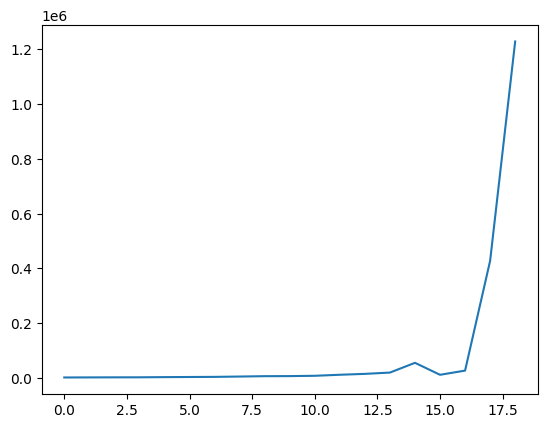

In [54]:
df.loc[~pd.isna(df["weightedAverageShsOutDil"]), "weightedAverageShsOutDil"].reset_index(drop=True).plot()

In [75]:
start, end = (slope * x)[0], (slope * x)[-1]
slope_percentage = (end - start) / start
start, end, slope_percentage

(-124817.5512820513, -3370073.884615385, 26.0)

In [77]:
start, end = (slope * x + y_intercept)[0], (slope * x + y_intercept)[-1]
slope_percentage = (end - start) / start
start, end, slope_percentage

(4513560.75925926, 1268304.4259259263, -0.7190013619902896)

In [30]:
y_5y = df.tail(5).loc[~pd.isna(df.tail(5)["weightedAverageShsOutDil"]), "weightedAverageShsOutDil"]
x_5y = range(len(y_5y))
slope_5y, y_intercept_5y = np.polyfit(
    x_5y,
    y_5y,
    1,
)
start_5y, end_5y = (slope_5y * x_5y + y_intercept_5y)[0], (slope_5y * x_5y + y_intercept_5y)[-1]
slope_percentage_5y = (end_5y - start_5y) / start_5y
slope_percentage_5y

-2.1618557074995836e-16

In [31]:
last_date_financials = df[
    df["fillingDate"] == max(df["fillingDate"])
]
last_date_financials

,date,symbol,reportedCurrency,cik,fillingDate,acceptedDate,calendarYear,period,cashAndCashEquivalents,shortTermInvestments,...,totalOtherIncomeExpensesNet,incomeBeforeTax,incomeBeforeTaxRatio,incomeTaxExpense,netIncome,netIncomeRatio,eps,epsdiluted,weightedAverageShsOut,weightedAverageShsOutDil
0,2023-06-30,FDEU,USD,0001646109,2023-06-30,2023-06-29 20:00:00,2023,Q2,5221998.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [33]:
ncavps = compute_ncavps(last_date_financials.to_dict("records")[0])
ncavps

nan

In [13]:
%%time
# NEW CODE
# compute preliminary ncav (current assets - total liabilities)
preliminary_ncav = {}
zero_current_price = []
missed_ticker = []
tickers_to_accept = []
notes = {}
full_df = pd.DataFrame()

# Get all tickers
query = """
select *
from company_tickers
"""
with engine.connect() as connection:
    df = pd.read_sql(query, connection)

all_tickers = df["ticker"].tolist()

# Filter tickers that exist in tradingview/ibkr or something
all_tickers = [ticker for ticker in all_tickers if "." not in ticker]
potential_candidates = []
single_api_call_amount = 300
for idx, ticker in tqdm(enumerate(all_tickers[3000:6000])):
    # api limit consideration
    if (idx % single_api_call_amount == 0) and (idx != 0):
        print(f"{idx} out of {len(all_tickers)} seen")
    query = f"""
    select *
    from financial_stmts
    where symbol_bs = '{ticker}'
    order by date desc
    limit 1;
    """
    with engine.connect() as connection:
        df = pd.read_sql(query, connection)
    if len(df) == 0:
        continue
    currency = df.loc[0, "reportedCurrency_bs"]
    period = df.loc[0, "period_bs"]
    if period is None:
        continue
    query = f"""
    select *
    from financial_stmts
    where symbol_bs = '{ticker}' and
        period_bs = '{period}'
    """
    with engine.connect() as connection:
        df = pd.read_sql(query, connection)
    
    cols = list(df.columns)
    cols = [col.split("_")[0] for col in cols]
    df.columns = cols
    df = df[::-1]
    y = df.loc[~pd.isna(df["weightedAverageShsOutDil"]), "weightedAverageShsOutDil"].tail(10)
    # x = range(1, len(y) + 1)
    # if len(y) < 2:
    #     continue
    # slope, y_intercept = np.polyfit(
    #     x,
    #     y, #df.loc[~pd.isna(df["weightedAverageShsOutDil"]), "weightedAverageShsOutDil"],
    #     1,
    # )
    # # start, end = (slope * x + y_intercept)[0], (slope * x + y_intercept)[-1]
    # start, end = (slope * x)[0], (slope * x)[-1]
    # slope_percentage = (end - start) / start
    slope_percentage = compute_change_percentage(y)
    if slope_percentage is None or slope_percentage > 0.2:
        continue
    y_5y = df.loc[~pd.isna(df["weightedAverageShsOutDil"]), "weightedAverageShsOutDil"].tail(5)
    # x_5y = range(1, len(y_5y) + 1)
    # if len(y_5y) < 2:
    #     continue
    # slope_5y, y_intercept_5y = np.polyfit(
    #     x_5y,
    #     y_5y,
    #     1,
    # )
    # # start_5y, end_5y = (slope_5y * x_5y + y_intercept_5y)[0], (slope_5y * x_5y + y_intercept_5y)[-1]
    # start_5y, end_5y = (slope_5y * x_5y)[0], (slope_5y * x_5y)[-1]
    # slope_percentage_5y = (end_5y - start_5y) / start_5y
    slope_percentage_5y = compute_change_percentage(y_5y)
    if slope_percentage_5y is None or slope_percentage_5y > 0.2:
        continue
        
    # get ncav and liqv
    last_date_financials = df[
        df["fillingDate"] == max(df["fillingDate"])
    ]
    ncavps = compute_ncavps(last_date_financials.to_dict("records")[0])
    if np.isnan(ncavps):
        continue
    ncavps = currency_to_usd(ncavps, currency, RATES_TO_USD)
    if ncavps is None:
        continue
    # get current price
    current_price = get_current_price(ticker)
    time.sleep(0.5)
    if current_price is None:
        continue
        
    # filter by value
    if current_price > ncavps:
        continue

    ncav_mos = round(100 * (ncavps - current_price) / ncavps, 2)
    if ncav_mos < 33 or ncav_mos > 95:
        continue
    
    # add candidate if all filters are passed
    potential_candidates.append(ticker)
    
connection.close()
engine.dispose()

300it [02:25,  1.98it/s]

300 out of 25812 seen


597it [05:13,  1.86it/s]

600 out of 25812 seen


900it [08:02,  2.20it/s]

900 out of 25812 seen


1199it [11:01,  1.62it/s]

1200 out of 25812 seen


1442it [13:09,  1.83it/s]


KeyboardInterrupt: 

In [14]:
len(potential_candidates)

20

In [20]:
API_BASE_PATH

'https://financialmodelingprep.com/api/v3'

In [36]:
KEY

In [35]:
#get_current_price("AAISX")

url_price = f"{API_BASE_PATH}/quote/AAPL"

params = {
    "limit": 1,
    "apikey": KEY,
}
response = requests.get(url_price, params=params)
response.raise_for_status()  # Raise an exception for HTTP errors
data_price = response.json()
data_price[0]["price"]

HTTPError: 401 Client Error: Unauthorized for url: https://financialmodelingprep.com/api/v3/quote/AAPL?limit=1

  0%|          | 0/20 [00:00<?, ?it/s]

YLDGY
current price 10.62
YLDGY.	 Current price: 10.62.	 NCAV: 42.612084033534366.	 LIQV: 42.612084033534366


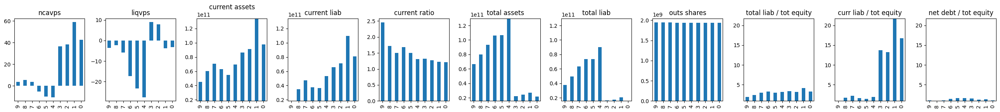

  5%|▌         | 1/20 [00:02<00:42,  2.26s/it]

AHRNW
TSBX
MVAC
FUBAF
current price 3.195
FUBAF.	 Current price: 3.195.	 NCAV: 8.018183962371445.	 LIQV: 8.018183962371445


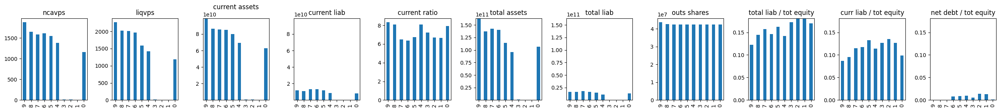

 25%|██▌       | 5/20 [00:04<00:11,  1.25it/s]

LBBBR
KTTAW
BOYAF
ACMC
current price 0.04
ACMC.	 Current price: 0.04.	 NCAV: 2.9159947703623645.	 LIQV: 2.9159947703623645


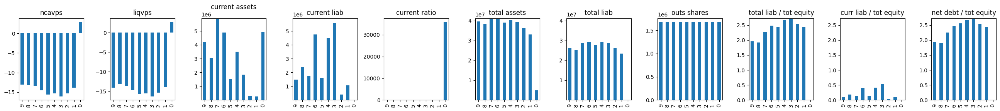

 45%|████▌     | 9/20 [00:06<00:07,  1.50it/s]

GEEXW
KDCE
current price 0.016
KDCE.	 Current price: 0.016.	 NCAV: 0.0681459366139021.	 LIQV: 0.0681459366139021


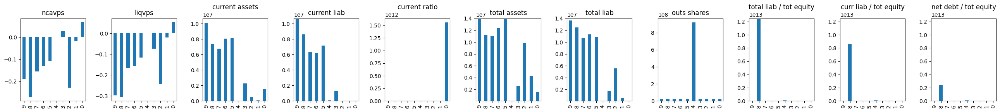

 55%|█████▌    | 11/20 [00:08<00:07,  1.28it/s]

PEV
JYOGF
current price 2.55
JYOGF.	 Current price: 2.55.	 NCAV: 393.7877067092263.	 LIQV: 393.7877067092263


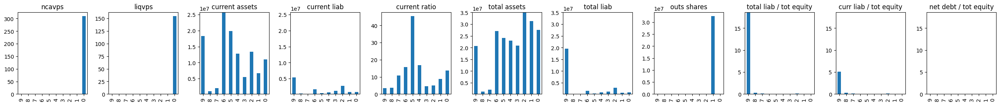

 65%|██████▌   | 13/20 [00:10<00:06,  1.16it/s]

BCAUF
current price 0.3303
BCAUF.	 Current price: 0.3303.	 NCAV: 0.8929306579488139.	 LIQV: 0.8929306579488139


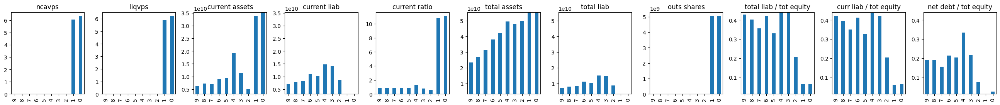

 70%|███████   | 14/20 [00:13<00:06,  1.10s/it]

TILCF
current price 0.8
TILCF.	 Current price: 0.8.	 NCAV: 2.896811365003703.	 LIQV: 2.896811365003703


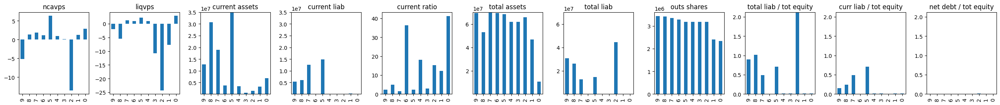

 75%|███████▌  | 15/20 [00:15<00:06,  1.30s/it]

QGLHF
current price 0.0706
QGLHF.	 Current price: 0.0706.	 NCAV: 0.1642611345753158.	 LIQV: 0.1642611345753158


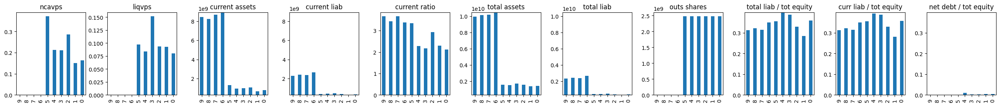

 80%|████████  | 16/20 [00:17<00:05,  1.49s/it]

LMSMF
current price 0.0004
LMSMF.	 Current price: 0.0004.	 NCAV: 0.00676080389228055.	 LIQV: 0.00676080389228055


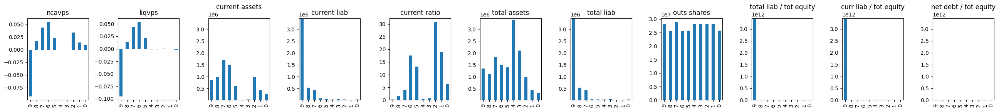

 95%|█████████▌| 19/20 [00:19<00:01,  1.01s/it]

GRPH
VIAOY
ABCVX
current price 23.82
ABCVX.	 Current price: 23.82.	 NCAV: 116.59899689813888.	 LIQV: 116.59899689813888


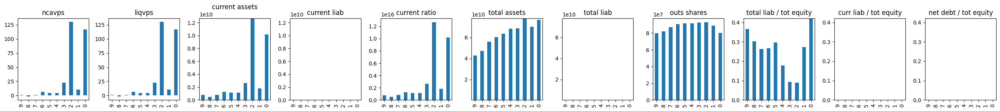

100%|██████████| 20/20 [00:21<00:00,  1.09s/it]

CPU times: user 15.8 s, sys: 2.49 s, total: 18.3 s
Wall time: 21.9 s


In [28]:
%%time
## DELETE THIS CELL IMMEDIATELY ##
# NEW CODE
# compute preliminary ncav (current assets - total liabilities)
preliminary_ncav = {}
zero_current_price = []
missed_ticker = []
tickers_to_accept = []
notes = {}
full_df = pd.DataFrame()

for ticker in tqdm(potential_candidates):
    print(ticker)
    query = f"""
    select period_bs, "reportedCurrency_bs"
    from financial_stmts
    where symbol_bs = '{ticker}'
    order by date desc
    limit 1;
    """
    with engine.connect() as connection:
        df = pd.read_sql(query, connection)
    if len(df) == 0:
        continue
    currency = df.loc[0, "reportedCurrency_bs"]
    period = df.loc[0, "period_bs"]
    query = f"""
    select *
    from financial_stmts
    where symbol_bs = '{ticker}' and period_bs = '{period}'
    order by date desc
    limit 10
    """

    with engine.connect() as connection:
        hist_df = pd.read_sql(query, connection)
    if len(hist_df) <= 5:
        continue
    cols = list(hist_df.columns)
    cols = [col.split("_")[0] for col in cols]
    hist_df.columns = cols
    #print("hist_df")
    #print(hist_df)
    #a
    """data_balance_sheet = get_balance_sheet_info(ticker, 10)
    if len(data_balance_sheet) <= 5:
        continue
    data_income_stmt = get_income_stmt_info(ticker, 10)
    if len(data_income_stmt) <= 5:
        continue"""
    current_price = get_current_price(ticker)
    print(f"current price {current_price}")
    if current_price is None:
        continue
        
    """latest_balance_sheet = data_balance_sheet[-1]
    latest_income_stmt = data_income_stmt[-1]
    latest_balance_sheet.update(
        {
            "weightedAverageShsOutDil": latest_income_stmt["weightedAverageShsOutDil"],
            "income_stmt_date": latest_income_stmt["date"],
        }
    )
    if latest_balance_sheet["date"] != latest_balance_sheet["income_stmt_date"]:
        print(f"dates of last income statement and balance sheet are not the same for ticker {ticker}")
        print(f"\tincome stmt date: {latest_balance_sheet['income_stmt_date']}, balance sheet date: {latest_balance_sheet['date']}")
        continue"""
        
    #ncavps = compute_ncavps(latest_balance_sheet)
    ncavps = compute_ncavps(hist_df.to_dict("records")[0])
    ncavps = currency_to_usd(ncavps, currency, RATES_TO_USD)
    #liqvps = compute_liqvps(latest_balance_sheet, CURRENT_ASSETS_FACTORS)
    liqvps = compute_ncavps(hist_df.to_dict("records")[0])
    liqvps = currency_to_usd(liqvps, currency, RATES_TO_USD)
    
    if (current_price > ncavps) and (current_price > liqvps):
        continue
    
    """balance_sheet_df = pd.DataFrame(data_balance_sheet)
    income_stmt_df = pd.DataFrame(data_income_stmt)
    balance_sheet_df = balance_sheet_df.set_index("date")
    income_stmt_df = income_stmt_df.set_index("date")"""
    balance_sheet_df = hist_df[bs_cols]
    income_stmt_df = hist_df[is_cols]
    
    try:
        fs_df = pd.concat([balance_sheet_df, income_stmt_df], axis=1, join="inner")
    except:
        print("dates incoherence")
        continue
    
    fs_df = fs_df.iloc[::-1] # from oldest to newest
    # compute NCAV
    fs_df["ncavps"] = fs_df.apply(compute_ncavps, axis=1)
    # compute LIQV
    fs_df["liqvps"] = fs_df.apply(compute_liqvps, args=(CURRENT_ASSETS_FACTORS,), axis=1)
    # compute current ratio
    fs_df["current_ratio"] = fs_df.apply(compute_current_ratio, axis=1)
    # compute de ratio 1
    fs_df["de_ratio1"] = fs_df.apply(compute_de_ratio, args=("totalLiabilities",), axis=1)
    # compute de ratio 2
    fs_df["de_ratio2"] = fs_df.apply(compute_de_ratio, args=("totalCurrentLiabilities",), axis=1)
    # compute de ratio 3
    fs_df["de_ratio3"] = fs_df.apply(compute_de_ratio, args=("totalDebt",), axis=1)

    # plot indicators
    print(f"{ticker}.\t Current price: {current_price}.\t NCAV: {ncavps}.\t LIQV: {liqvps}")
    plot_indicators_ncav(fs_df)

    full_df = pd.concat([full_df, fs_df.tail(1)])

    time.sleep(1)

## DELETE THIS CELL IMMEDIATELY ##

  0%|                               | 0/520 [00:00<?, ?it/s]

TYTMF
AEYGQ
SECO
CEADW
current price 0.0107
CEADW.	 Current price: 0.0107.	 NCAV: 14.913891192219584.	 LIQV: 14.913891192219584


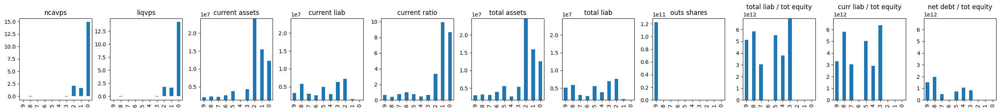

  1%|▏                      | 4/520 [00:02<04:34,  1.88it/s]

SWGAY
current price 9.9
SWGAY.	 Current price: 9.9.	 NCAV: 186.08898465368213.	 LIQV: 186.08898465368213


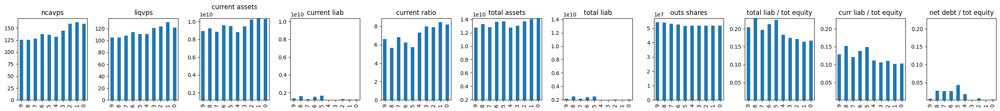

  1%|▏                      | 5/520 [00:03<07:34,  1.13it/s]

TRLC
SFBI
current price 0.0001
SFBI.	 Current price: 0.0001.	 NCAV: 1.893860313635198.	 LIQV: 1.893860313635198


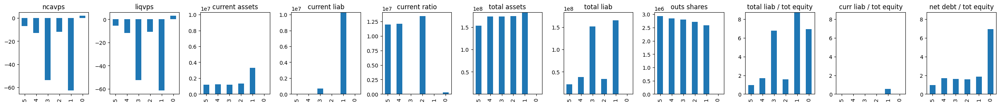

  1%|▎                      | 7/520 [00:05<07:42,  1.11it/s]

BGEM
CLINU
FDEU
current price 12.59
FDEU.	 Current price: 12.59.	 NCAV: nan.	 LIQV: nan


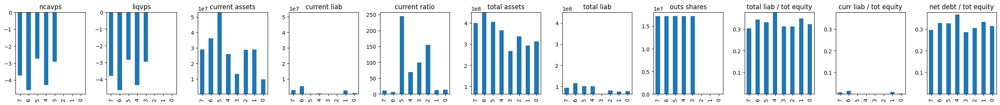

  2%|▍                     | 10/520 [00:07<06:30,  1.31it/s]

EDHD
ENMHF
current price 0.03
ENMHF.	 Current price: 0.03.	 NCAV: 0.04539852365103686.	 LIQV: 0.04539852365103686


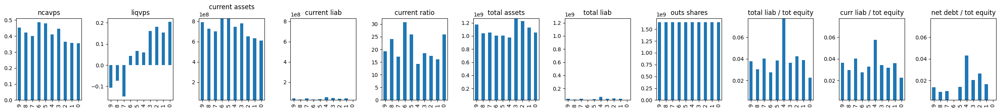

  2%|▌                     | 12/520 [00:09<07:01,  1.21it/s]

HUMBF
GER
current price 15.67
GER.	 Current price: 15.67.	 NCAV: nan.	 LIQV: nan


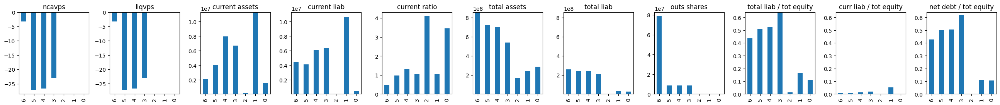

  3%|▌                     | 14/520 [00:11<07:13,  1.17it/s]

ZZHGF
current price 2.4
ZZHGF.	 Current price: 2.4.	 NCAV: nan.	 LIQV: nan


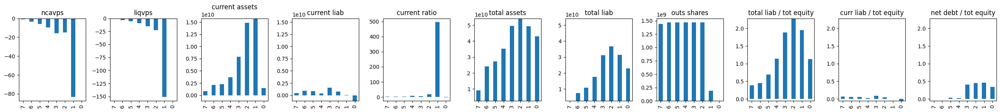

  3%|▋                     | 15/520 [00:13<08:45,  1.04s/it]

RFXRF
NDEKF
current price 16.84
NDEKF.	 Current price: 16.84.	 NCAV: 25.420334607739193.	 LIQV: 25.420334607739193


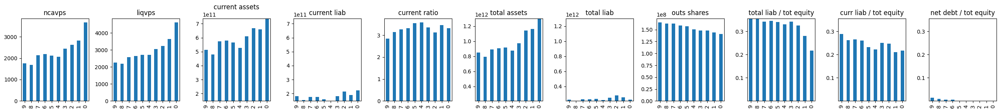

  3%|▋                     | 17/520 [00:15<08:24,  1.00s/it]

PGNT
current price 6.1
PGNT.	 Current price: 6.1.	 NCAV: 9.316994417312397.	 LIQV: 9.316994417312397


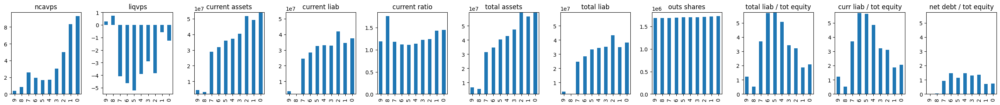

  3%|▊                     | 18/520 [00:17<09:47,  1.17s/it]

ML-WT
PALI
current price 3.89
PALI.	 Current price: 3.89.	 NCAV: 7.583034842070987.	 LIQV: 7.583034842070987


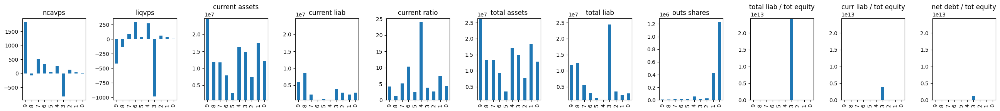

  4%|▊                     | 20/520 [00:19<09:28,  1.14s/it]

GLG
current price 0.0589
GLG.	 Current price: 0.0589.	 NCAV: 3.7052471670021814.	 LIQV: 3.7052471670021814


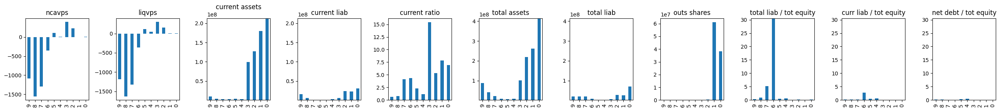

  4%|▉                     | 21/520 [00:21<11:06,  1.34s/it]

QNRX
UCASU
current price 0.0678
UCASU.	 Current price: 0.0678.	 NCAV: 0.20414674500116226.	 LIQV: 0.20414674500116226


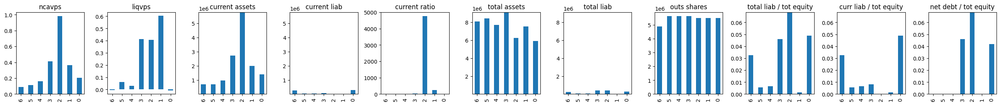

  4%|▉                     | 23/520 [00:23<09:46,  1.18s/it]

SECOY
BRIBF
NVPLF
GFAIW
current price 0.11
GFAIW.	 Current price: 0.11.	 NCAV: 1.0157245085872133.	 LIQV: 1.0157245085872133


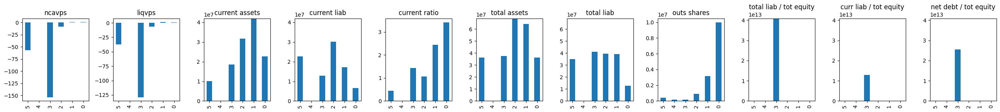

  5%|█▏                    | 27/520 [00:25<06:42,  1.23it/s]

QXO
CHAG
EJH
current price 1
EJH.	 Current price: 1.	 NCAV: 29.755728897338404.	 LIQV: 29.755728897338404


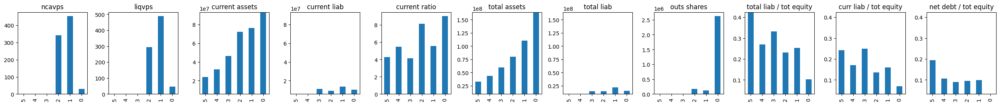

  6%|█▎                    | 30/520 [00:26<06:02,  1.35it/s]

GMVDW
VCF
current price 13.815
VCF.	 Current price: 13.815.	 NCAV: nan.	 LIQV: nan


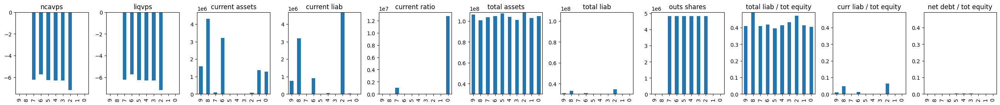

  6%|█▎                    | 32/520 [00:28<06:24,  1.27it/s]

NUVB-WT
MTP
current price 0.2851
MTP.	 Current price: 0.2851.	 NCAV: 8.835248999064742.	 LIQV: 8.835248999064742


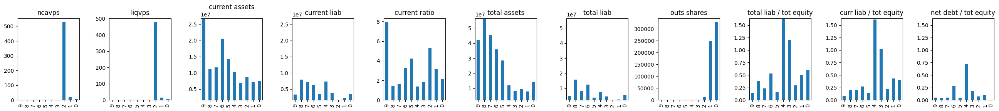

  8%|█▋                    | 39/520 [00:30<03:29,  2.30it/s]

LIQQF
OGBLY
BNR
BKKT-WT
VLN-WT
EBML
UNTCW
current price 0.55
UNTCW.	 Current price: 0.55.	 NCAV: 4.553966189856957.	 LIQV: 4.553966189856957


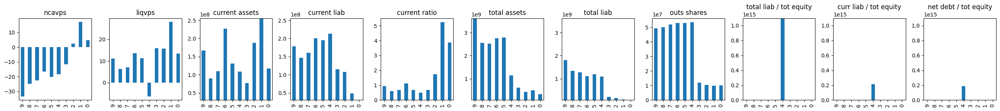

  8%|█▋                    | 41/520 [00:32<04:19,  1.85it/s]

PRRCF
PTPKF
MYSN
APEOF
current price 0.21
APEOF.	 Current price: 0.21.	 NCAV: 0.9722002815885535.	 LIQV: 0.9722002815885535


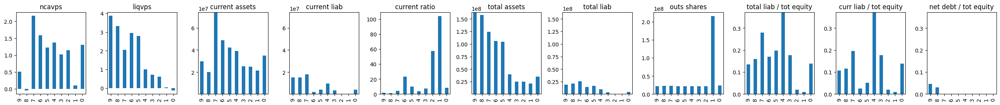

  9%|█▉                    | 45/520 [00:34<04:06,  1.93it/s]

NURO
current price 4.58
NURO.	 Current price: 4.58.	 NCAV: 8.423422316089896.	 LIQV: 8.423422316089896


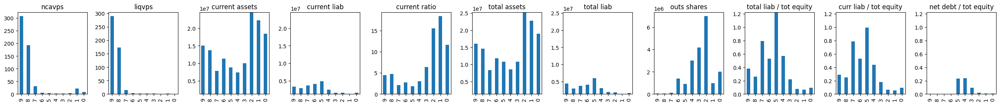

  9%|█▉                    | 46/520 [00:36<05:25,  1.46it/s]

BBI
current price 2.35
BBI.	 Current price: 2.35.	 NCAV: 5.792672707777909.	 LIQV: 5.792672707777909


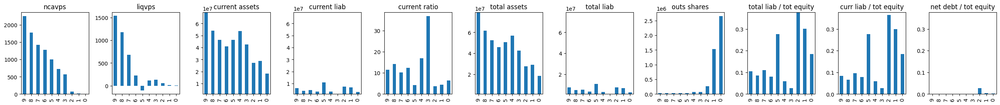

  9%|█▉                    | 47/520 [00:38<06:47,  1.16it/s]

FCRM
MDVL
current price 1.8
MDVL.	 Current price: 1.8.	 NCAV: 11.225389198913385.	 LIQV: 11.225389198913385


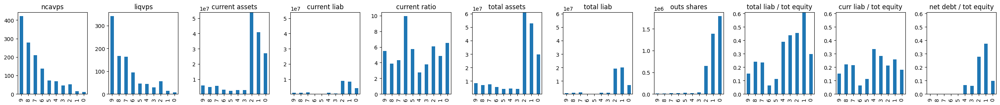

  9%|██                    | 49/520 [00:40<06:59,  1.12it/s]

JSEJF
current price 6.79
JSEJF.	 Current price: 6.79.	 NCAV: 22.115681272356117.	 LIQV: 22.115681272356117


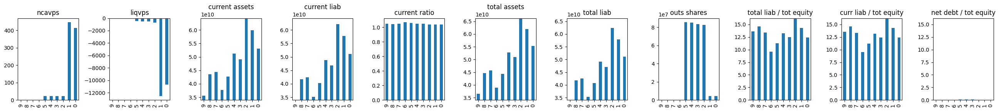

 10%|██                    | 50/520 [00:42<08:16,  1.06s/it]

YIKWF
CHNR
current price 0.8213
CHNR.	 Current price: 0.8213.	 NCAV: nan.	 LIQV: nan


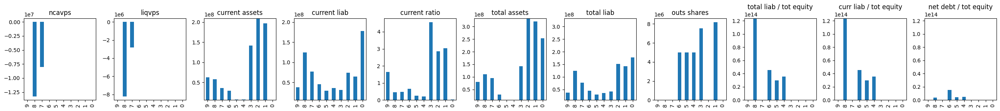

 10%|██▏                   | 52/520 [00:43<07:59,  1.02s/it]

IOR
current price 17.0001
IOR.	 Current price: 17.0001.	 NCAV: 26.45593724670579.	 LIQV: 26.45593724670579


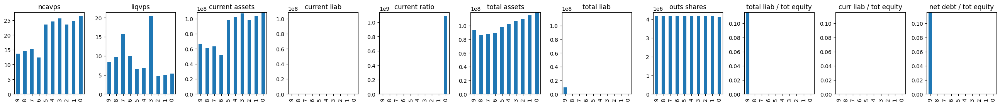

 10%|██▏                   | 53/520 [00:45<09:15,  1.19s/it]

NOBDF
MGHL
current price 0.45
MGHL.	 Current price: 0.45.	 NCAV: 1.5138879168124781.	 LIQV: 1.5138879168124781


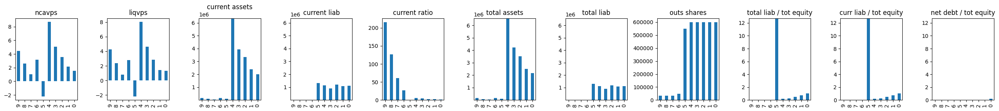

 11%|██▎                   | 55/520 [00:48<09:07,  1.18s/it]

REMYY
current price 6.62
REMYY.	 Current price: 6.62.	 NCAV: 17.222298006284976.	 LIQV: 17.222298006284976


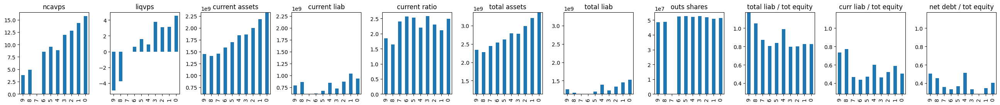

 11%|██▎                   | 56/520 [00:50<10:17,  1.33s/it]

SBOEY
current price 3.11
SBOEY.	 Current price: 3.11.	 NCAV: 8.883113566938738.	 LIQV: 8.883113566938738


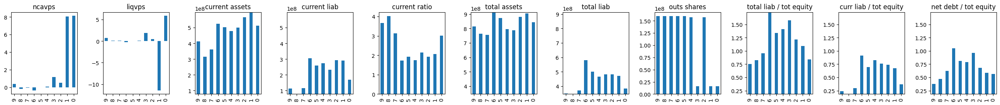

 11%|██▍                   | 57/520 [00:51<11:17,  1.46s/it]

NWGL
TJSCF
NEWA
AHRNW
SHLDQ
current price 0.1
SHLDQ.	 Current price: 0.1.	 NCAV: nan.	 LIQV: nan


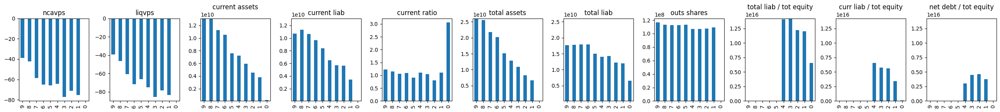

 12%|██▌                   | 62/520 [00:53<06:03,  1.26it/s]

TSBX
MVAC
HELKF
current price 82.754
HELKF.	 Current price: 82.754.	 NCAV: nan.	 LIQV: nan


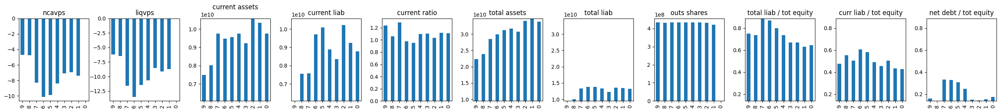

 12%|██▊                   | 65/520 [00:55<05:38,  1.35it/s]

FUBAF
current price 4.09
FUBAF.	 Current price: 4.09.	 NCAV: 8.018183962371445.	 LIQV: 8.018183962371445


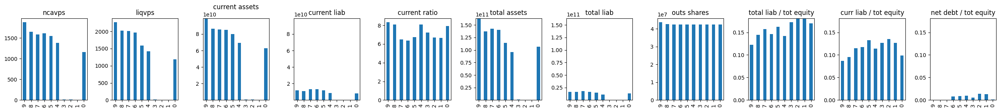

 13%|██▊                   | 66/520 [00:57<06:46,  1.12it/s]

LBBBR
LGHLW
current price 0.0083
LGHLW.	 Current price: 0.0083.	 NCAV: 2.015584272114405.	 LIQV: 2.015584272114405


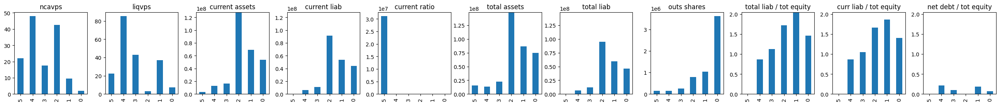

 13%|██▉                   | 68/520 [00:59<06:48,  1.11it/s]

CNNWQ
current price 0.0051
CNNWQ.	 Current price: 0.0051.	 NCAV: nan.	 LIQV: nan


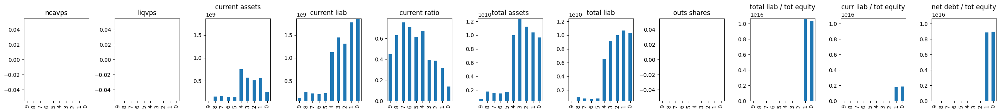

 13%|██▉                   | 69/520 [01:01<08:02,  1.07s/it]

WBQNL
KTTAW
BOYAF
ACMC
current price 0.04
ACMC.	 Current price: 0.04.	 NCAV: 2.9159947703623645.	 LIQV: 2.9159947703623645


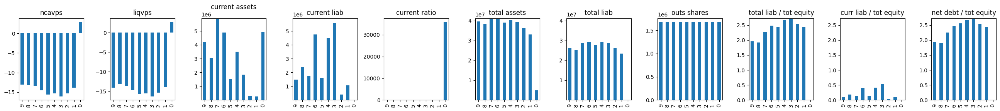

 14%|███                   | 73/520 [01:03<05:53,  1.26it/s]

GEEXW
ASCLF
current price 0.1567
ASCLF.	 Current price: 0.1567.	 NCAV: nan.	 LIQV: nan


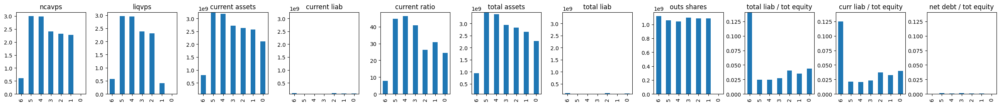

 14%|███▏                  | 75/520 [01:05<06:09,  1.20it/s]

JYOGF
current price 2.55
JYOGF.	 Current price: 2.55.	 NCAV: 393.7877067092263.	 LIQV: 393.7877067092263


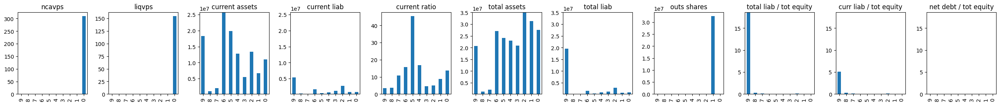

 15%|███▏                  | 76/520 [01:07<07:20,  1.01it/s]

ONCT
current price 1.435
ONCT.	 Current price: 1.435.	 NCAV: 5.118918918918919.	 LIQV: 5.118918918918919


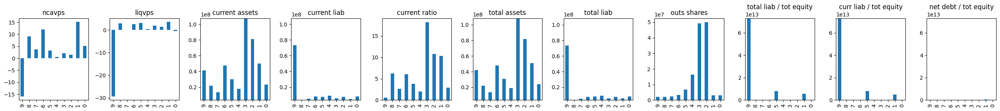

 15%|███▎                  | 77/520 [01:09<08:35,  1.16s/it]

BCAUF
current price 0.3303
BCAUF.	 Current price: 0.3303.	 NCAV: 0.8929306579488139.	 LIQV: 0.8929306579488139


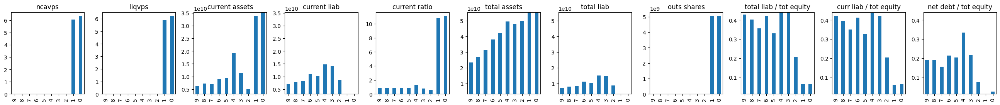

 15%|███▎                  | 78/520 [01:11<09:50,  1.34s/it]

TILCF
current price 0.95
TILCF.	 Current price: 0.95.	 NCAV: 2.896811365003703.	 LIQV: 2.896811365003703


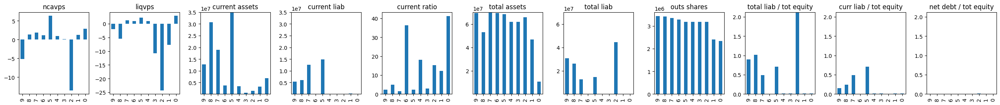

 15%|███▎                  | 79/520 [01:14<13:05,  1.78s/it]

QGLHF
current price 0.0706
QGLHF.	 Current price: 0.0706.	 NCAV: 0.1642611345753158.	 LIQV: 0.1642611345753158


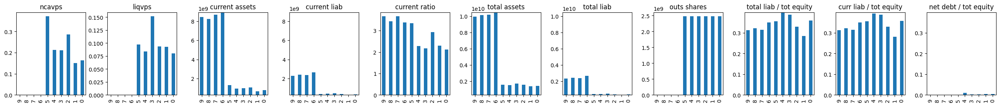

 15%|███▍                  | 80/520 [01:16<14:07,  1.93s/it]

SDRLF
GRPH
VIAOY
CBTX
current price 29.25
CBTX.	 Current price: 29.25.	 NCAV: nan.	 LIQV: nan


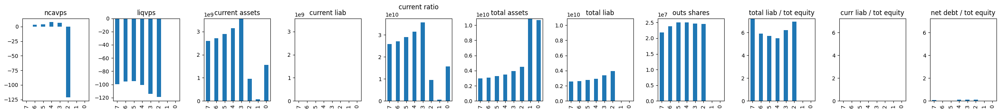

 16%|███▌                  | 84/520 [01:18<07:47,  1.07s/it]

ABCVX
current price 24.26
ABCVX.	 Current price: 24.26.	 NCAV: 116.59899689813888.	 LIQV: 116.59899689813888


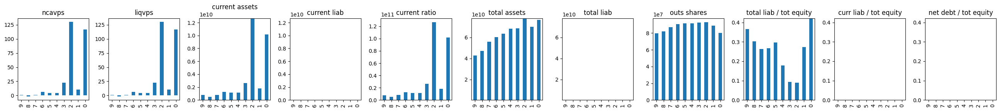

 16%|███▌                  | 85/520 [01:20<08:48,  1.21s/it]

ACRB
HROEY
current price 11.62
HROEY.	 Current price: 11.62.	 NCAV: 38.9518967612563.	 LIQV: 38.9518967612563


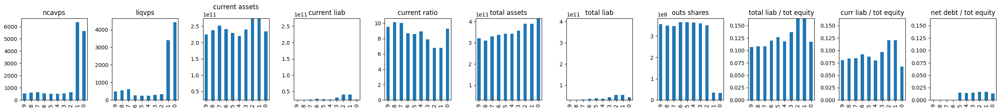

 17%|███▋                  | 87/520 [01:22<08:08,  1.13s/it]

CAKFY
current price 4.1
CAKFY.	 Current price: 4.1.	 NCAV: nan.	 LIQV: nan


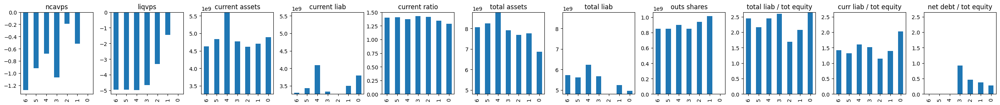

 17%|███▋                  | 88/520 [01:24<09:05,  1.26s/it]

HISNF
current price 0.032
HISNF.	 Current price: 0.032.	 NCAV: 0.17398112038226043.	 LIQV: 0.17398112038226043


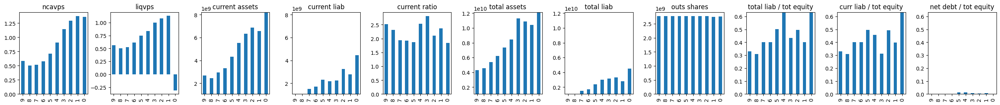

 17%|███▊                  | 89/520 [01:26<10:07,  1.41s/it]

SZNTF
SNPX
ABPPF
current price 1.8
ABPPF.	 Current price: 1.8.	 NCAV: nan.	 LIQV: nan


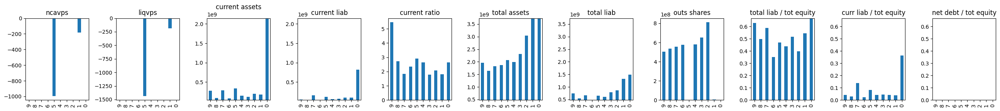

 18%|███▉                  | 92/520 [01:28<08:09,  1.14s/it]

PKKW
current price 9.9
PKKW.	 Current price: 9.9.	 NCAV: 25.343653559735035.	 LIQV: 25.343653559735035


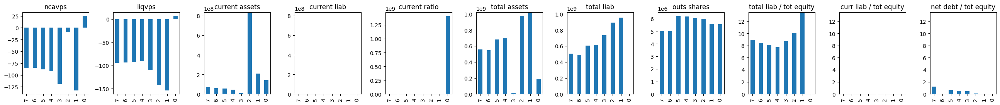

 18%|███▉                  | 93/520 [01:30<09:07,  1.28s/it]

BFRIW
SETO
LIANY
PRKWF
current price 3.16
PRKWF.	 Current price: 3.16.	 NCAV: nan.	 LIQV: nan


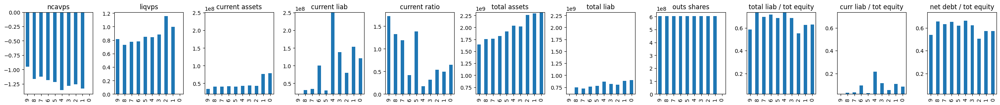

 19%|████                  | 97/520 [01:32<06:09,  1.15it/s]

ADOM
current price 0.28
ADOM.	 Current price: 0.28.	 NCAV: 0.4879430508889214.	 LIQV: 0.4879430508889214


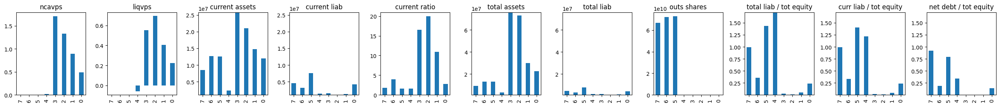

 19%|████▏                 | 98/520 [01:34<07:14,  1.03s/it]

BFRI
FLLIY
TAMG
current price 0.027
TAMG.	 Current price: 0.027.	 NCAV: nan.	 LIQV: nan


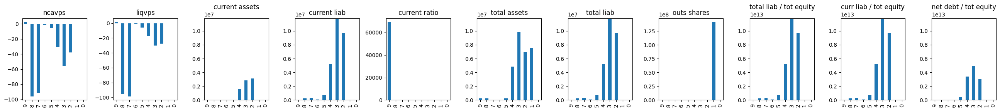

 19%|████                 | 101/520 [01:36<06:03,  1.15it/s]

AIPG
IVH
current price 11.18
IVH.	 Current price: 11.18.	 NCAV: nan.	 LIQV: nan


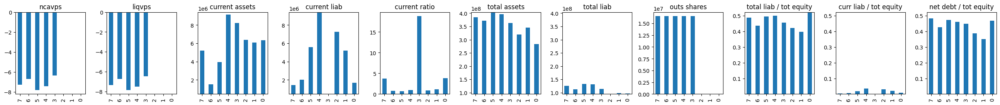

 20%|████▏                | 103/520 [01:38<06:48,  1.02it/s]

ABAKF
current price 2
ABAKF.	 Current price: 2.	 NCAV: nan.	 LIQV: nan


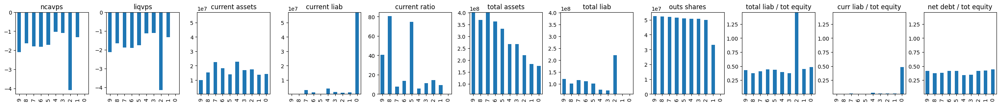

 20%|████▏                | 104/520 [01:40<07:48,  1.13s/it]

FRTCF
current price 0.16
FRTCF.	 Current price: 0.16.	 NCAV: 6.114066744406385.	 LIQV: 6.114066744406385


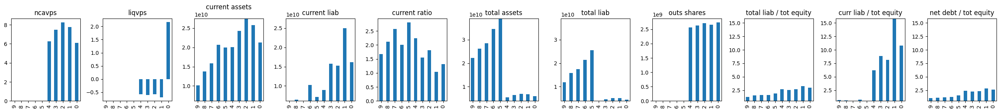

 20%|████▏                | 105/520 [01:42<08:47,  1.27s/it]

SXTP
AMRLF
current price 0.0011
AMRLF.	 Current price: 0.0011.	 NCAV: 0.06670873689512766.	 LIQV: 0.06670873689512766


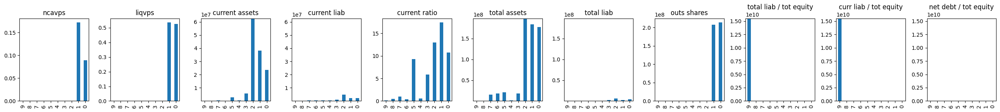

 21%|████▎                | 107/520 [01:45<08:49,  1.28s/it]

NCI
current price 0.92
NCI.	 Current price: 0.92.	 NCAV: nan.	 LIQV: nan


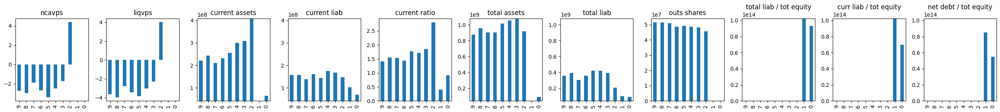

 21%|████▎                | 108/520 [01:47<09:44,  1.42s/it]

MTBLY
CETXW
current price 0.0129
CETXW.	 Current price: 0.0129.	 NCAV: 0.6194535300906129.	 LIQV: 0.6194535300906129


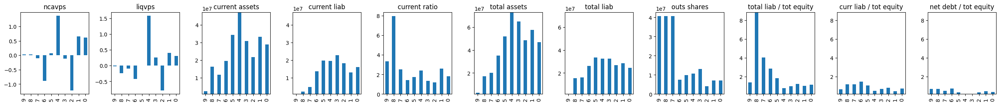

 21%|████▍                | 110/520 [01:49<08:32,  1.25s/it]

JT
RNDXF
current price 0.02
RNDXF.	 Current price: 0.02.	 NCAV: 0.04345602669413983.	 LIQV: 0.04345602669413983


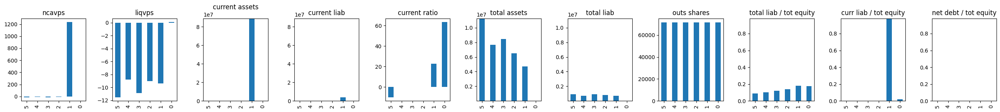

 22%|████▌                | 112/520 [01:50<07:40,  1.13s/it]

ASPT
BFFTF
AEI
current price 1.52
AEI.	 Current price: 1.52.	 NCAV: 4.567908329064303.	 LIQV: 4.567908329064303


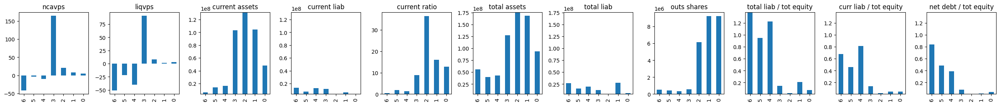

 22%|████▋                | 115/520 [01:52<06:10,  1.09it/s]

LAAAU
IDND
SLDPW
SPBBF
LVXFF
MNP
current price 10.58
MNP.	 Current price: 10.58.	 NCAV: nan.	 LIQV: nan


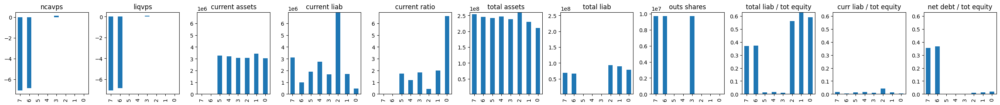

 23%|████▉                | 121/520 [01:54<03:56,  1.69it/s]

LOUIF
current price 0.01
LOUIF.	 Current price: 0.01.	 NCAV: nan.	 LIQV: nan


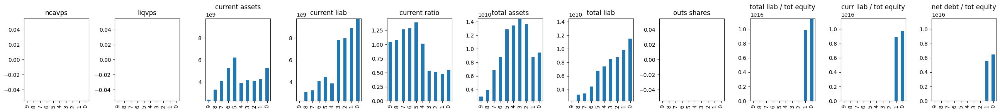

 23%|████▉                | 122/520 [01:56<04:57,  1.34it/s]

CNVAF
GPAK
ISD
ARTL
current price 1.15
ARTL.	 Current price: 1.15.	 NCAV: 4.241098677517803.	 LIQV: 4.241098677517803


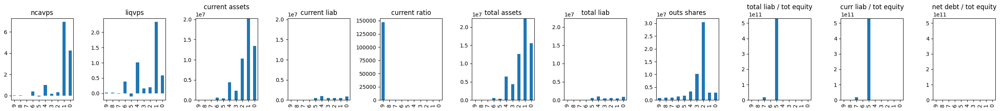

 24%|█████                | 126/520 [01:58<04:13,  1.56it/s]

HENKY
current price 20.84
HENKY.	 Current price: 20.84.	 NCAV: nan.	 LIQV: nan


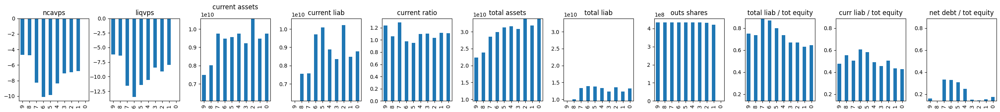

 24%|█████▏               | 127/520 [02:00<05:11,  1.26it/s]

SGIOY
current price 6.92
SGIOY.	 Current price: 6.92.	 NCAV: 14.876190809311618.	 LIQV: 14.876190809311618


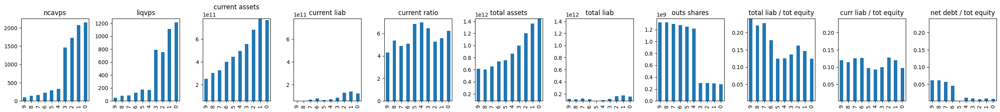

 25%|█████▏               | 128/520 [02:02<06:23,  1.02it/s]

SVREW
NNI
current price 114.46
NNI.	 Current price: 114.46.	 NCAV: 272.9078564931737.	 LIQV: 272.9078564931737


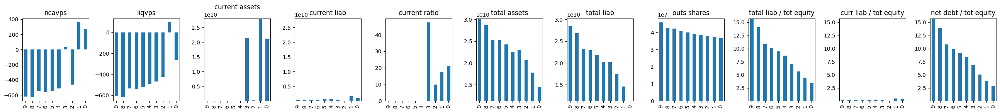

 25%|█████▎               | 130/520 [02:04<06:19,  1.03it/s]

SPOM
current price 0.00155
SPOM.	 Current price: 0.00155.	 NCAV: nan.	 LIQV: nan


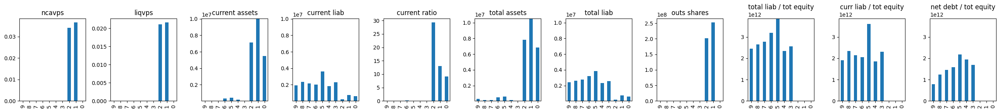

 25%|█████▎               | 131/520 [02:06<07:18,  1.13s/it]

BJDX
TIEMF
BKHPF
current price 9.13
BKHPF.	 Current price: 9.13.	 NCAV: 17.64660464674334.	 LIQV: 17.64660464674334


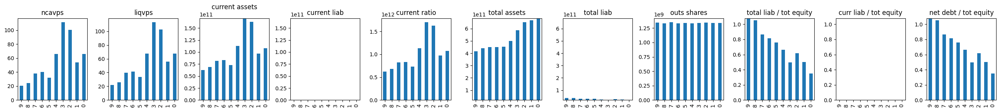

 26%|█████▍               | 134/520 [02:08<05:53,  1.09it/s]

CTV-WT
OBCN
current price 0.0001
OBCN.	 Current price: 0.0001.	 NCAV: nan.	 LIQV: nan


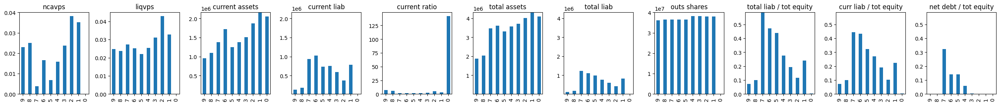

 26%|█████▍               | 136/520 [02:09<05:53,  1.09it/s]

DOYU
current price 9.18
DOYU.	 Current price: 9.18.	 NCAV: 23.57505487593206.	 LIQV: 23.57505487593206


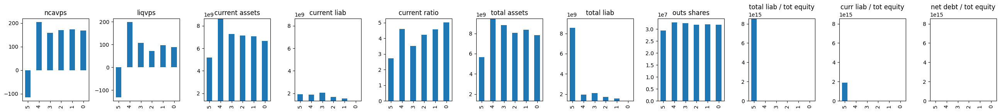

 26%|█████▌               | 137/520 [02:11<06:47,  1.07s/it]

ORSX
current price 0.0001
ORSX.	 Current price: 0.0001.	 NCAV: 9.922100977218076.	 LIQV: 9.922100977218076


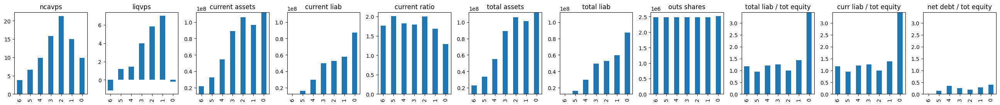

 27%|█████▌               | 138/520 [02:14<08:48,  1.38s/it]

PLIN
PPHPW
QRSM
current price 0.0003
QRSM.	 Current price: 0.0003.	 NCAV: 0.7463705466453763.	 LIQV: 0.7463705466453763


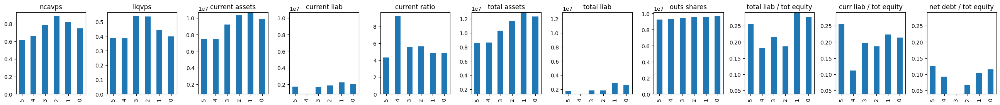

 27%|█████▋               | 141/520 [02:16<06:27,  1.02s/it]

VENAR
FBKIF
current price 37.5
FBKIF.	 Current price: 37.5.	 NCAV: 192.17020499319617.	 LIQV: 192.17020499319617


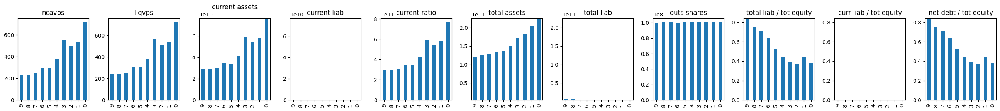

 28%|█████▊               | 143/520 [02:18<06:16,  1.00it/s]

XTERF
current price 0.0042
XTERF.	 Current price: 0.0042.	 NCAV: 0.02843166691605714.	 LIQV: 0.02843166691605714


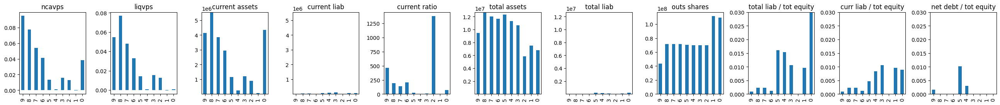

 28%|█████▊               | 144/520 [02:20<07:40,  1.23s/it]

AOLS
current price 0.0001
AOLS.	 Current price: 0.0001.	 NCAV: 0.0011506647554673014.	 LIQV: 0.0011506647554673014


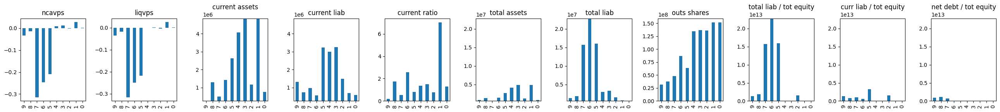

 28%|█████▊               | 145/520 [02:22<08:29,  1.36s/it]

MESO
current price 9.96
MESO.	 Current price: 9.96.	 NCAV: nan.	 LIQV: nan


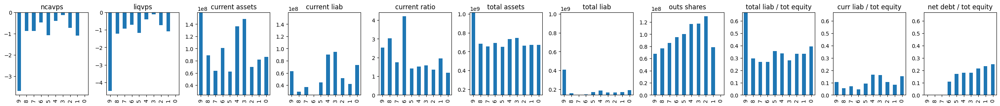

 28%|█████▉               | 146/520 [02:24<09:11,  1.47s/it]

SRCAF
current price 0.025
SRCAF.	 Current price: 0.025.	 NCAV: 0.03842203139272181.	 LIQV: 0.03842203139272181


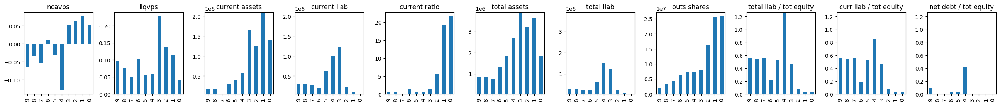

 28%|█████▉               | 147/520 [02:25<09:42,  1.56s/it]

PBTS
current price 1.1
PBTS.	 Current price: 1.1.	 NCAV: nan.	 LIQV: nan


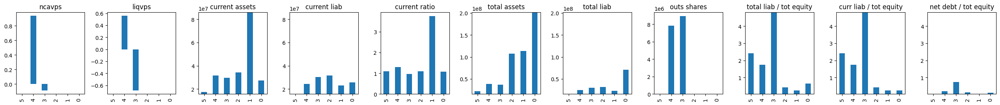

 28%|█████▉               | 148/520 [02:27<10:10,  1.64s/it]

TNHDF
current price 0.04
TNHDF.	 Current price: 0.04.	 NCAV: 0.12978270691004892.	 LIQV: 0.12978270691004892


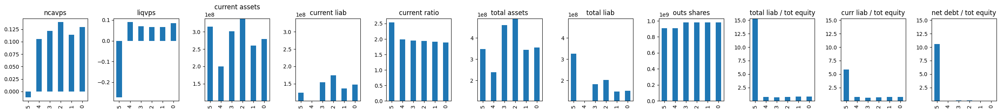

 29%|██████               | 149/520 [02:29<10:26,  1.69s/it]

TNSTF
FGRTF
current price 0.0121
FGRTF.	 Current price: 0.0121.	 NCAV: 0.04536445385334817.	 LIQV: 0.04536445385334817


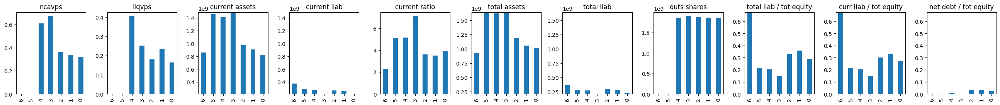

 29%|██████               | 151/520 [02:31<08:35,  1.40s/it]

LAREF
current price 7.45
LAREF.	 Current price: 7.45.	 NCAV: nan.	 LIQV: nan


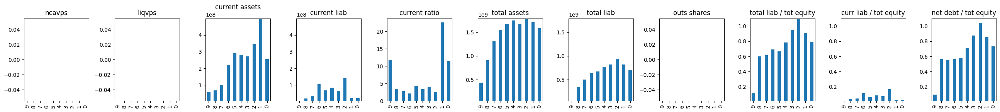

 29%|██████▏              | 152/520 [02:33<09:16,  1.51s/it]

CIZN
current price 8.88
CIZN.	 Current price: 8.88.	 NCAV: 46.08829728191135.	 LIQV: 46.08829728191135


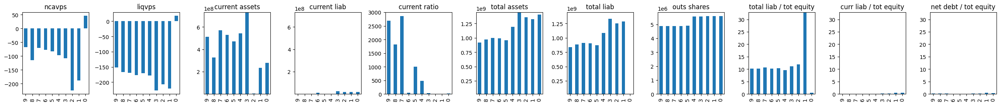

 29%|██████▏              | 153/520 [02:35<09:46,  1.60s/it]

TCJH
ELVT
current price 1.87
ELVT.	 Current price: 1.87.	 NCAV: 3.456549367813661.	 LIQV: 3.456549367813661


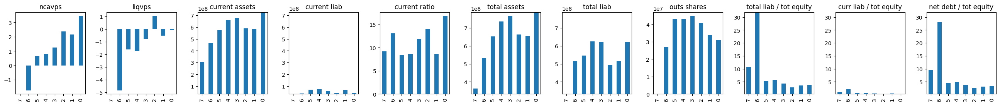

 30%|██████▎              | 155/520 [02:37<08:04,  1.33s/it]

WNMLA
current price 3.7
WNMLA.	 Current price: 3.7.	 NCAV: 8.497823448396414.	 LIQV: 8.497823448396414


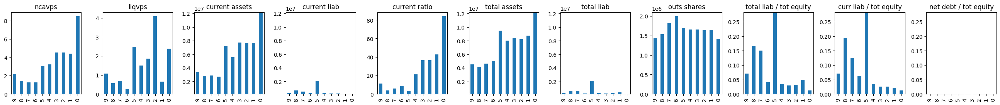

 30%|██████▎              | 156/520 [02:39<08:44,  1.44s/it]

MCAFR
ZDEC
GFKSY
current price 0.47105
GFKSY.	 Current price: 0.47105.	 NCAV: nan.	 LIQV: nan


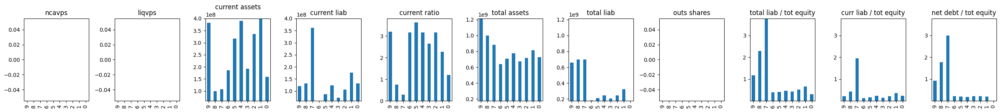

 31%|██████▍              | 159/520 [02:41<06:30,  1.08s/it]

VSTE
FREQ
SOLCF
current price 0.026
SOLCF.	 Current price: 0.026.	 NCAV: 0.04401901420810016.	 LIQV: 0.04401901420810016


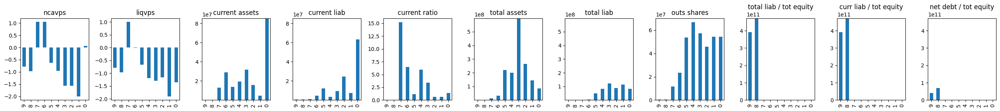

 31%|██████▌              | 162/520 [02:43<05:19,  1.12it/s]

SMX
WSTG
current price 31.11
WSTG.	 Current price: 31.11.	 NCAV: nan.	 LIQV: nan


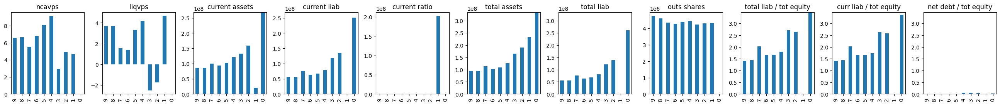

 32%|██████▌              | 164/520 [02:45<05:22,  1.10it/s]

AAISX
current price 20.61
AAISX.	 Current price: 20.61.	 NCAV: 113.11217208014831.	 LIQV: 113.11217208014831


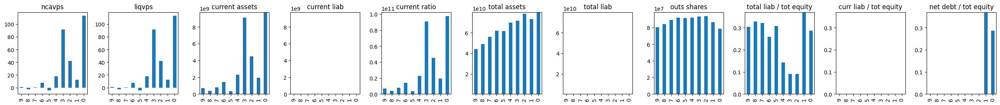

 32%|██████▋              | 165/520 [02:46<06:20,  1.07s/it]

MCCHF
current price 0.45
MCCHF.	 Current price: 0.45.	 NCAV: 1.1257938570559936.	 LIQV: 1.1257938570559936


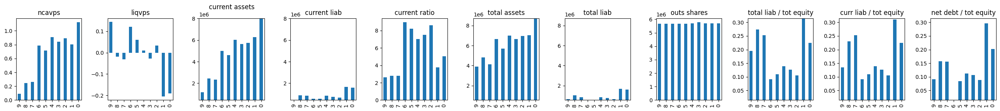

 32%|██████▋              | 166/520 [02:48<07:16,  1.23s/it]

CCHI
current price 0.11
CCHI.	 Current price: 0.11.	 NCAV: 6.8751071894438995.	 LIQV: 6.8751071894438995


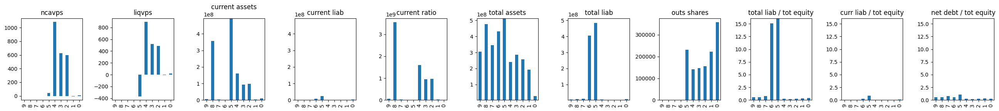

 32%|██████▋              | 167/520 [02:50<08:03,  1.37s/it]

DLTXF
current price 0.0002
DLTXF.	 Current price: 0.0002.	 NCAV: 0.0008156149360426855.	 LIQV: 0.0008156149360426855


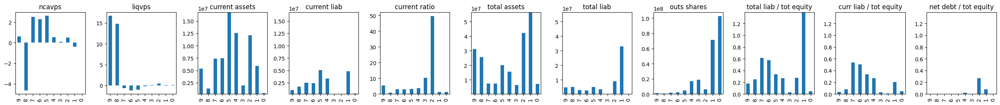

 32%|██████▊              | 168/520 [02:52<08:45,  1.49s/it]

HUNTF
RCWDF
current price 0.0054
RCWDF.	 Current price: 0.0054.	 NCAV: 0.7193507819032294.	 LIQV: 0.7193507819032294


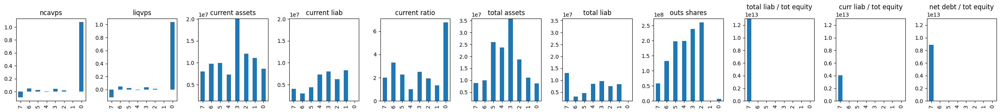

 33%|██████▊              | 170/520 [02:54<07:21,  1.26s/it]

STAOF
current price 0.035
STAOF.	 Current price: 0.035.	 NCAV: 0.0647588720238194.	 LIQV: 0.0647588720238194


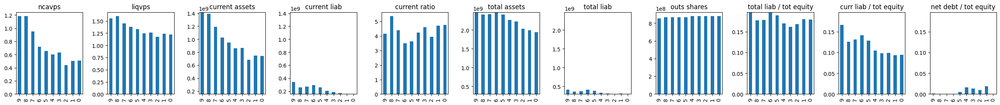

 33%|██████▉              | 171/520 [02:56<08:12,  1.41s/it]

BETSF
JWACR
EDVR
AMGY
current price 0.0001
AMGY.	 Current price: 0.0001.	 NCAV: 0.8037346429856375.	 LIQV: 0.8037346429856375


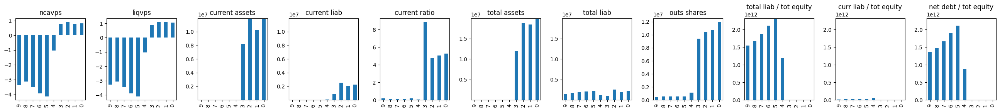

 34%|███████              | 175/520 [02:58<05:06,  1.12it/s]

SUNWQ
AACAY
current price 4.22
AACAY.	 Current price: 4.22.	 NCAV: nan.	 LIQV: nan


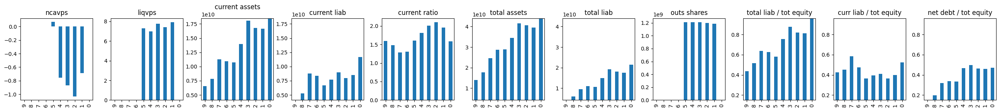

 34%|███████▏             | 177/520 [03:00<05:09,  1.11it/s]

SHCRW
SAITW
ONMBF
KYCHW
EATBF
GPCO
OSHDF
LGNZZ
current price 0.14
LGNZZ.	 Current price: 0.14.	 NCAV: 12.261593077435101.	 LIQV: 12.261593077435101


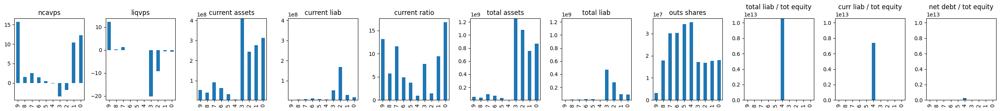

 36%|███████▍             | 185/520 [03:02<02:45,  2.02it/s]

EVKG
ZICX
LTHIF
current price 0.0072
LTHIF.	 Current price: 0.0072.	 NCAV: 0.013580070188539918.	 LIQV: 0.013580070188539918


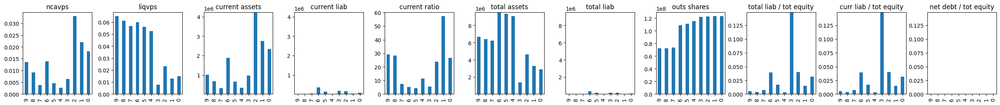

 36%|███████▌             | 188/520 [03:04<02:55,  1.89it/s]

LGNXZ
current price 0.004
LGNXZ.	 Current price: 0.004.	 NCAV: 12.261593077435101.	 LIQV: 12.261593077435101


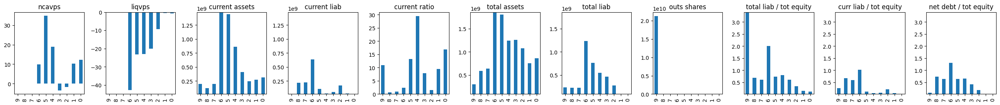

 36%|███████▋             | 189/520 [03:05<03:41,  1.49it/s]

BRNHF
HENGY
current price 0.38
HENGY.	 Current price: 0.38.	 NCAV: 1.450189880274635.	 LIQV: 1.450189880274635


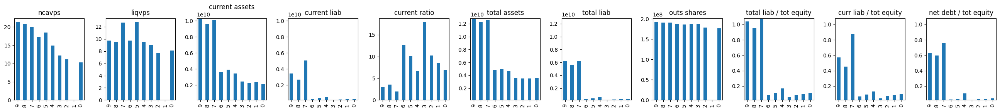

 37%|███████▋             | 191/520 [03:07<04:01,  1.36it/s]

SGSI
current price 0.2
SGSI.	 Current price: 0.2.	 NCAV: 1.2576169747937145.	 LIQV: 1.2576169747937145


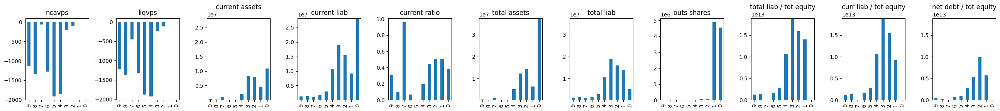

 37%|███████▊             | 192/520 [03:09<04:55,  1.11it/s]

AMOV
current price 20.75
AMOV.	 Current price: 20.75.	 NCAV: nan.	 LIQV: nan


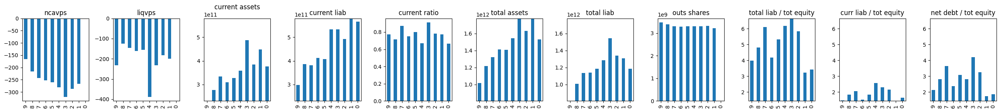

 37%|███████▊             | 193/520 [03:11<05:57,  1.09s/it]

BIF
CWWBF
BOFKF
current price 43.5
BOFKF.	 Current price: 43.5.	 NCAV: 78.31678059326111.	 LIQV: 78.31678059326111


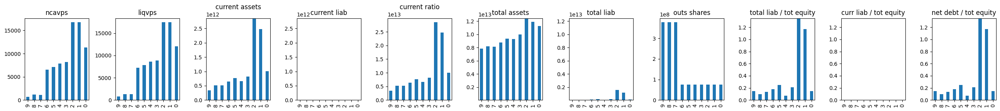

 38%|███████▉             | 196/520 [03:13<04:55,  1.10it/s]

GTWCF
current price 0.96
GTWCF.	 Current price: 0.96.	 NCAV: 15.955172555946692.	 LIQV: 15.955172555946692


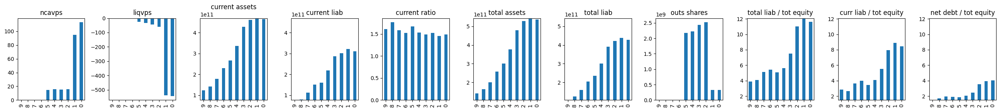

 38%|███████▉             | 197/520 [03:15<05:45,  1.07s/it]

FIXX
current price 0.9347
FIXX.	 Current price: 0.9347.	 NCAV: 14.77092597828788.	 LIQV: 14.77092597828788


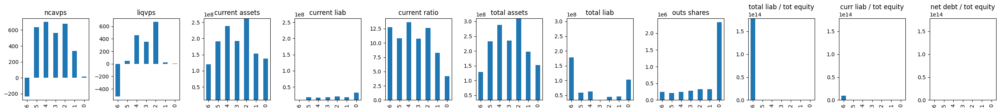

 38%|███████▉             | 198/520 [03:17<06:34,  1.23s/it]

MYSZ
current price 1.8995
MYSZ.	 Current price: 1.8995.	 NCAV: 5.14425622022234.	 LIQV: 5.14425622022234


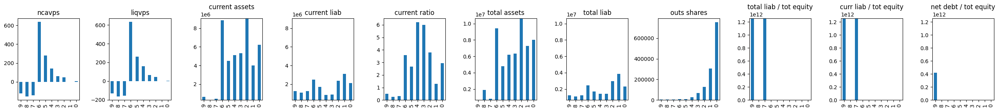

 38%|████████             | 199/520 [03:19<07:19,  1.37s/it]

SOHVY
current price 6.47
SOHVY.	 Current price: 6.47.	 NCAV: 10.906620088598562.	 LIQV: 10.906620088598562


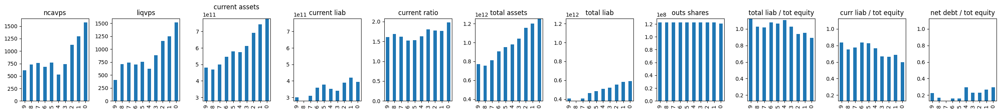

 38%|████████             | 200/520 [03:21<07:57,  1.49s/it]

EQRXW
GNTTF
MGX
LQR
NRUC
current price 25.2
NRUC.	 Current price: 25.2.	 NCAV: nan.	 LIQV: nan


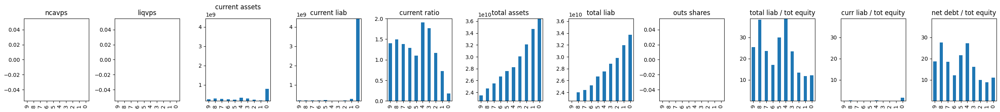

 39%|████████▎            | 205/520 [03:23<04:13,  1.24it/s]

BKGFY
current price 12.59
BKGFY.	 Current price: 12.59.	 NCAV: 37.722217071395804.	 LIQV: 37.722217071395804


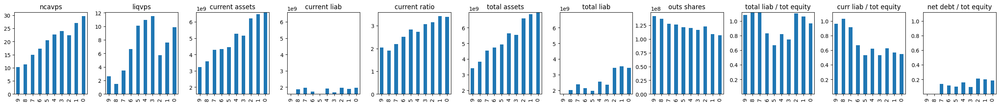

 40%|████████▎            | 206/520 [03:25<05:02,  1.04it/s]

CSGH
current price 1e-05
CSGH.	 Current price: 1e-05.	 NCAV: 0.543837270464476.	 LIQV: 0.543837270464476


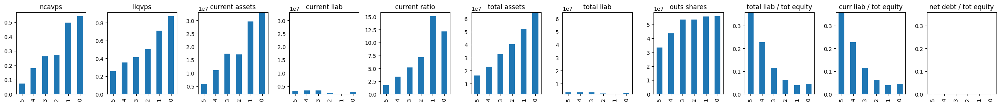

 40%|████████▎            | 207/520 [03:26<05:52,  1.13s/it]

SDXEF
current price 0.0141
SDXEF.	 Current price: 0.0141.	 NCAV: nan.	 LIQV: nan


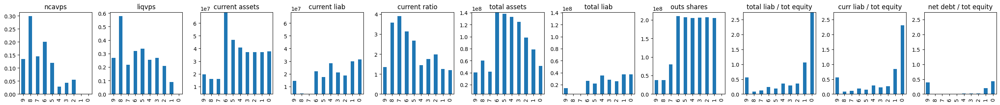

 40%|████████▍            | 208/520 [03:28<06:39,  1.28s/it]

CDCTF
current price 12.72
CDCTF.	 Current price: 12.72.	 NCAV: 20.393321164166128.	 LIQV: 20.393321164166128


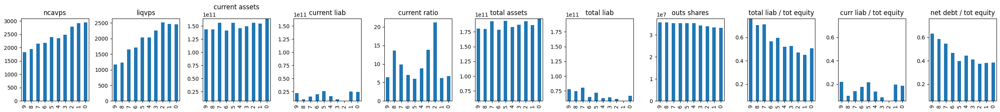

 40%|████████▍            | 209/520 [03:30<07:24,  1.43s/it]

CYAD
current price 0.47
CYAD.	 Current price: 0.47.	 NCAV: 6724.305677179184.	 LIQV: 6724.305677179184


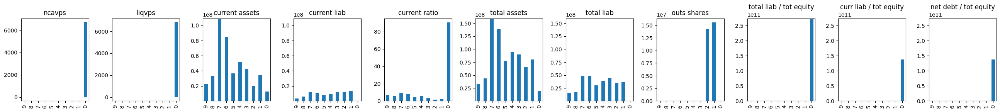

 40%|████████▍            | 210/520 [03:32<07:59,  1.55s/it]

AIJTY
CDGXY
current price 2.51
CDGXY.	 Current price: 2.51.	 NCAV: 4.581880760243427.	 LIQV: 4.581880760243427


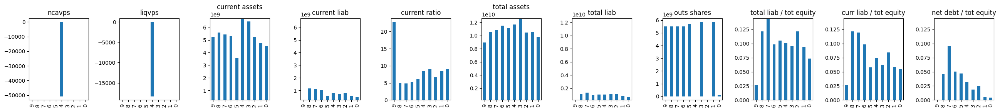

 41%|████████▌            | 212/520 [03:34<06:46,  1.32s/it]

NID
current price 13
NID.	 Current price: 13.	 NCAV: nan.	 LIQV: nan


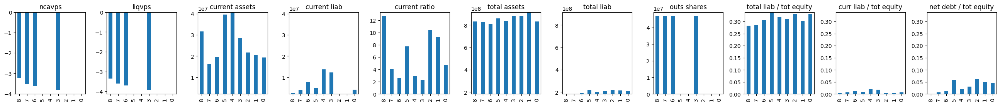

 41%|████████▌            | 213/520 [03:36<07:20,  1.44s/it]

AEEX
UAHC
current price 0.015
UAHC.	 Current price: 0.015.	 NCAV: 0.08129095087176771.	 LIQV: 0.08129095087176771


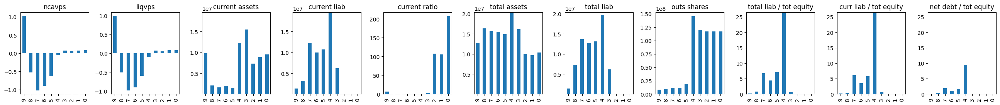

 41%|████████▋            | 215/520 [03:38<06:17,  1.24s/it]

WECT
current price 0.009
WECT.	 Current price: 0.009.	 NCAV: 0.33916863891837157.	 LIQV: 0.33916863891837157


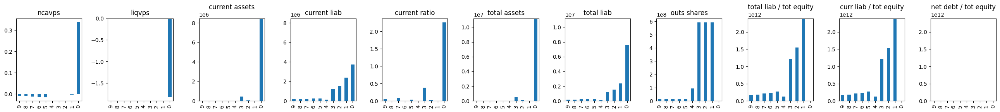

 42%|████████▋            | 216/520 [03:40<06:56,  1.37s/it]

ADYEY
current price 15.4
ADYEY.	 Current price: 15.4.	 NCAV: 106.82785185056285.	 LIQV: 106.82785185056285


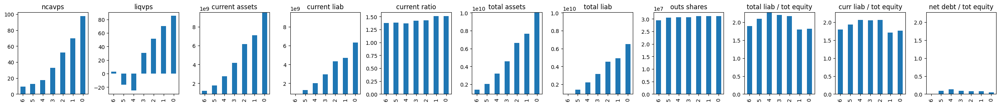

 42%|████████▊            | 217/520 [03:42<07:29,  1.48s/it]

CLINR
RBOT-WT
SSU
BTEGF
current price 4.0475
BTEGF.	 Current price: 4.0475.	 NCAV: nan.	 LIQV: nan


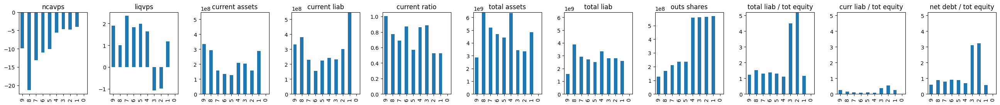

 42%|████████▉            | 221/520 [03:43<04:30,  1.10it/s]

RMIAF
current price 0.3856
RMIAF.	 Current price: 0.3856.	 NCAV: 1.2997208772172861.	 LIQV: 1.2997208772172861


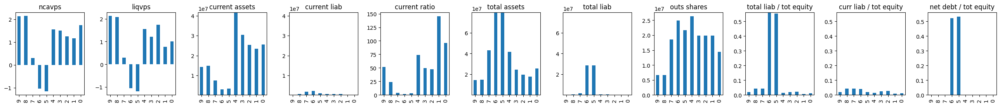

 43%|████████▉            | 222/520 [03:45<05:16,  1.06s/it]

CLINW
RTSO
current price 0.0002
RTSO.	 Current price: 0.0002.	 NCAV: 0.4908893716616043.	 LIQV: 0.4908893716616043


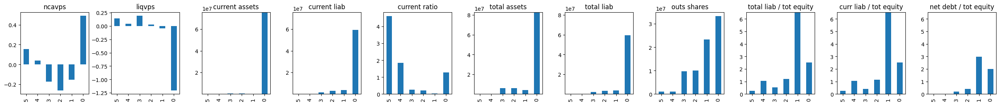

 43%|█████████            | 224/520 [03:47<05:01,  1.02s/it]

HKBT
current price 0.06
HKBT.	 Current price: 0.06.	 NCAV: 0.6387099574219931.	 LIQV: 0.6387099574219931


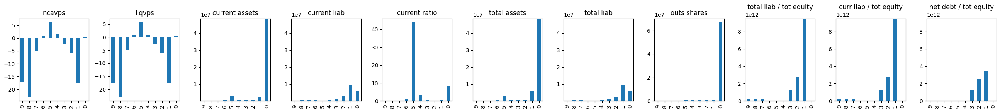

 43%|█████████            | 225/520 [03:49<05:45,  1.17s/it]

VRTY
current price 0.063
VRTY.	 Current price: 0.063.	 NCAV: 0.6103117603550877.	 LIQV: 0.6103117603550877


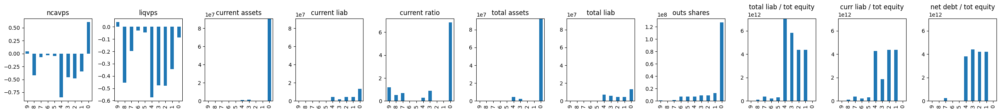

 43%|█████████▏           | 226/520 [03:51<06:34,  1.34s/it]

ADILW
current price 0.0009
ADILW.	 Current price: 0.0009.	 NCAV: 0.7534546567338313.	 LIQV: 0.7534546567338313


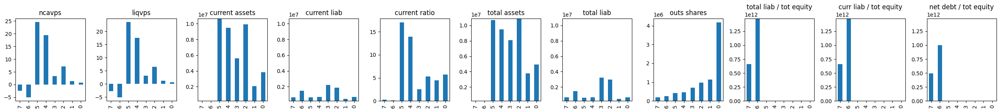

 44%|█████████▏           | 227/520 [03:53<07:10,  1.47s/it]

TSPH
BDRX
current price 5.7
BDRX.	 Current price: 5.7.	 NCAV: 8.835248999064742.	 LIQV: 8.835248999064742


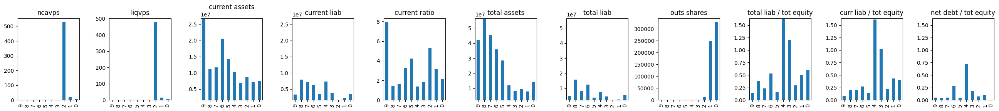

 44%|█████████▏           | 229/520 [03:55<06:17,  1.30s/it]

CNRFF
current price 0.11
CNRFF.	 Current price: 0.11.	 NCAV: 0.3390959128676251.	 LIQV: 0.3390959128676251


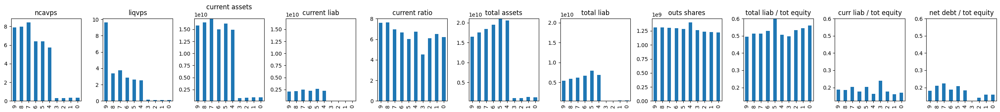

 44%|█████████▎           | 230/520 [03:57<06:59,  1.45s/it]

HUSN
current price 1.68
HUSN.	 Current price: 1.68.	 NCAV: nan.	 LIQV: nan


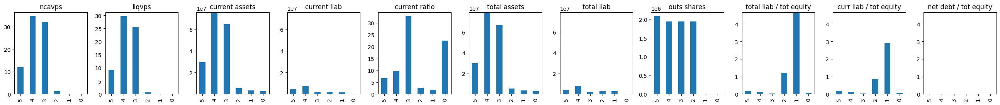

 44%|█████████▎           | 231/520 [03:59<07:24,  1.54s/it]

CNXA
current price 1.5
CNXA.	 Current price: 1.5.	 NCAV: 2.2412242763501937.	 LIQV: 2.2412242763501937


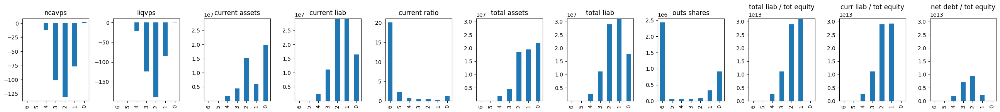

 45%|█████████▎           | 232/520 [04:01<07:46,  1.62s/it]

CNWGQ
current price 0.02125
CNWGQ.	 Current price: 0.02125.	 NCAV: nan.	 LIQV: nan


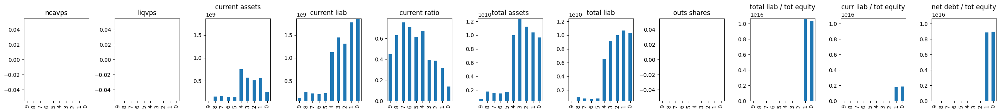

 45%|█████████▍           | 233/520 [04:02<08:00,  1.68s/it]

GIGM
current price 1.36
GIGM.	 Current price: 1.36.	 NCAV: 3.1531849439015565.	 LIQV: 3.1531849439015565


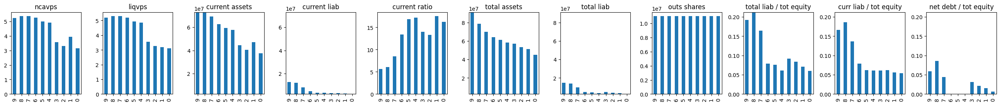

 45%|█████████▍           | 234/520 [04:05<09:01,  1.89s/it]

UMTAF
FTRP
EM
BLMIF
current price 9.01
BLMIF.	 Current price: 9.01.	 NCAV: 17.29336401694409.	 LIQV: 17.29336401694409


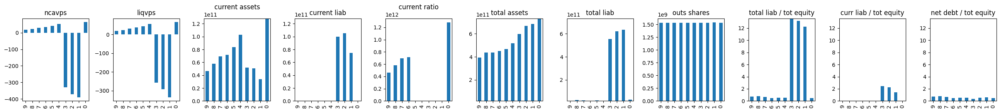

 46%|█████████▌           | 238/520 [04:07<04:50,  1.03s/it]

EMBKW
TAIPY
current price 14
TAIPY.	 Current price: 14.	 NCAV: 22.625857492998687.	 LIQV: 22.625857492998687


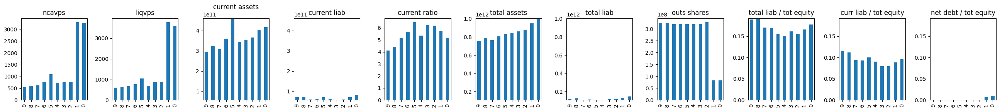

 46%|█████████▋           | 240/520 [04:09<04:39,  1.00it/s]

BRQS
MURA
KLTHF
current price 0.47
KLTHF.	 Current price: 0.47.	 NCAV: nan.	 LIQV: nan


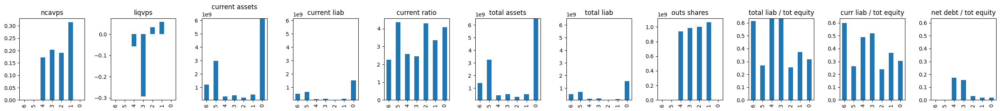

 47%|█████████▊           | 243/520 [04:11<03:56,  1.17it/s]

CCRC
current price 6.5
CCRC.	 Current price: 6.5.	 NCAV: nan.	 LIQV: nan


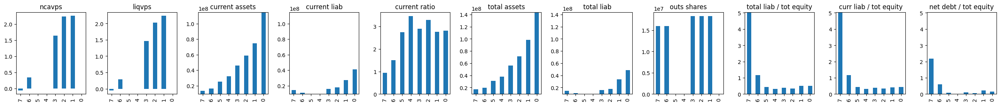

 47%|█████████▊           | 244/520 [04:13<04:46,  1.04s/it]

FWP
CNTTQ
CYTR
current price 0.09
CYTR.	 Current price: 0.09.	 NCAV: 1.756172590144862.	 LIQV: 1.756172590144862


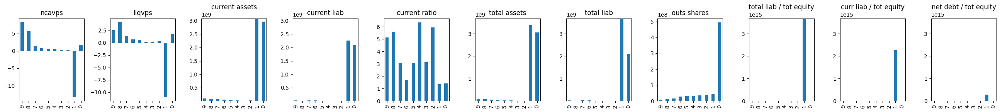

 48%|█████████▉           | 247/520 [04:15<04:17,  1.06it/s]

BKLIF
current price 0.005
BKLIF.	 Current price: 0.005.	 NCAV: 0.03371712617923514.	 LIQV: 0.03371712617923514


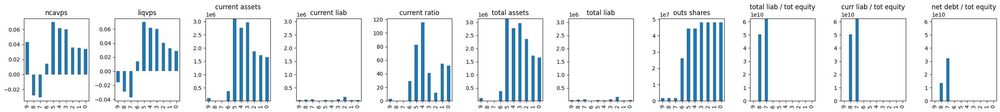

 48%|██████████           | 248/520 [04:17<04:59,  1.10s/it]

ATYM
PMVCW
AYRO
current price 0.7736
AYRO.	 Current price: 0.7736.	 NCAV: 1.4405725668777503.	 LIQV: 1.4405725668777503


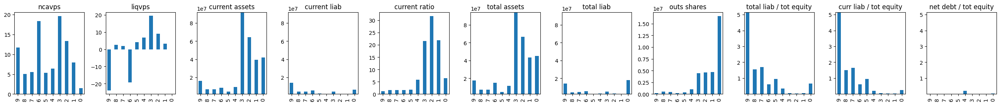

 48%|██████████▏          | 251/520 [04:19<04:03,  1.11it/s]

ARTLW
current price 0.0056
ARTLW.	 Current price: 0.0056.	 NCAV: 4.241098677517803.	 LIQV: 4.241098677517803


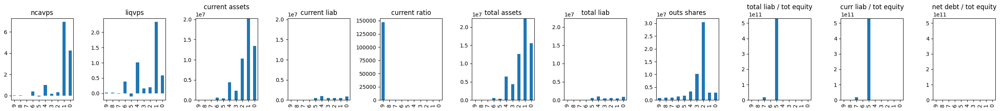

 48%|██████████▏          | 252/520 [04:21<04:45,  1.07s/it]

ANTH
current price 0.0001
ANTH.	 Current price: 0.0001.	 NCAV: 0.24311056288553878.	 LIQV: 0.24311056288553878


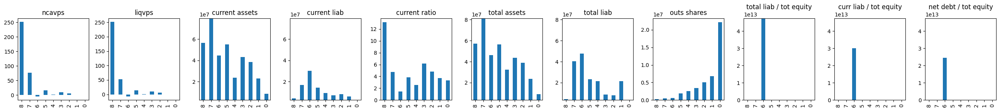

 49%|██████████▏          | 253/520 [04:22<05:24,  1.22s/it]

DKGH
DUO
current price 1.16
DUO.	 Current price: 1.16.	 NCAV: nan.	 LIQV: nan


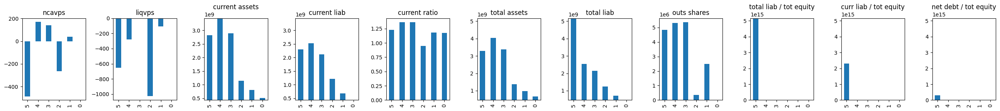

 49%|██████████▎          | 255/520 [04:24<04:52,  1.10s/it]

MAHI
current price 0.0002
MAHI.	 Current price: 0.0002.	 NCAV: 2.120867857892592.	 LIQV: 2.120867857892592


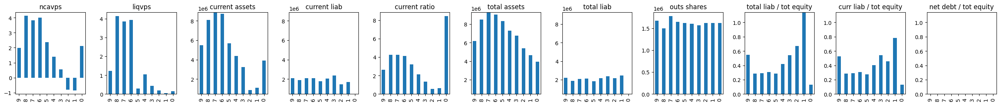

 49%|██████████▎          | 256/520 [04:26<05:33,  1.26s/it]

DAVEW
CMGHF
current price 0.0004
CMGHF.	 Current price: 0.0004.	 NCAV: 0.0039030153248362526.	 LIQV: 0.0039030153248362526


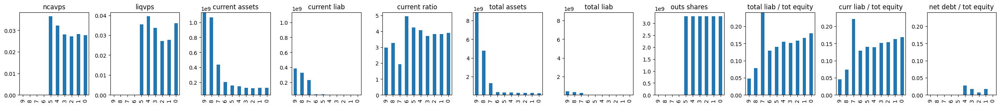

 50%|██████████▍          | 258/520 [04:28<04:58,  1.14s/it]

SBFM
current price 3.01
SBFM.	 Current price: 3.01.	 NCAV: 400.9453203555484.	 LIQV: 400.9453203555484


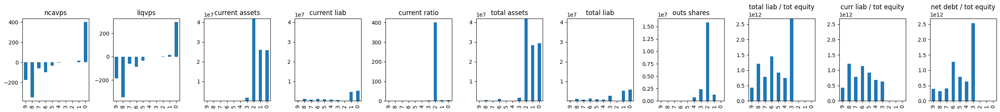

 50%|██████████▍          | 259/520 [04:30<05:40,  1.30s/it]

EVEX-WT
NITO
KYCHR
CPOP
CODMF
SNNHF
current price 0.001
SNNHF.	 Current price: 0.001.	 NCAV: 0.03412642340853344.	 LIQV: 0.03412642340853344


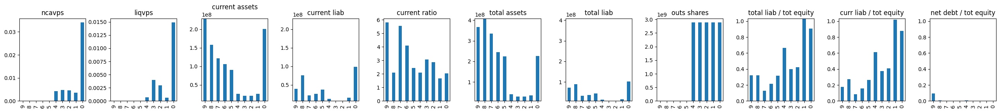

 51%|██████████▋          | 265/520 [04:32<02:53,  1.47it/s]

ADTHW
YMHAY
RAFFF
SMNNY
current price 16.08
SMNNY.	 Current price: 16.08.	 NCAV: 49.53055061364737.	 LIQV: 49.53055061364737


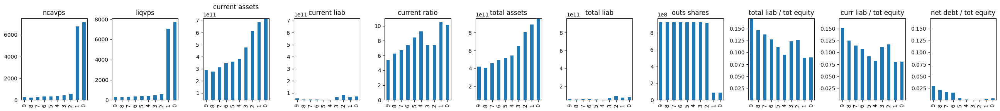

 52%|██████████▊          | 269/520 [04:34<02:31,  1.65it/s]

XOSWW
VCIG
CYTO
current price 0.59
CYTO.	 Current price: 0.59.	 NCAV: nan.	 LIQV: nan


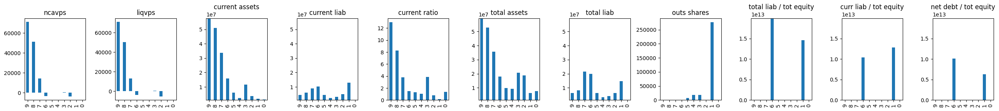

 52%|██████████▉          | 272/520 [04:36<02:31,  1.63it/s]

SMM
DION
current price 0.0002
DION.	 Current price: 0.0002.	 NCAV: 0.008456455634523316.	 LIQV: 0.008456455634523316


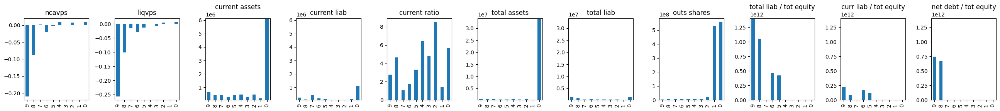

 53%|███████████          | 274/520 [04:38<02:48,  1.46it/s]

KDLYW
MGAM
RECWF
current price 0.0035
RECWF.	 Current price: 0.0035.	 NCAV: 0.02771177433980687.	 LIQV: 0.02771177433980687


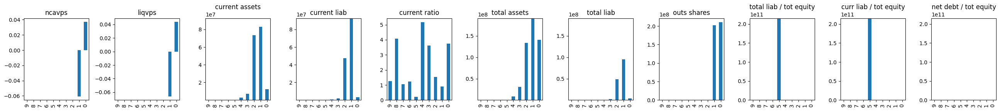

 53%|███████████▏         | 277/520 [04:39<02:41,  1.50it/s]

SVSE
IBKKF
current price 1e-05
IBKKF.	 Current price: 1e-05.	 NCAV: 0.015035719490287765.	 LIQV: 0.015035719490287765


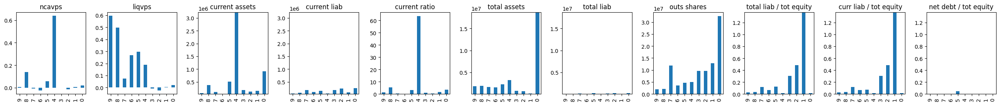

 54%|███████████▎         | 279/520 [04:41<02:56,  1.36it/s]

BKHYY
current price 47.5
BKHYY.	 Current price: 47.5.	 NCAV: 88.40008413211923.	 LIQV: 88.40008413211923


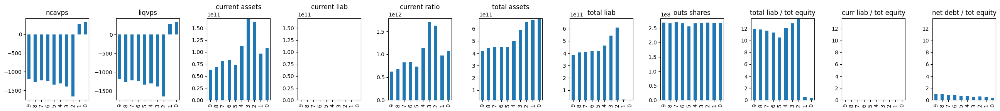

 54%|███████████▎         | 280/520 [04:43<03:35,  1.12it/s]

GMNI
current price 0.0047
GMNI.	 Current price: 0.0047.	 NCAV: nan.	 LIQV: nan


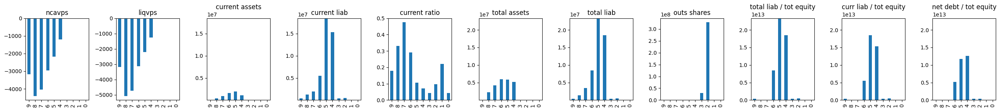

 54%|███████████▎         | 281/520 [04:45<04:13,  1.06s/it]

ROCGW
KGHI
current price 0.001
KGHI.	 Current price: 0.001.	 NCAV: 3.7333333333333334.	 LIQV: 3.7333333333333334


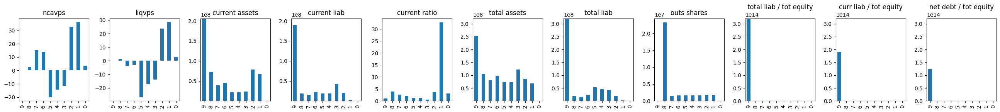

 54%|███████████▍         | 283/520 [04:47<04:03,  1.03s/it]

CNICF
current price 1.23
CNICF.	 Current price: 1.23.	 NCAV: 103.09191888998934.	 LIQV: 103.09191888998934


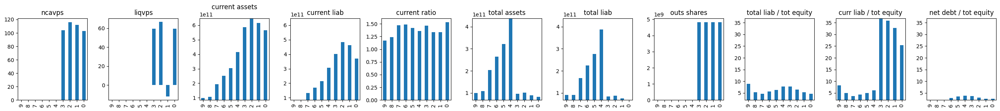

 55%|███████████▍         | 284/520 [04:49<04:40,  1.19s/it]

SOGP
EWRC
NPONF
current price 1817
NPONF.	 Current price: 1817.	 NCAV: 11742.490727089342.	 LIQV: 11742.490727089342


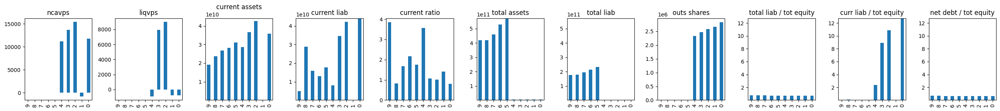

 55%|███████████▌         | 287/520 [04:51<03:42,  1.05it/s]

CHFLF
current price 0.8
CHFLF.	 Current price: 0.8.	 NCAV: nan.	 LIQV: nan


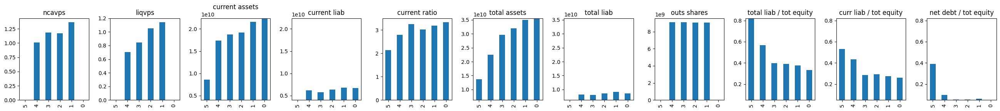

 55%|███████████▋         | 288/520 [04:53<04:16,  1.10s/it]

KRON
STEW
SNSE
CLIN
STET-WT
SAHRF
current price 0.005
SAHRF.	 Current price: 0.005.	 NCAV: 0.01849305083843543.	 LIQV: 0.01849305083843543


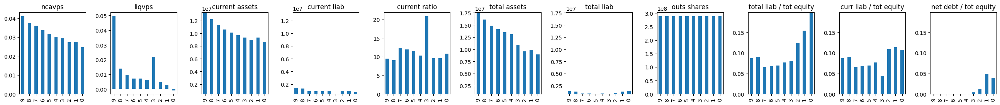

 57%|███████████▊         | 294/520 [04:55<02:24,  1.57it/s]

TRRPF
CYD
current price 12.07
CYD.	 Current price: 12.07.	 NCAV: nan.	 LIQV: nan


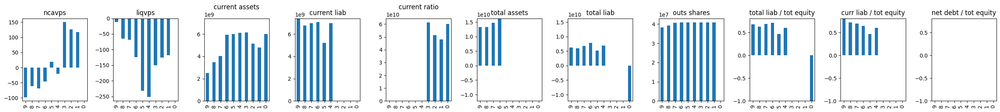

 57%|███████████▉         | 296/520 [04:57<02:39,  1.40it/s]

KTTA
MCLDW
current price 0.0202
MCLDW.	 Current price: 0.0202.	 NCAV: nan.	 LIQV: nan


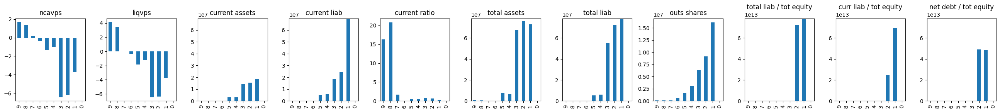

 57%|████████████         | 298/520 [04:59<02:51,  1.29it/s]

LLKKF
current price 0.05745
LLKKF.	 Current price: 0.05745.	 NCAV: nan.	 LIQV: nan


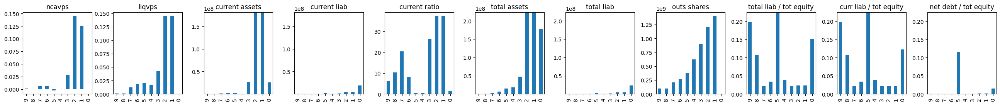

 57%|████████████         | 299/520 [05:00<03:25,  1.08it/s]

FBOHY
current price 18.4
FBOHY.	 Current price: 18.4.	 NCAV: 171.8539940281699.	 LIQV: 171.8539940281699


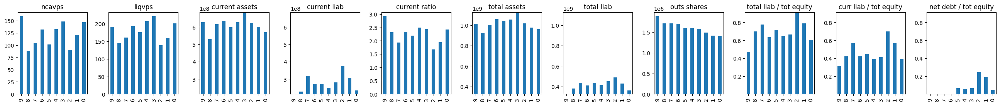

 58%|████████████         | 300/520 [05:02<04:00,  1.10s/it]

GEHI
current price 13.2331
GEHI.	 Current price: 13.2331.	 NCAV: nan.	 LIQV: nan


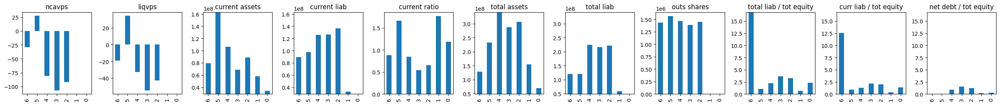

 58%|████████████▏        | 301/520 [05:04<04:30,  1.24s/it]

LGNYZ
MMND
current price 0.05
MMND.	 Current price: 0.05.	 NCAV: 0.07695296288825672.	 LIQV: 0.07695296288825672


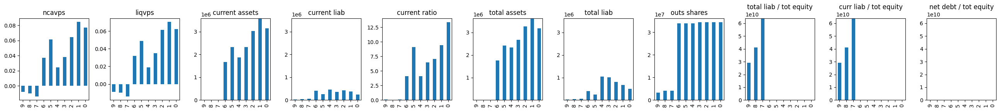

 58%|████████████▏        | 303/520 [05:06<04:06,  1.14s/it]

IHTI
current price 0.0008
IHTI.	 Current price: 0.0008.	 NCAV: 0.18243255908691924.	 LIQV: 0.18243255908691924


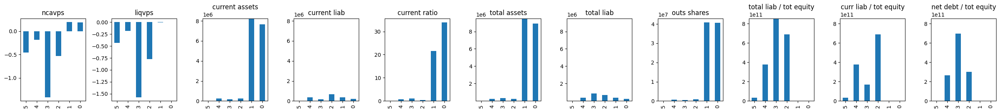

 59%|████████████▍        | 307/520 [05:08<02:28,  1.43it/s]

WTCRF
MNYWW
HYZNW
MSN
current price 0.503
MSN.	 Current price: 0.503.	 NCAV: 1.1728084463878412.	 LIQV: 1.1728084463878412


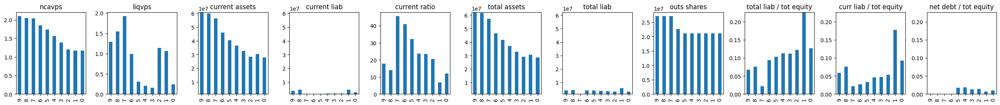

 59%|████████████▍        | 308/520 [05:10<03:11,  1.11it/s]

HENGF
current price 0.0147
HENGF.	 Current price: 0.0147.	 NCAV: 0.0578677147788364.	 LIQV: 0.0578677147788364


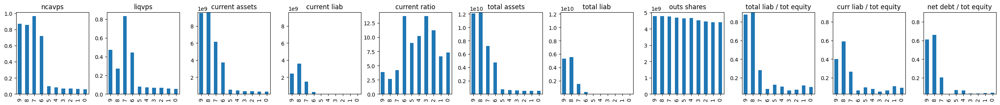

 59%|████████████▍        | 309/520 [05:12<03:52,  1.10s/it]

BGUUF
current price 0.03
BGUUF.	 Current price: 0.03.	 NCAV: 0.05851512422265601.	 LIQV: 0.05851512422265601


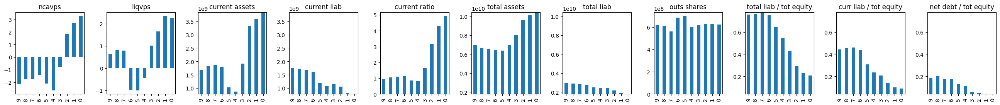

 60%|████████████▌        | 310/520 [05:14<04:29,  1.28s/it]

SDRDW
current price 0.0003
SDRDW.	 Current price: 0.0003.	 NCAV: 3.5631088863770923.	 LIQV: 3.5631088863770923


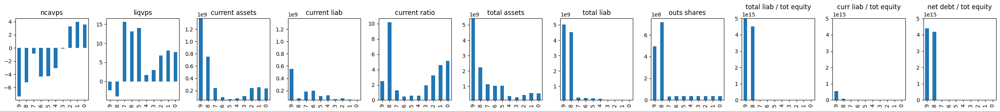

 60%|████████████▌        | 311/520 [05:15<04:59,  1.43s/it]

WQTEF
BDDDY
current price 24.5677
BDDDY.	 Current price: 24.5677.	 NCAV: nan.	 LIQV: nan


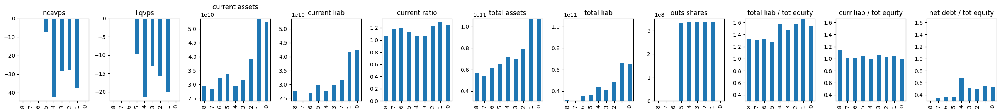

 60%|████████████▋        | 313/520 [05:17<04:15,  1.23s/it]

HOLO
ZH
MTLK
current price 0.42
MTLK.	 Current price: 0.42.	 NCAV: nan.	 LIQV: nan


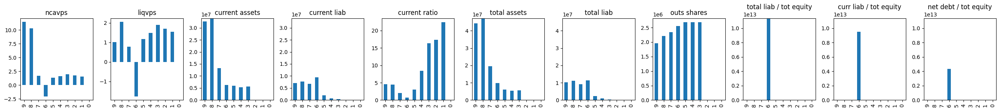

 61%|████████████▊        | 316/520 [05:19<03:12,  1.06it/s]

STIXW
CACO
SIETY
current price 106.46
SIETY.	 Current price: 106.46.	 NCAV: nan.	 LIQV: nan


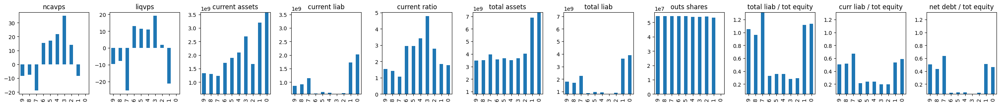

 61%|████████████▉        | 319/520 [05:21<02:44,  1.22it/s]

KALY
current price 0.0001
KALY.	 Current price: 0.0001.	 NCAV: 25.733054526260148.	 LIQV: 25.733054526260148


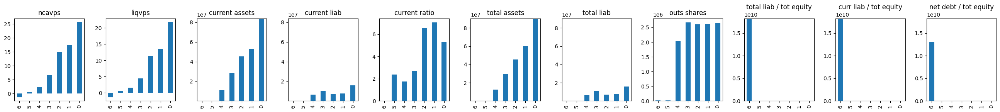

 62%|████████████▉        | 320/520 [05:23<03:18,  1.01it/s]

NONEY
current price 0.8739
NONEY.	 Current price: 0.8739.	 NCAV: 5.265336195531596.	 LIQV: 5.265336195531596


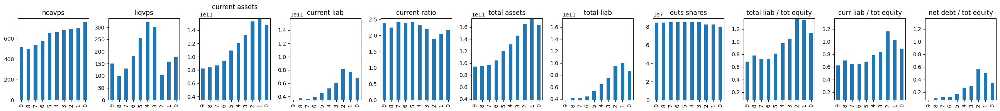

 62%|████████████▉        | 321/520 [05:25<03:51,  1.16s/it]

SPCNF
FCEL
current price 0.3325
FCEL.	 Current price: 0.3325.	 NCAV: 0.5088042146037215.	 LIQV: 0.5088042146037215


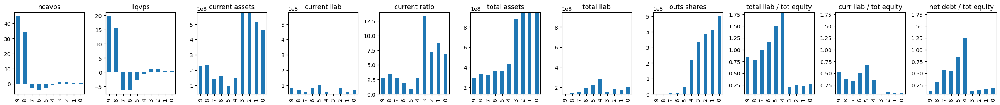

 62%|█████████████        | 323/520 [05:27<03:34,  1.09s/it]

HCDIZ
WIRX
current price 0.0007
WIRX.	 Current price: 0.0007.	 NCAV: 1.8150372228848763.	 LIQV: 1.8150372228848763


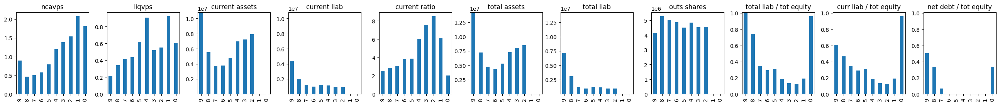

 62%|█████████████▏       | 325/520 [05:29<03:21,  1.03s/it]

JKRO
DKSC
SNGSF
current price 0.0905
SNGSF.	 Current price: 0.0905.	 NCAV: 0.13953747553405246.	 LIQV: 0.13953747553405246


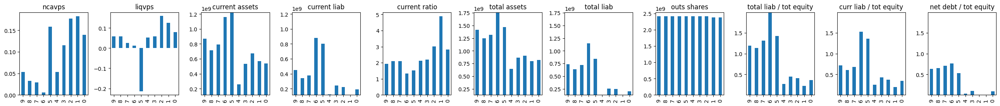

 63%|█████████████▏       | 328/520 [05:31<02:46,  1.15it/s]

MTTCF
current price 0.0016
MTTCF.	 Current price: 0.0016.	 NCAV: 0.004910542721721679.	 LIQV: 0.004910542721721679


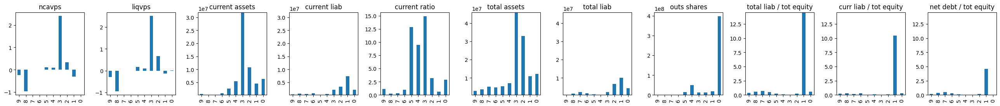

 63%|█████████████▎       | 329/520 [05:33<03:19,  1.04s/it]

VENAW
KGJI
current price 1e-06
KGJI.	 Current price: 1e-06.	 NCAV: 61.60767764344964.	 LIQV: 61.60767764344964


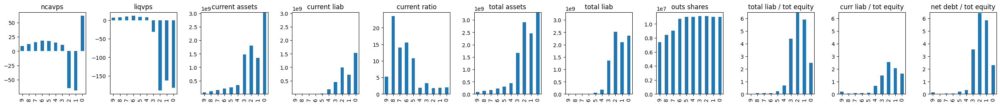

 64%|█████████████▎       | 331/520 [05:34<03:10,  1.01s/it]

SZENF
HGGGQ
current price 0.0012
HGGGQ.	 Current price: 0.0012.	 NCAV: nan.	 LIQV: nan


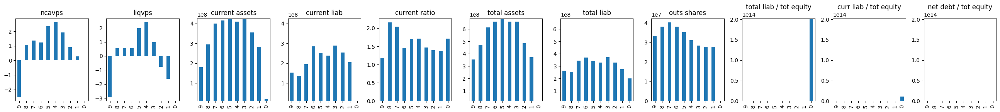

 64%|█████████████▍       | 333/520 [05:36<03:04,  1.01it/s]

PIAC
current price 0.135
PIAC.	 Current price: 0.135.	 NCAV: 20.197813554548855.	 LIQV: 20.197813554548855


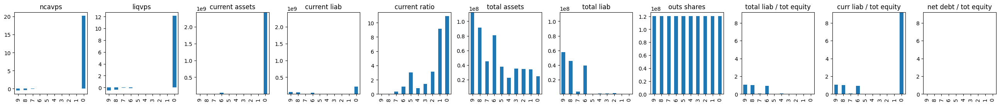

 64%|█████████████▍       | 334/520 [05:38<03:31,  1.14s/it]

AEZS
current price 5.72
AEZS.	 Current price: 5.72.	 NCAV: 40.726757212710716.	 LIQV: 40.726757212710716


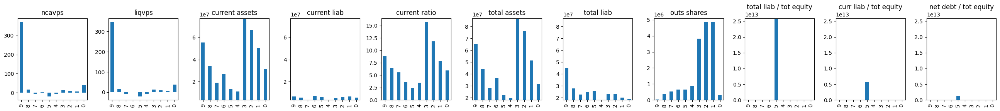

 64%|█████████████▌       | 335/520 [05:40<04:00,  1.30s/it]

OP
ZNWLF
current price 0.08
ZNWLF.	 Current price: 0.08.	 NCAV: 27.188875806339034.	 LIQV: 27.188875806339034


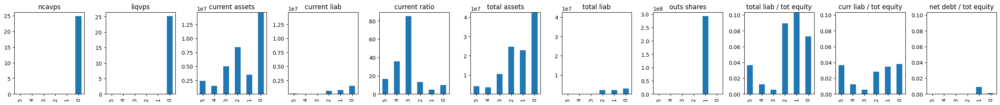

 65%|█████████████▌       | 337/520 [05:42<03:31,  1.16s/it]

HYW
current price 0.3689
HYW.	 Current price: 0.3689.	 NCAV: 1.6507100698927897.	 LIQV: 1.6507100698927897


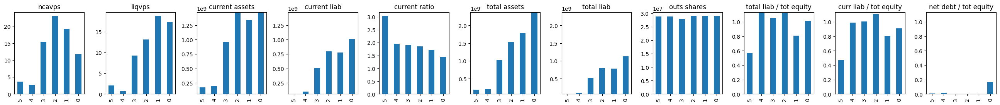

 65%|█████████████▋       | 338/520 [05:44<03:54,  1.29s/it]

FBPA
current price 22.5
FBPA.	 Current price: 22.5.	 NCAV: 91.33185222509792.	 LIQV: 91.33185222509792


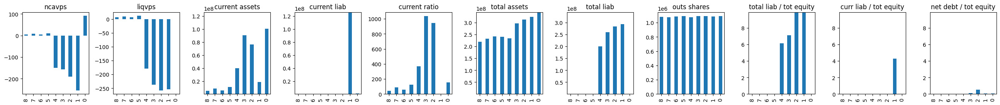

 65%|█████████████▋       | 339/520 [05:46<04:18,  1.43s/it]

WSFL
current price 0.07
WSFL.	 Current price: 0.07.	 NCAV: 0.10652670524639188.	 LIQV: 0.10652670524639188


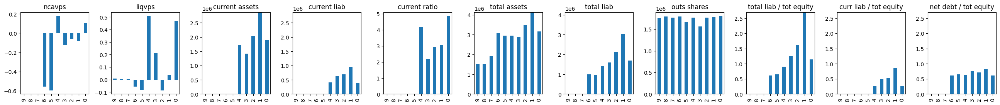

 65%|█████████████▋       | 340/520 [05:47<04:34,  1.53s/it]

PPHPR
GPCOW
WSTL
current price 1.66
WSTL.	 Current price: 1.66.	 NCAV: 2.672930072930073.	 LIQV: 2.672930072930073


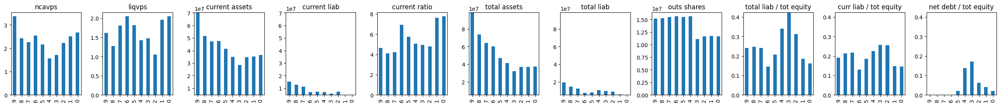

 66%|█████████████▊       | 343/520 [05:49<03:09,  1.07s/it]

YLDGF
GGPXF
current price 0.305
GGPXF.	 Current price: 0.305.	 NCAV: 1.670773019491257.	 LIQV: 1.670773019491257


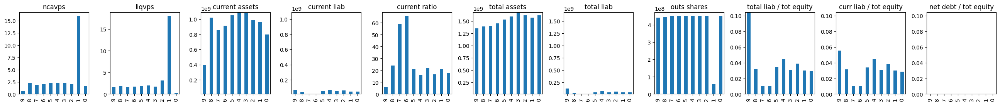

 66%|█████████████▉       | 345/520 [05:51<02:59,  1.02s/it]

PTRA
WNAVF
CLVR
DYNA
ENSCW
current price 0.009
ENSCW.	 Current price: 0.009.	 NCAV: 0.12968821804730601.	 LIQV: 0.12968821804730601


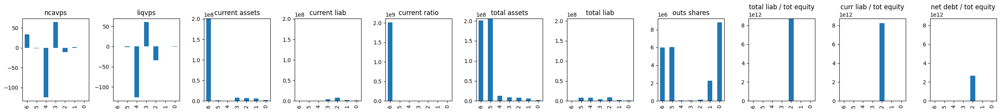

 67%|██████████████▏      | 350/520 [05:53<01:57,  1.45it/s]

OTMOW
PEARW
MMMM
current price 0.0003
MMMM.	 Current price: 0.0003.	 NCAV: 0.002648958286142865.	 LIQV: 0.002648958286142865


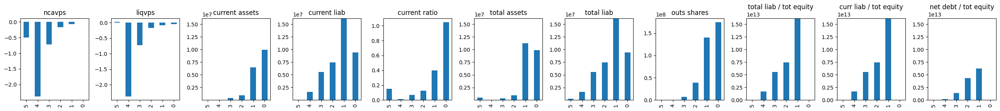

 68%|██████████████▎      | 353/520 [05:55<01:50,  1.51it/s]

MSBN
current price 0.00339
MSBN.	 Current price: 0.00339.	 NCAV: 0.8793903206494048.	 LIQV: 0.8793903206494048


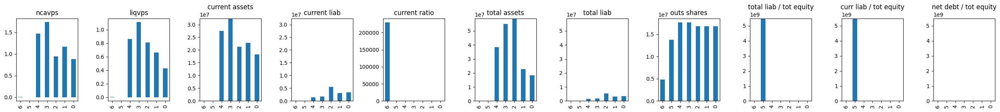

 68%|██████████████▎      | 354/520 [05:57<02:16,  1.22it/s]

BRMKW
MLGO
TALS
CIMEF
current price 0.879
CIMEF.	 Current price: 0.879.	 NCAV: nan.	 LIQV: nan


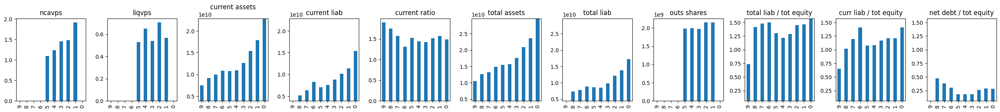

 69%|██████████████▍      | 358/520 [05:59<01:51,  1.46it/s]

MTEKW
AVGR
current price 0.95
AVGR.	 Current price: 0.95.	 NCAV: 3.2790697674418605.	 LIQV: 3.2790697674418605


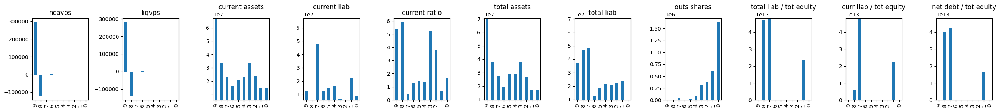

 69%|██████████████▌      | 360/520 [06:01<02:00,  1.33it/s]

NHEL
OCFT
current price 2.6
OCFT.	 Current price: 2.6.	 NCAV: 7.466538810554758.	 LIQV: 7.466538810554758


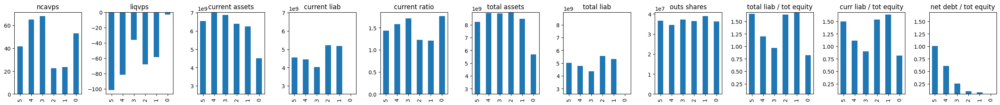

 70%|██████████████▌      | 362/520 [06:03<02:04,  1.27it/s]

GPMT
current price 3.16
GPMT.	 Current price: 3.16.	 NCAV: 12.175527679161835.	 LIQV: 12.175527679161835


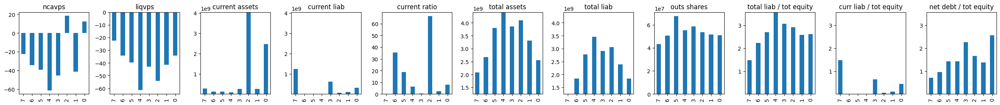

 70%|██████████████▋      | 363/520 [06:04<02:29,  1.05it/s]

GWAV
current price 0.43
GWAV.	 Current price: 0.43.	 NCAV: 1.625609314101672.	 LIQV: 1.625609314101672


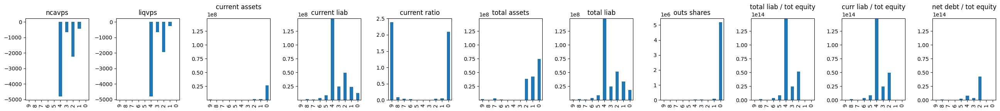

 70%|██████████████▋      | 364/520 [06:06<02:53,  1.11s/it]

JPSTF
VSSYW
current price 0.088
VSSYW.	 Current price: 0.088.	 NCAV: 0.7170296267181162.	 LIQV: 0.7170296267181162


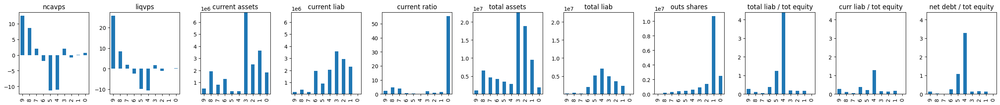

 70%|██████████████▊      | 366/520 [06:08<02:42,  1.06s/it]

HCGS
current price 0.0001
HCGS.	 Current price: 0.0001.	 NCAV: 0.006231767318533748.	 LIQV: 0.006231767318533748


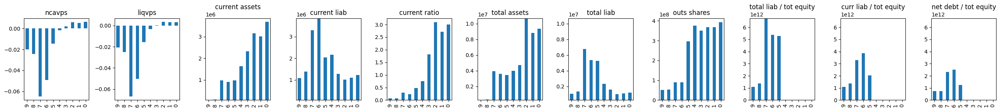

 71%|██████████████▊      | 367/520 [06:10<03:08,  1.24s/it]

CNGI
BTCTW
GRI
VANTF
current price 0.0033
VANTF.	 Current price: 0.0033.	 NCAV: 0.05425393570732959.	 LIQV: 0.05425393570732959


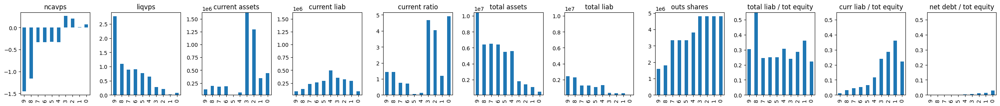

 71%|██████████████▉      | 371/520 [06:12<02:03,  1.20it/s]

CREAF
current price 0.9
CREAF.	 Current price: 0.9.	 NCAV: nan.	 LIQV: nan


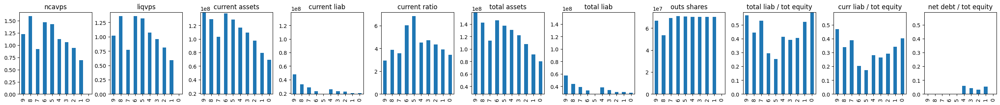

 72%|███████████████      | 372/520 [06:14<02:37,  1.06s/it]

EGRX
current price 0.85
EGRX.	 Current price: 0.85.	 NCAV: 2.620224303302594.	 LIQV: 2.620224303302594


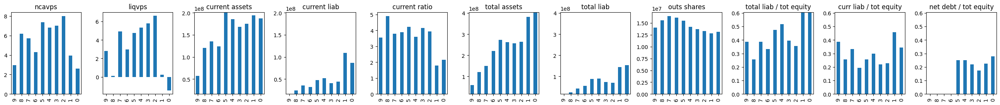

 72%|███████████████      | 373/520 [06:16<02:57,  1.21s/it]

HOLOW
SMTS
current price 0.1995
SMTS.	 Current price: 0.1995.	 NCAV: nan.	 LIQV: nan


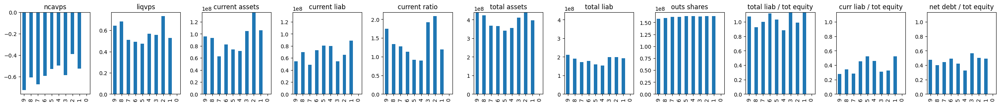

 72%|███████████████▏     | 375/520 [06:18<02:42,  1.12s/it]

CBTN
MGTA
current price 0.6996
MGTA.	 Current price: 0.6996.	 NCAV: 45.39974721607497.	 LIQV: 45.39974721607497


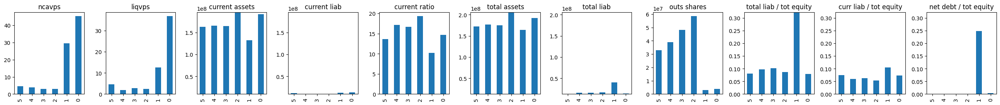

 72%|███████████████▏     | 377/520 [06:20<02:31,  1.06s/it]

TNSGF
current price 0.3
TNSGF.	 Current price: 0.3.	 NCAV: 1.1869587202979455.	 LIQV: 1.1869587202979455


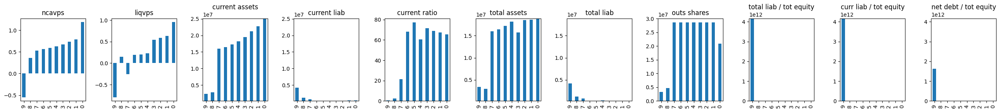

 73%|███████████████▎     | 378/520 [06:22<02:50,  1.20s/it]

GRABW
NXGPF
current price 112.7
NXGPF.	 Current price: 112.7.	 NCAV: nan.	 LIQV: nan


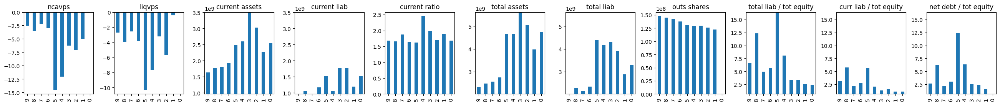

 73%|███████████████▎     | 380/520 [06:24<02:36,  1.12s/it]

METXW
SMCAY
current price 21.47
SMCAY.	 Current price: 21.47.	 NCAV: 126.2748225776053.	 LIQV: 126.2748225776053


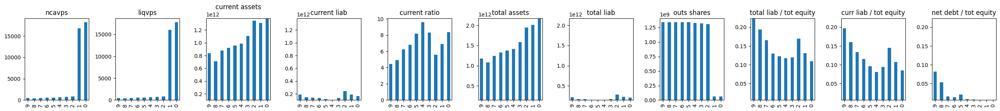

 73%|███████████████▍     | 382/520 [06:26<02:26,  1.06s/it]

MCPH
current price 30
MCPH.	 Current price: 30.	 NCAV: 82.03086925817999.	 LIQV: 82.03086925817999


/var/folders/6m/m__65zqd7z3f2kp_95xncl5c0000gn/T/ipykernel_58637/2930165580.py:14: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax[i].set_ylim([min_ylim, max_ylim])
/var/folders/6m/m__65zqd7z3f2kp_95xncl5c0000gn/T/ipykernel_58637/2930165580.py:14: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax[i].set_ylim([min_ylim, max_ylim])
/var/folders/6m/m__65zqd7z3f2kp_95xncl5c0000gn/T/ipykernel_58637/2930165580.py:14: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax[i].set_ylim([min_ylim, max_ylim])


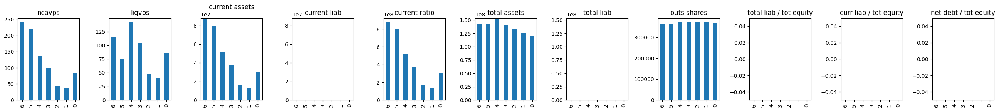

 74%|███████████████▍     | 383/520 [06:27<02:45,  1.21s/it]

SEHLF
current price 0.0014
SEHLF.	 Current price: 0.0014.	 NCAV: 0.011133727456450224.	 LIQV: 0.011133727456450224


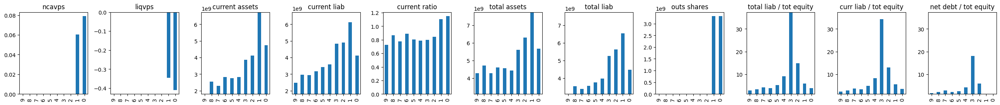

 74%|███████████████▌     | 384/520 [06:29<03:04,  1.36s/it]

LBCMF
current price 0.2277
LBCMF.	 Current price: 0.2277.	 NCAV: 41.101864819921.	 LIQV: 41.101864819921


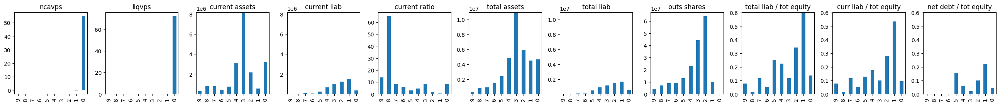

 74%|███████████████▌     | 385/520 [06:31<03:19,  1.48s/it]

CPARW
KOBNF
HCDI
INTH
CHNUF
current price 0.0001
CHNUF.	 Current price: 0.0001.	 NCAV: 0.003693023599311753.	 LIQV: 0.003693023599311753


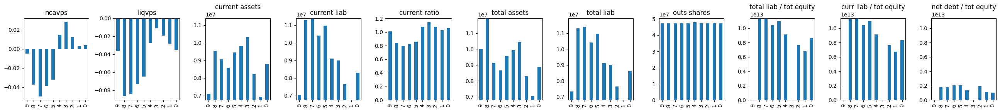

 75%|███████████████▊     | 390/520 [06:33<01:42,  1.27it/s]

SGLY
current price 1.64
SGLY.	 Current price: 1.64.	 NCAV: 4.558258060112398.	 LIQV: 4.558258060112398


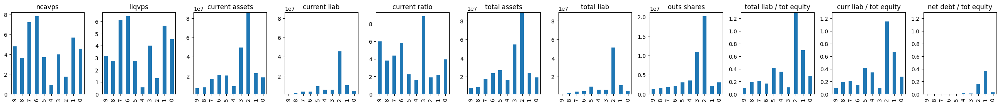

 75%|███████████████▊     | 391/520 [06:35<02:02,  1.05it/s]

CNTB
QMEI
HYPPF
DAAT
current price 0.01
DAAT.	 Current price: 0.01.	 NCAV: 0.7608404454223513.	 LIQV: 0.7608404454223513


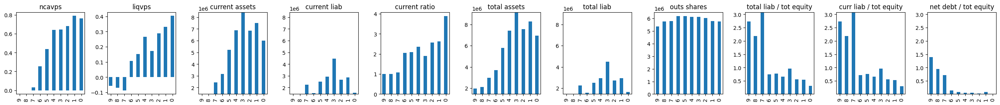

 76%|███████████████▉     | 395/520 [06:37<01:31,  1.37it/s]

WZZZY
current price 3.975
WZZZY.	 Current price: 3.975.	 NCAV: 17.177760257423465.	 LIQV: 17.177760257423465


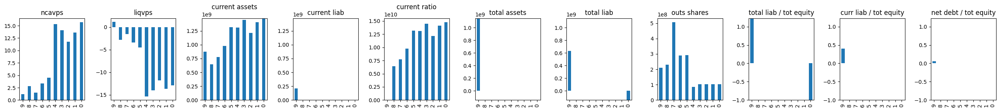

 76%|███████████████▉     | 396/520 [06:39<01:50,  1.12it/s]

SEGYY
current price 0.507
SEGYY.	 Current price: 0.507.	 NCAV: 0.8460046724708113.	 LIQV: 0.8460046724708113


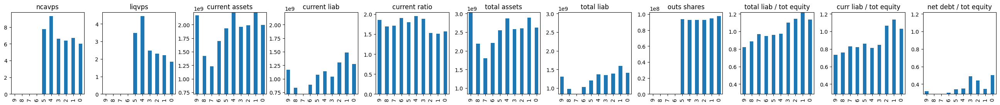

 76%|████████████████     | 397/520 [06:41<02:11,  1.07s/it]

EPRJF
current price 0.0254
EPRJF.	 Current price: 0.0254.	 NCAV: 0.060917898177345615.	 LIQV: 0.060917898177345615


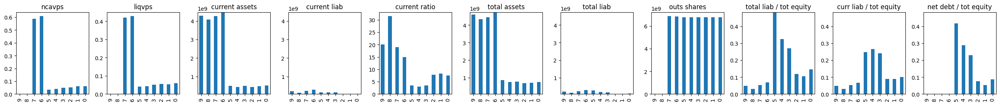

 77%|████████████████     | 398/520 [06:42<02:29,  1.22s/it]

BLKCF
current price 0.0001
BLKCF.	 Current price: 0.0001.	 NCAV: 0.0800311437167773.	 LIQV: 0.0800311437167773


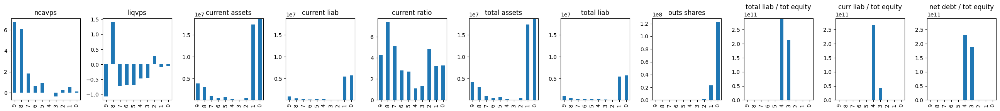

 77%|████████████████     | 399/520 [06:44<02:45,  1.37s/it]

RVSNW
SDRWW
current price 0.0021
SDRWW.	 Current price: 0.0021.	 NCAV: 3.2531665994352563.	 LIQV: 3.2531665994352563


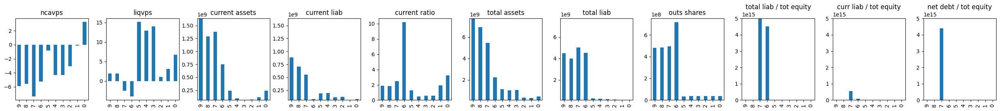

 77%|████████████████▏    | 401/520 [06:46<02:22,  1.20s/it]

CEXPF
current price 0.0001
CEXPF.	 Current price: 0.0001.	 NCAV: 0.024172372627540108.	 LIQV: 0.024172372627540108


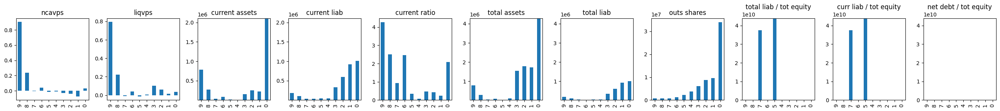

 77%|████████████████▏    | 402/520 [06:48<02:38,  1.34s/it]

AERN
current price 1e-05
AERN.	 Current price: 1e-05.	 NCAV: 0.9423149236192715.	 LIQV: 0.9423149236192715


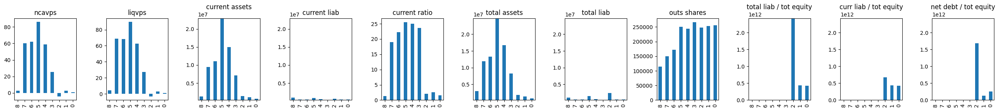

 78%|████████████████▎    | 403/520 [06:50<02:52,  1.47s/it]

TTM
AMRN
current price 0.5801
AMRN.	 Current price: 0.5801.	 NCAV: 1.1032292565539201.	 LIQV: 1.1032292565539201


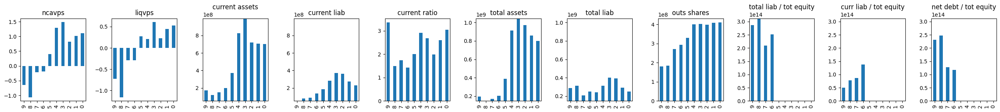

 78%|████████████████▎    | 405/520 [06:52<02:24,  1.25s/it]

TRMNF
current price 0.008
TRMNF.	 Current price: 0.008.	 NCAV: 0.04789305738373626.	 LIQV: 0.04789305738373626


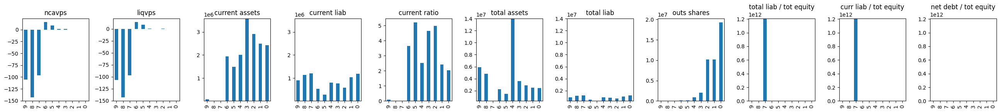

 78%|████████████████▍    | 406/520 [06:54<02:39,  1.40s/it]

RNSHF
current price 47.46
RNSHF.	 Current price: 47.46.	 NCAV: nan.	 LIQV: nan


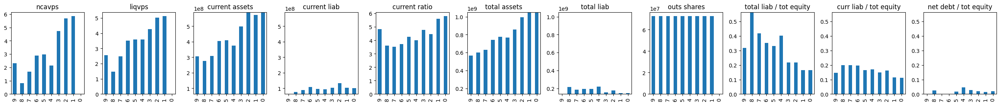

 78%|████████████████▍    | 407/520 [06:57<03:15,  1.73s/it]

DOMR
current price 0.0001
DOMR.	 Current price: 0.0001.	 NCAV: 0.4112792356687898.	 LIQV: 0.4112792356687898


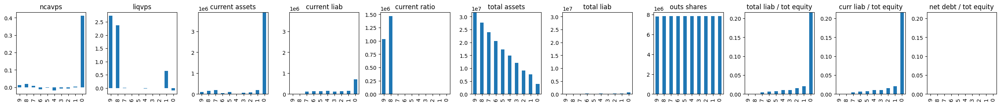

 78%|████████████████▍    | 408/520 [06:58<03:17,  1.76s/it]

TMPPF
BAGFF
current price 6.6
BAGFF.	 Current price: 6.6.	 NCAV: nan.	 LIQV: nan


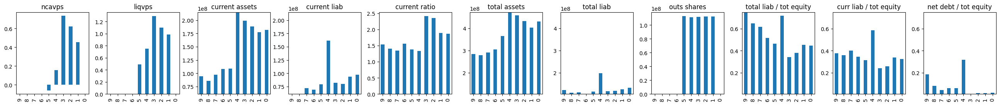

 79%|████████████████▌    | 410/520 [07:00<02:35,  1.41s/it]

GMVD
PWBO
NCRE
current price 0.0001
NCRE.	 Current price: 0.0001.	 NCAV: 0.00477057306392133.	 LIQV: 0.00477057306392133


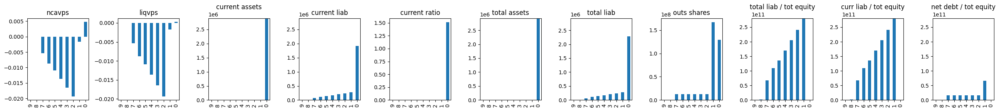

 79%|████████████████▋    | 413/520 [07:02<01:51,  1.04s/it]

LBBBU
PTNR
current price 6.61
PTNR.	 Current price: 6.61.	 NCAV: nan.	 LIQV: nan


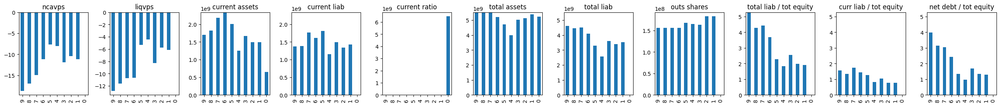

 80%|████████████████▊    | 415/520 [07:04<01:47,  1.02s/it]

ASTC
current price 8.3
ASTC.	 Current price: 8.3.	 NCAV: 19.471916971916972.	 LIQV: 19.471916971916972


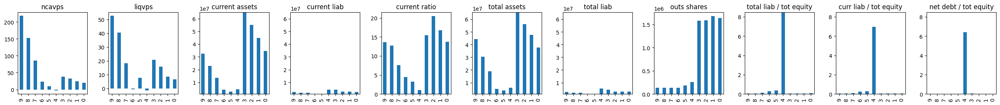

 80%|████████████████▊    | 416/520 [07:06<02:03,  1.19s/it]

TSP
FTFT
current price 0.3399
FTFT.	 Current price: 0.3399.	 NCAV: 1.6323736665897772.	 LIQV: 1.6323736665897772


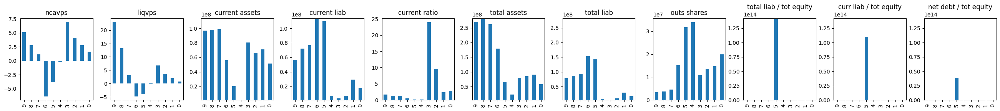

 80%|████████████████▉    | 418/520 [07:08<01:52,  1.10s/it]

BANX
current price 20.48
BANX.	 Current price: 20.48.	 NCAV: nan.	 LIQV: nan


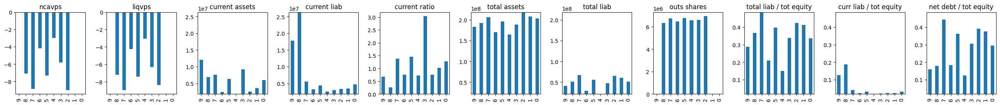

 81%|████████████████▉    | 419/520 [07:10<02:06,  1.25s/it]

NPPNY
current price 6.33
NPPNY.	 Current price: 6.33.	 NCAV: 12.485215848121909.	 LIQV: 12.485215848121909


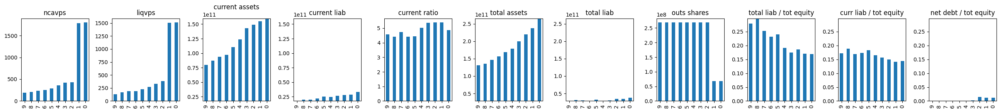

 81%|████████████████▉    | 420/520 [07:12<02:18,  1.39s/it]

BOLD
CLVRW
BRMK-WT
RVSN
LMFA
current price 3.07
LMFA.	 Current price: 3.07.	 NCAV: 916732.120483687.	 LIQV: 916732.120483687


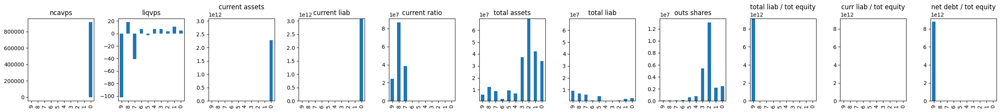

 82%|█████████████████▏   | 425/520 [07:14<01:13,  1.29it/s]

MACAW
PMVP
TOVX
current price 1.49
TOVX.	 Current price: 1.49.	 NCAV: 6.408107913001331.	 LIQV: 6.408107913001331


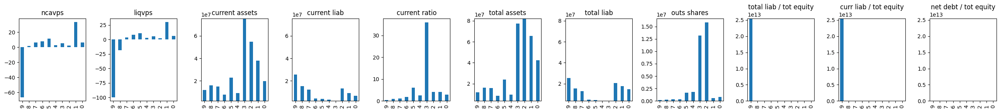

 82%|█████████████████▎   | 428/520 [07:16<01:07,  1.37it/s]

VERBW
current price 0.0215
VERBW.	 Current price: 0.0215.	 NCAV: 0.1253935938390451.	 LIQV: 0.1253935938390451


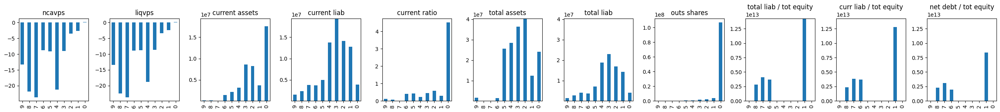

 82%|█████████████████▎   | 429/520 [07:17<01:21,  1.12it/s]

RPID
SRZNW
SZSAY
current price 11.17
SZSAY.	 Current price: 11.17.	 NCAV: nan.	 LIQV: nan


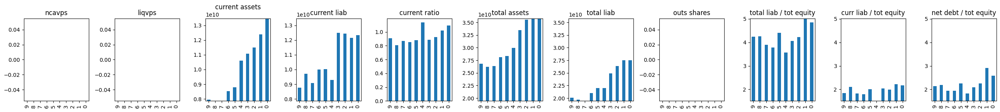

 83%|█████████████████▍   | 432/520 [07:19<01:10,  1.25it/s]

LVVR
FSAM
PEAR
BMIX
current price 0.0115
BMIX.	 Current price: 0.0115.	 NCAV: 0.021640215627358225.	 LIQV: 0.021640215627358225


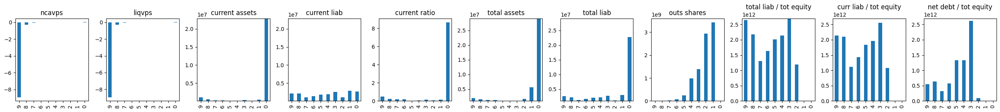

 84%|█████████████████▌   | 436/520 [07:21<00:55,  1.51it/s]

LGNDZ
current price 0.0034
LGNDZ.	 Current price: 0.0034.	 NCAV: 12.261593077435101.	 LIQV: 12.261593077435101


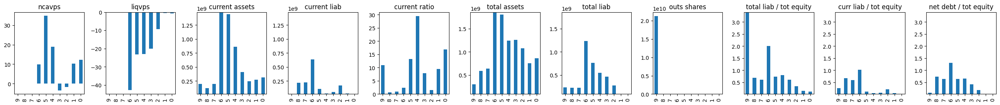

 84%|█████████████████▋   | 437/520 [07:23<01:07,  1.22it/s]

SPRC
current price 0.2292
SPRC.	 Current price: 0.2292.	 NCAV: 9.095716948790177.	 LIQV: 9.095716948790177


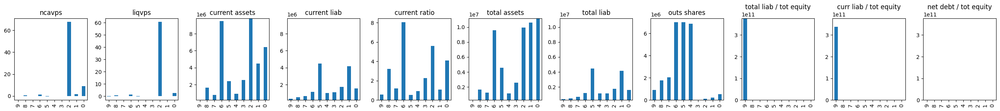

 84%|█████████████████▋   | 438/520 [07:25<01:20,  1.02it/s]

VWFB
CSLMW
INM
current price 0.2396
INM.	 Current price: 0.2396.	 NCAV: 793.2627724602553.	 LIQV: 793.2627724602553


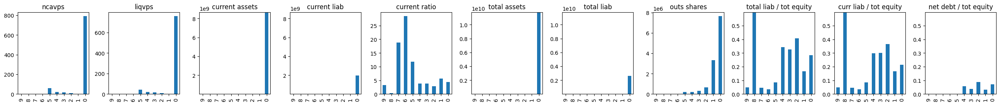

 85%|█████████████████▊   | 441/520 [07:27<01:06,  1.19it/s]

SNGXW
current price 0.009
SNGXW.	 Current price: 0.009.	 NCAV: 2.5867726779906035.	 LIQV: 2.5867726779906035


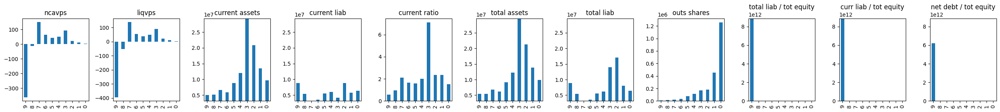

 85%|█████████████████▊   | 442/520 [07:29<01:18,  1.01s/it]

TLIS
SXTC
current price 0.6301
SXTC.	 Current price: 0.6301.	 NCAV: 4.083705144493533.	 LIQV: 4.083705144493533


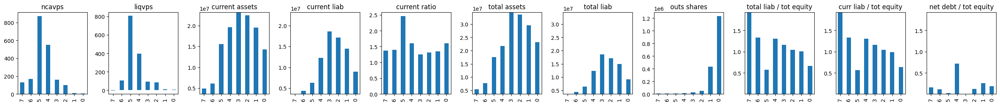

 85%|█████████████████▉   | 444/520 [07:31<01:15,  1.01it/s]

ARQQW
current price 0.119
ARQQW.	 Current price: 0.119.	 NCAV: 0.40849383653528193.	 LIQV: 0.40849383653528193


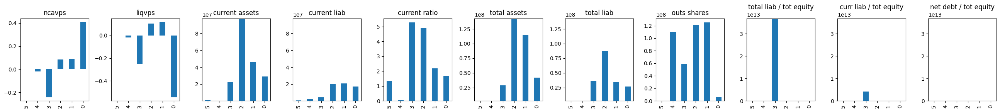

 86%|█████████████████▉   | 445/520 [07:32<01:25,  1.14s/it]

OCG
current price 1.5705
OCG.	 Current price: 1.5705.	 NCAV: 8.108512656296657.	 LIQV: 8.108512656296657


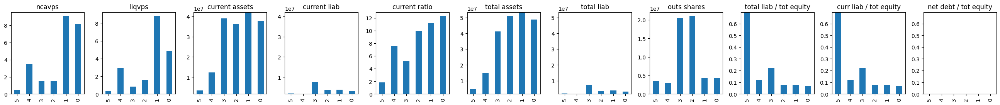

 86%|██████████████████   | 446/520 [07:34<01:34,  1.28s/it]

NSL
current price 4.6
NSL.	 Current price: 4.6.	 NCAV: nan.	 LIQV: nan


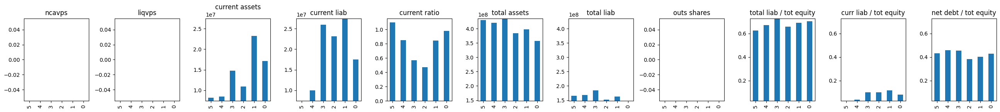

 86%|██████████████████   | 447/520 [07:36<01:41,  1.39s/it]

EVK
current price 0.2944
EVK.	 Current price: 0.2944.	 NCAV: 2.3004574526391988.	 LIQV: 2.3004574526391988


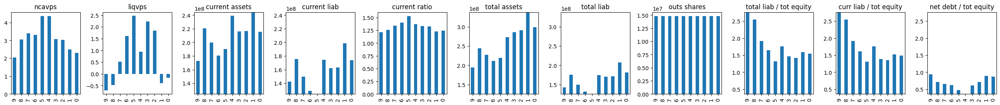

 86%|██████████████████   | 448/520 [07:38<01:49,  1.52s/it]

EZGO
GMFIW
FENG
current price 3.05
FENG.	 Current price: 3.05.	 NCAV: 10.322105757334795.	 LIQV: 10.322105757334795


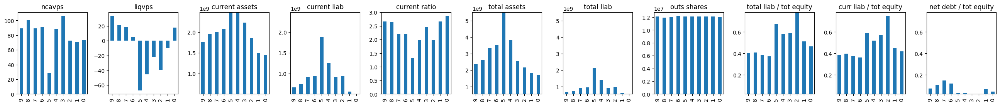

 87%|██████████████████▏  | 451/520 [07:40<01:12,  1.06s/it]

KWPCY
current price 32.45
KWPCY.	 Current price: 32.45.	 NCAV: nan.	 LIQV: nan


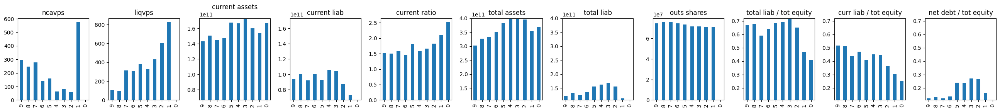

 87%|██████████████████▎  | 452/520 [07:42<01:22,  1.21s/it]

SVA
current price 6.47
SVA.	 Current price: 6.47.	 NCAV: 102.4177501367541.	 LIQV: 102.4177501367541


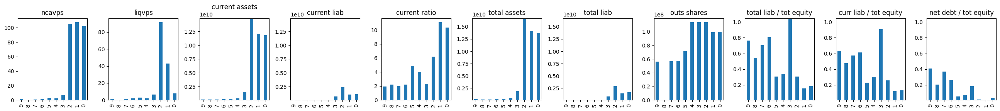

 87%|██████████████████▎  | 453/520 [07:44<01:39,  1.48s/it]

MDLX
MMX
current price 5
MMX.	 Current price: 5.	 NCAV: nan.	 LIQV: nan


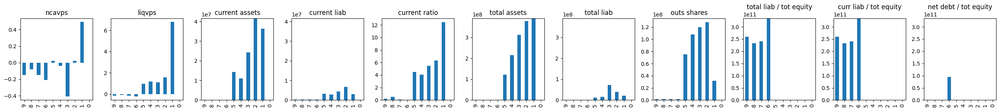

 88%|██████████████████▍  | 455/520 [07:46<01:23,  1.28s/it]

PLAOW
GPCOR
UPC
LIAN
MOTS
current price 0.025
MOTS.	 Current price: 0.025.	 NCAV: 0.20329252621904695.	 LIQV: 0.20329252621904695


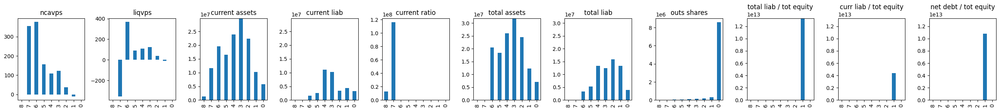

 88%|██████████████████▌  | 460/520 [07:48<00:45,  1.31it/s]

GYRO
current price 11.1
GYRO.	 Current price: 11.1.	 NCAV: nan.	 LIQV: nan


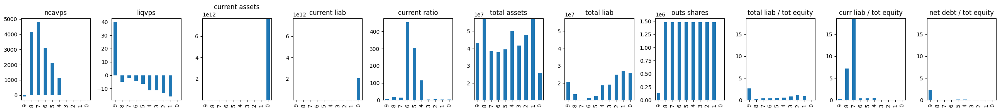

 89%|██████████████████▌  | 461/520 [07:50<00:54,  1.08it/s]

TOGL
current price 0.0002
TOGL.	 Current price: 0.0002.	 NCAV: 0.02868385276308304.	 LIQV: 0.02868385276308304


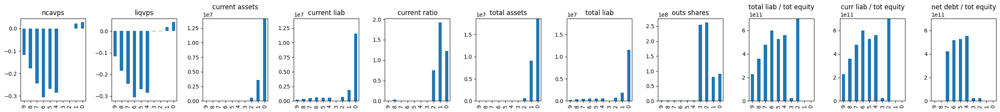

 89%|██████████████████▋  | 462/520 [07:52<01:02,  1.07s/it]

GPCOU
UTSI
current price 2.98
UTSI.	 Current price: 2.98.	 NCAV: 4.62389235313423.	 LIQV: 4.62389235313423


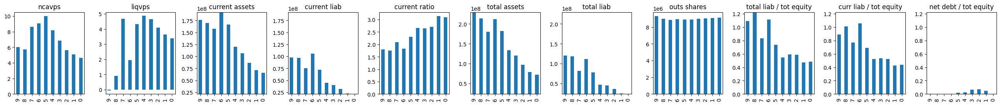

 89%|██████████████████▋  | 464/520 [07:54<00:58,  1.04s/it]

LAAAW
YQ
EMITF
current price 1.14
EMITF.	 Current price: 1.14.	 NCAV: 1.7505322102101546.	 LIQV: 1.7505322102101546


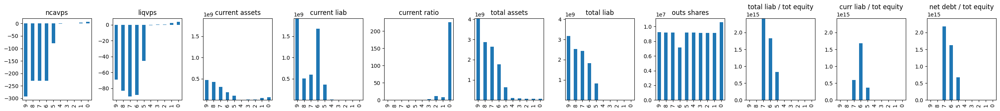

 90%|██████████████████▊  | 467/520 [07:55<00:46,  1.15it/s]

CMTG
CNTG
current price 0.325
CNTG.	 Current price: 0.325.	 NCAV: nan.	 LIQV: nan


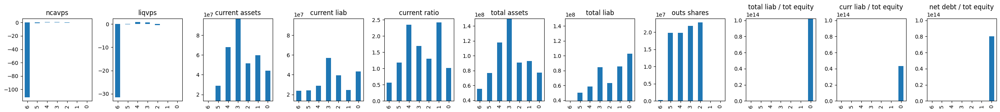

 90%|██████████████████▉  | 469/520 [07:57<00:45,  1.13it/s]

SBFMW
current price 0.1042
SBFMW.	 Current price: 0.1042.	 NCAV: 400.9453203555484.	 LIQV: 400.9453203555484


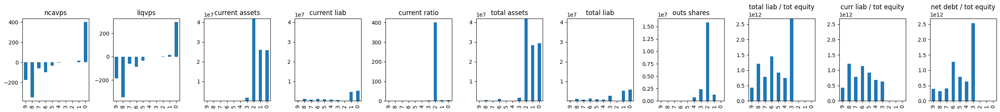

 90%|██████████████████▉  | 470/520 [07:59<00:52,  1.05s/it]

MF
FFHL
current price 8.3
FFHL.	 Current price: 8.3.	 NCAV: nan.	 LIQV: nan


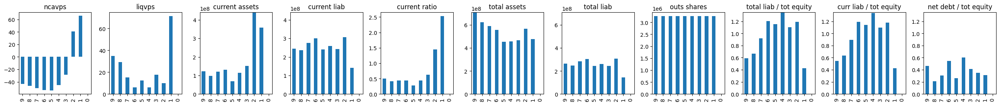

 91%|███████████████████  | 472/520 [08:01<00:48,  1.01s/it]

NDRA
current price 0.2033
NDRA.	 Current price: 0.2033.	 NCAV: 0.4872807709661372.	 LIQV: 0.4872807709661372


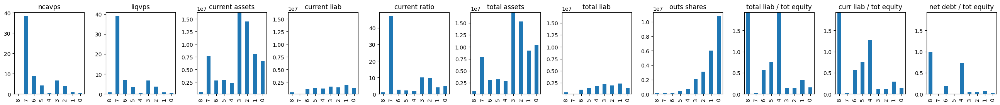

 91%|███████████████████  | 473/520 [08:03<00:55,  1.18s/it]

JSPRW
AEMD
current price 0.3801
AEMD.	 Current price: 0.3801.	 NCAV: 0.9181737510673263.	 LIQV: 0.9181737510673263


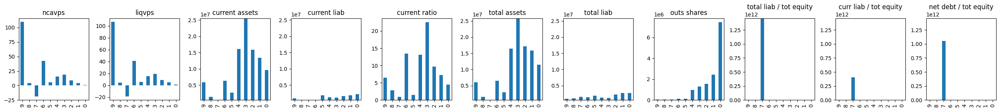

 91%|███████████████████▏ | 475/520 [08:05<00:49,  1.10s/it]

QD
current price 2.22
QD.	 Current price: 2.22.	 NCAV: 6.706625353876412.	 LIQV: 6.706625353876412


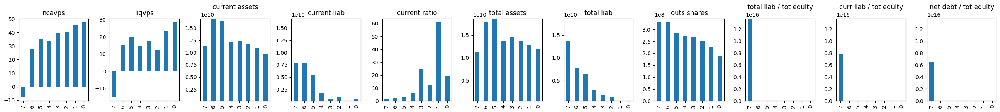

 92%|███████████████████▏ | 476/520 [08:07<00:54,  1.24s/it]

INKI
VGFC
NVIV
current price 0.3207
NVIV.	 Current price: 0.3207.	 NCAV: 2.852261912274353.	 LIQV: 2.852261912274353


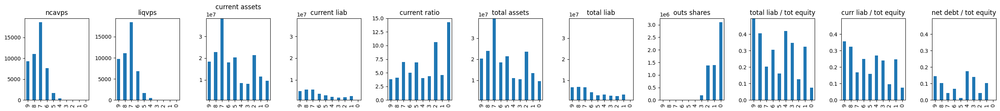

 92%|███████████████████▎ | 479/520 [08:09<00:40,  1.02it/s]

VECT
CLEU
current price 0.2901
CLEU.	 Current price: 0.2901.	 NCAV: 34.83397318192332.	 LIQV: 34.83397318192332


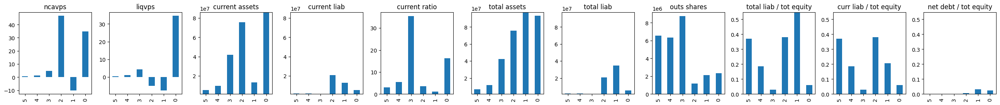

 92%|███████████████████▍ | 481/520 [08:10<00:36,  1.06it/s]

MFL
AUUDW
ARGD
current price 22.43
ARGD.	 Current price: 22.43.	 NCAV: 37.72089953382171.	 LIQV: 37.72089953382171


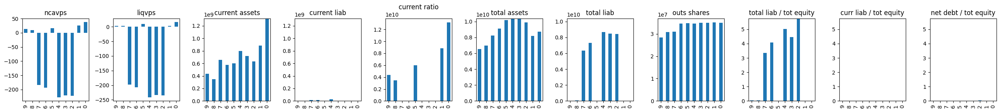

 93%|███████████████████▌ | 484/520 [08:12<00:29,  1.21it/s]

CIH
NEV
current price 12.51
NEV.	 Current price: 12.51.	 NCAV: nan.	 LIQV: nan


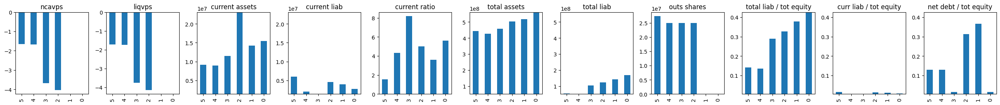

 93%|███████████████████▋ | 486/520 [08:14<00:29,  1.14it/s]

RAVN
current price 58.08
RAVN.	 Current price: 58.08.	 NCAV: nan.	 LIQV: nan


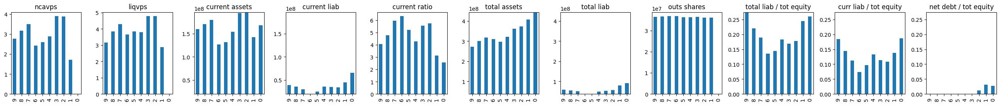

 94%|███████████████████▋ | 487/520 [08:16<00:34,  1.03s/it]

LGHL
current price 0.23
LGHL.	 Current price: 0.23.	 NCAV: 2.015584272114405.	 LIQV: 2.015584272114405


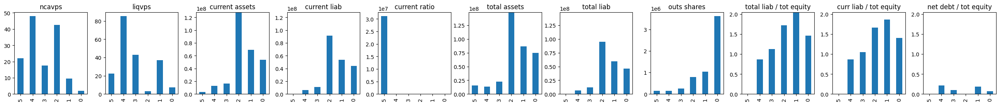

 94%|███████████████████▋ | 488/520 [08:19<00:42,  1.33s/it]

HSCSW
PLTYF
current price 0.02
PLTYF.	 Current price: 0.02.	 NCAV: 0.8521845039532899.	 LIQV: 0.8521845039532899


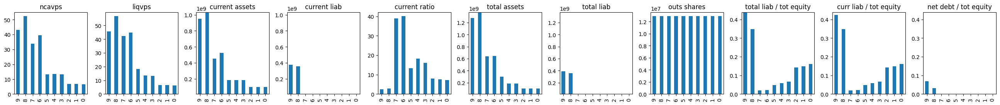

 94%|███████████████████▊ | 490/520 [08:21<00:36,  1.20s/it]

MDGSW
current price 0.0213
MDGSW.	 Current price: 0.0213.	 NCAV: nan.	 LIQV: nan


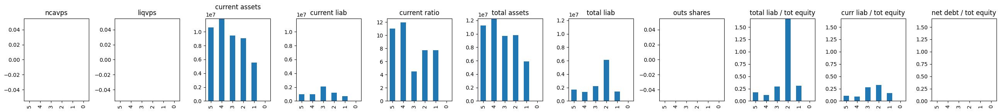

 94%|███████████████████▊ | 491/520 [08:23<00:38,  1.34s/it]

DILAW
CNBA
current price 4.5
CNBA.	 Current price: 4.5.	 NCAV: 10.33363441013287.	 LIQV: 10.33363441013287


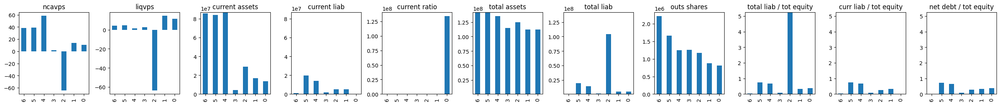

 95%|███████████████████▉ | 493/520 [08:24<00:31,  1.18s/it]

IPVF-WT
LIDRW
CENQW
RQHTF
current price 0.0001
RQHTF.	 Current price: 0.0001.	 NCAV: 0.030291696929886678.	 LIQV: 0.030291696929886678


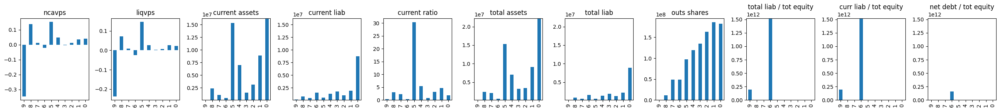

 96%|████████████████████ | 497/520 [08:26<00:19,  1.21it/s]

EMBK
CSLMR
CIXX
current price 11.42
CIXX.	 Current price: 11.42.	 NCAV: nan.	 LIQV: nan


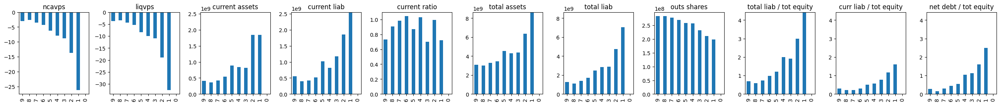

 96%|████████████████████▏| 500/520 [08:28<00:15,  1.32it/s]

GWIIW
TIVC
JMACW
SEER
NVCN
current price 30.03
NVCN.	 Current price: 30.03.	 NCAV: nan.	 LIQV: nan


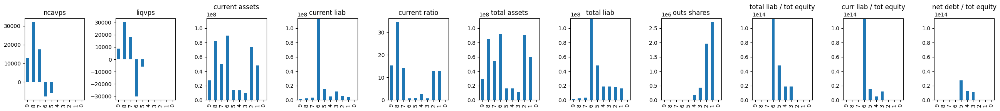

 97%|████████████████████▍| 505/520 [08:30<00:08,  1.72it/s]

HCDIW
LBBBW
ROIVW
OXBRW
current price 0.13
OXBRW.	 Current price: 0.13.	 NCAV: 0.3543764051309021.	 LIQV: 0.3543764051309021


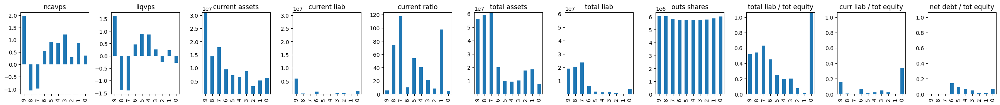

 98%|████████████████████▌| 509/520 [08:32<00:06,  1.83it/s]

AVHHL
LAAA
PMVC-WT
TANH
current price 0.184
TANH.	 Current price: 0.184.	 NCAV: 26.711492066080012.	 LIQV: 26.711492066080012


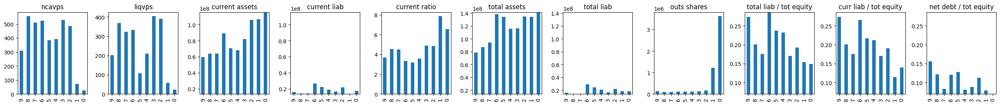

 99%|████████████████████▋| 513/520 [08:34<00:03,  1.80it/s]

BNSO
current price 1.12
BNSO.	 Current price: 1.12.	 NCAV: nan.	 LIQV: nan


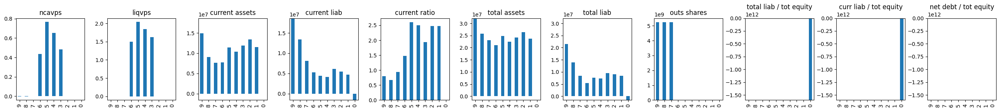

 99%|████████████████████▊| 514/520 [08:36<00:04,  1.44it/s]

LBBB
LX
current price 2.95
LX.	 Current price: 2.95.	 NCAV: 4.867054081727799.	 LIQV: 4.867054081727799


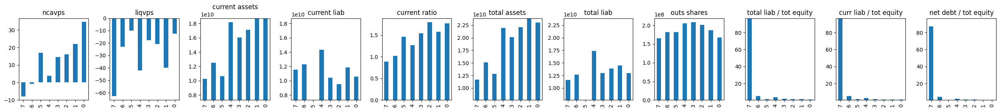

 99%|████████████████████▊| 516/520 [08:38<00:03,  1.33it/s]

CREG
current price 0.761
CREG.	 Current price: 0.761.	 NCAV: 12.929102196955977.	 LIQV: 12.929102196955977


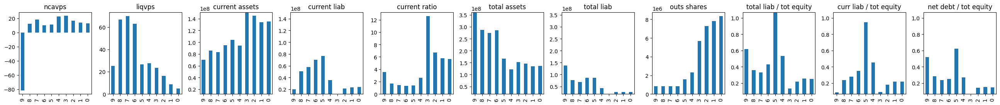

 99%|████████████████████▉| 517/520 [08:40<00:02,  1.10it/s]

RDSMY
current price 33.85
RDSMY.	 Current price: 33.85.	 NCAV: nan.	 LIQV: nan


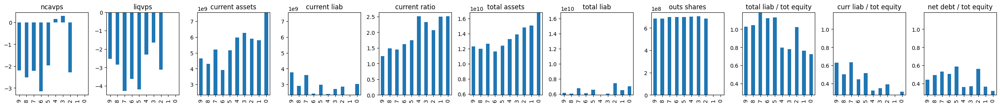

100%|████████████████████▉| 518/520 [08:42<00:02,  1.06s/it]

YVR
current price 0.43
YVR.	 Current price: 0.43.	 NCAV: nan.	 LIQV: nan


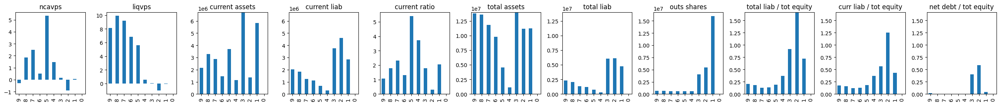

100%|█████████████████████| 520/520 [08:44<00:00,  1.01s/it]

MWG
CPU times: user 6min 39s, sys: 5.59 s, total: 6min 45s
Wall time: 8min 44s


In [13]:
%%time
# NEW CODE
# compute preliminary ncav (current assets - total liabilities)
preliminary_ncav = {}
zero_current_price = []
missed_ticker = []
tickers_to_accept = []
notes = {}
full_df = pd.DataFrame()

for ticker in tqdm(potential_candidates):
    print(ticker)
    query = f"""
    select period_bs, "reportedCurrency_bs"
    from financial_stmts
    where symbol_bs = '{ticker}'
    order by date desc
    limit 1;
    """
    with engine.connect() as connection:
        df = pd.read_sql(query, connection)
    if len(df) == 0:
        continue
    currency = df.loc[0, "reportedCurrency_bs"]
    period = df.loc[0, "period_bs"]
    query = f"""
    select *
    from financial_stmts
    where symbol_bs = '{ticker}' and period_bs = '{period}'
    order by date desc
    limit 10
    """

    with engine.connect() as connection:
        hist_df = pd.read_sql(query, connection)
    if len(hist_df) <= 5:
        continue
    cols = list(hist_df.columns)
    cols = [col.split("_")[0] for col in cols]
    hist_df.columns = cols
    #print("hist_df")
    #print(hist_df)
    #a
    """data_balance_sheet = get_balance_sheet_info(ticker, 10)
    if len(data_balance_sheet) <= 5:
        continue
    data_income_stmt = get_income_stmt_info(ticker, 10)
    if len(data_income_stmt) <= 5:
        continue"""
    current_price = get_current_price(ticker)
    print(f"current price {current_price}")
    if current_price is None:
        continue
        
    """latest_balance_sheet = data_balance_sheet[-1]
    latest_income_stmt = data_income_stmt[-1]
    latest_balance_sheet.update(
        {
            "weightedAverageShsOutDil": latest_income_stmt["weightedAverageShsOutDil"],
            "income_stmt_date": latest_income_stmt["date"],
        }
    )
    if latest_balance_sheet["date"] != latest_balance_sheet["income_stmt_date"]:
        print(f"dates of last income statement and balance sheet are not the same for ticker {ticker}")
        print(f"\tincome stmt date: {latest_balance_sheet['income_stmt_date']}, balance sheet date: {latest_balance_sheet['date']}")
        continue"""
        
    #ncavps = compute_ncavps(latest_balance_sheet)
    ncavps = compute_ncavps(hist_df.to_dict("records")[0])
    ncavps = currency_to_usd(ncavps, currency, RATES_TO_USD)
    #liqvps = compute_liqvps(latest_balance_sheet, CURRENT_ASSETS_FACTORS)
    liqvps = compute_ncavps(hist_df.to_dict("records")[0])
    liqvps = currency_to_usd(liqvps, currency, RATES_TO_USD)
    
    if (current_price > ncavps) and (current_price > liqvps):
        continue
    
    """balance_sheet_df = pd.DataFrame(data_balance_sheet)
    income_stmt_df = pd.DataFrame(data_income_stmt)
    balance_sheet_df = balance_sheet_df.set_index("date")
    income_stmt_df = income_stmt_df.set_index("date")"""
    balance_sheet_df = hist_df[bs_cols]
    income_stmt_df = hist_df[is_cols]
    
    try:
        fs_df = pd.concat([balance_sheet_df, income_stmt_df], axis=1, join="inner")
    except:
        print("dates incoherence")
        continue
    
    fs_df = fs_df.iloc[::-1] # from oldest to newest
    # compute NCAV
    fs_df["ncavps"] = fs_df.apply(compute_ncavps, axis=1)
    # compute LIQV
    fs_df["liqvps"] = fs_df.apply(compute_liqvps, args=(CURRENT_ASSETS_FACTORS,), axis=1)
    # compute current ratio
    fs_df["current_ratio"] = fs_df.apply(compute_current_ratio, axis=1)
    # compute de ratio 1
    fs_df["de_ratio1"] = fs_df.apply(compute_de_ratio, args=("totalLiabilities",), axis=1)
    # compute de ratio 2
    fs_df["de_ratio2"] = fs_df.apply(compute_de_ratio, args=("totalCurrentLiabilities",), axis=1)
    # compute de ratio 3
    fs_df["de_ratio3"] = fs_df.apply(compute_de_ratio, args=("totalDebt",), axis=1)

    # plot indicators
    print(f"{ticker}.\t Current price: {current_price}.\t NCAV: {ncavps}.\t LIQV: {liqvps}")
    plot_indicators_ncav(fs_df)

    full_df = pd.concat([full_df, fs_df.tail(1)])

    time.sleep(1)

## Previous yet useful code

In [13]:
%%time
# NEW CODE
# compute preliminary ncav (current assets - total liabilities)
preliminary_ncav = {}
zero_current_price = []
missed_ticker = []
tickers_to_accept = []
notes = {}
full_df = pd.DataFrame()

for ticker in tqdm(potential_candidates):
    query = f"""
    select period_bs, "reportedCurrency_bs"
    from financial_stmts
    where symbol_bs = '{ticker}'
    order by date desc
    limit 1;
    """
    with engine.connect() as connection:
        df = pd.read_sql(query, connection)
    if len(df) == 0:
        continue
    currency = df.loc[0, "reportedCurrency_bs"]
    period = df.loc[0, "period_bs"]
    query = f"""
    select *
    from financial_stmts
    where symbol_bs = '{ticker}' and period_bs = '{period}'
    order by date desc
    limit 10
    """

    with engine.connect() as connection:
        hist_df = pd.read_sql(query, connection)
    if len(hist_df) <= 5:
        continue
    print("hist_df")
    print(hist_df)
    a
    """data_balance_sheet = get_balance_sheet_info(ticker, 10)
    if len(data_balance_sheet) <= 5:
        continue
    data_income_stmt = get_income_stmt_info(ticker, 10)
    if len(data_income_stmt) <= 5:
        continue"""
    current_price = get_current_price(ticker)
    if current_price is None:
        continue
        
    latest_balance_sheet = data_balance_sheet[-1]
    latest_income_stmt = data_income_stmt[-1]
    latest_balance_sheet.update(
        {
            "weightedAverageShsOutDil": latest_income_stmt["weightedAverageShsOutDil"],
            "income_stmt_date": latest_income_stmt["date"],
        }
    )
    if latest_balance_sheet["date"] != latest_balance_sheet["income_stmt_date"]:
        print(f"dates of last income statement and balance sheet are not the same for ticker {ticker}")
        print(f"\tincome stmt date: {latest_balance_sheet['income_stmt_date']}, balance sheet date: {latest_balance_sheet['date']}")
        continue
        
    ncavps = compute_ncavps(latest_balance_sheet)
    ncavps = currency_to_usd(ncavps, currency, RATES_TO_USD)
    liqvps = compute_liqvps(latest_balance_sheet, CURRENT_ASSETS_FACTORS)
    liqvps = currency_to_usd(liqvps, currency, RATES_TO_USD)
    
    if (current_price > ncavps) and (current_price > liqvps):
        continue
    
    balance_sheet_df = pd.DataFrame(data_balance_sheet)
    income_stmt_df = pd.DataFrame(data_income_stmt)
    balance_sheet_df = balance_sheet_df.set_index("date")
    income_stmt_df = income_stmt_df.set_index("date")
    balance_sheet_df = balance_sheet_df[bs_cols]
    income_stmt_df = income_stmt_df[is_cols]
    
    try:
        fs_df = pd.concat([balance_sheet_df, income_stmt_df], axis=1, join="inner")
    except:
        print("dates incoherence")
        continue
    
    fs_df = fs_df.iloc[::-1] # from oldest to newest
    # compute NCAV
    fs_df["ncavps"] = fs_df.apply(compute_ncavps, axis=1)
    # compute LIQV
    fs_df["liqvps"] = fs_df.apply(compute_liqvps, args=(CURRENT_ASSETS_FACTORS,), axis=1)
    # compute current ratio
    fs_df["current_ratio"] = fs_df.apply(compute_current_ratio, axis=1)
    # compute de ratio 1
    fs_df["de_ratio1"] = fs_df.apply(compute_de_ratio, args=("totalLiabilities",), axis=1)
    # compute de ratio 2
    fs_df["de_ratio2"] = fs_df.apply(compute_de_ratio, args=("totalCurrentLiabilities",), axis=1)
    # compute de ratio 3
    fs_df["de_ratio3"] = fs_df.apply(compute_de_ratio, args=("totalDebt",), axis=1)

    # plot indicators
    print(f"{ticker}.\t Current price: {current_price}.\t NCAV: {ncavps}.\t LIQV: {liqvps}")
    plot_indicators_ncav(fs_df)

    full_df = pd.concat([full_df, fs_df.tail(1)])

    time.sleep(1)

  0%|          | 0/523 [00:00<?, ?it/s]

hist_df
         date symbol_bs reportedCurrency_bs      cik_bs fillingDate_bs  \
0  2023-12-31     AAISX                 USD  0000809593     2023-12-31   
1  2022-12-31     AAISX                 USD  0000809593     2022-12-31   
2  2021-12-31     AAISX                 USD  0000809593     2021-12-31   
3  2020-12-31     AAISX                 USD  0000809593     2020-12-31   
4  2019-12-31     AAISX                 USD  0000809593     2019-12-31   
5  2018-12-31     AAISX                 USD  0000809593     2018-12-31   
6  2017-12-31     AAISX                 USD  0000809593     2017-12-31   
7  2016-12-31     AAISX                 USD  0000809593     2016-12-31   
8  2015-12-31     AAISX                 USD  0000809593     2015-12-31   
9  2014-12-31     AAISX                 USD  0000809593     2014-12-31   

      acceptedDate_bs  calendarYear_bs period_bs  cashAndCashEquivalents_bs  \
0 2023-12-30 19:00:00             2023        Q4               9.772586e+09   
1 2022-12-30 19:00:

  0%|          | 0/523 [00:00<?, ?it/s]


NameError: name 'data_balance_sheet' is not defined

In [15]:
hist_df

,date,symbol_bs,reportedCurrency_bs,cik_bs,fillingDate_bs,acceptedDate_bs,calendarYear_bs,period_bs,cashAndCashEquivalents_bs,shortTermInvestments_bs,...,totalOtherIncomeExpensesNet_is,incomeBeforeTax_is,incomeBeforeTaxRatio_is,incomeTaxExpense_is,netIncome_is,netIncomeRatio_is,eps_is,epsdiluted_is,weightedAverageShsOut_is,weightedAverageShsOutDil_is
0,2023-09-30,AAISX,USD,0000809593,2023-09-30,2023-09-29 20:00:00,2023,Q3,1.018844e+10,0.0,...,273057000.0,609805000.0,2.286895,133691000.0,465238000.0,1.744738,5.82,5.8200,79937800.0,79952000.0
1,2022-09-30,AAISX,USD,0000809593,2022-09-30,2022-09-29 20:00:00,2022,Q3,1.808132e+09,0.0,...,-102342000.0,566270000.0,1.118452,121380000.0,433971000.0,0.857145,4.90,4.9000,88565510.0,88581000.0
2,2021-09-30,AAISX,USD,0000809593,2021-09-30,2021-09-29 20:00:00,2021,Q3,1.268479e+10,0.0,...,-7877000.0,197562000.0,0.364127,44697000.0,141947000.0,0.261623,1.53,1.5300,92775816.0,93043660.0
3,2020-09-30,AAISX,USD,0000809593,2020-09-30,2020-09-29 20:00:00,2020,Q3,2.656632e+09,0.0,...,-7711000.0,851754000.0,1.066419,184554000.0,661250000.0,0.827903,7.17,7.1700,92224559.0,92163272.0
4,2019-09-30,AAISX,USD,0000809593,2019-09-30,2019-09-29 20:00:00,2019,Q3,1.138737e+09,0.0,...,-10353000.0,51005000.0,0.079274,13645000.0,37360000.0,0.058067,0.41,0.4100,91251706.0,91710557.0
5,2018-09-30,AAISX,USD,0000809593,2018-09-30,2018-09-29 20:00:00,2018,Q3,1.129242e+09,0.0,...,-10060000.0,207673000.0,0.174006,38345000.0,169328000.0,0.141878,1.85,1.8500,91528698.0,91650886.0
6,2017-09-30,AAISX,USD,0000809593,2017-09-30,2017-09-29 20:00:00,2017,Q3,1.285662e+09,0.0,...,-29425000.0,86789000.0,0.093899,29832000.0,56957000.0,0.061623,0.63,0.6300,90407936.0,90420530.0
7,2016-09-30,AAISX,USD,0000809593,2016-09-30,2016-09-29 20:00:00,2016,Q3,8.128140e+08,0.0,...,-6693000.0,-10978000.0,-0.017442,3558000.0,-7420000.0,-0.011789,-0.09,-0.0852,82445360.0,87043926.0
8,2015-09-30,AAISX,USD,0000809593,2015-09-30,2015-09-29 20:00:00,2015,Q3,5.236140e+08,0.0,...,-12707000.0,148718000.0,1.150053,51412000.0,97306000.0,0.752478,1.19,1.1900,81769747.0,81558636.0
9,2014-09-30,AAISX,USD,0000809593,2014-09-30,2014-09-29 20:00:00,2014,Q3,7.888000e+08,0.0,...,-11531000.0,104345000.0,0.226767,36530000.0,67815000.0,0.147378,0.85,0.8500,79782352.0,79467110.0


# OLD

In [ ]:
%%time
# NEW CODE
# compute preliminary ncav (current assets - total liabilities)
preliminary_ncav = {}
zero_current_price = []
missed_ticker = []
tickers_to_accept = []
notes = {}

for ticker in tqdm(TICKERS):
    
    url_balance_sheet = f"https://financialmodelingprep.com/api/v3/balance-sheet-statement/{ticker}?limit=1&apikey={KEY}"
    url_income_stmt = f"https://financialmodelingprep.com/api/v3/income-statement/{ticker}?limit=1&apikey={KEY}"
    url_price = f"https://financialmodelingprep.com/api/v3/quote/{ticker}?limit=1&apikey={KEY}"
    
    try:
        response_balance_sheet = urlopen(url_balance_sheet, cafile=certifi.where())
        response_price = urlopen(url_price, cafile=certifi.where())
    except:
        missed_ticker.append(ticker)
        continue
    
    data_balance_sheet = response_balance_sheet.read().decode("utf-8")
    data_balance_sheet = json.loads(data_balance_sheet)
    if len(data_balance_sheet) == 0:
        continue # here we should log the ticker with this issue
    data_balance_sheet = data_balance_sheet[-1]
    flag = compute_prelim_ncav(data_balance_sheet)
    data_price = response_price.read().decode("utf-8")
    data_price = json.loads(data_price)
    if len(data_price) == 0:
        continue # here we should log the ticker with this issue
    data_price = data_price[-1]
    current_price = data_price["price"]
    if flag:
        
        tickers_to_accept.append(ticker)
        response_income_stmt = urlopen(url_income_stmt, cafile=certifi.where())
        data_income_stmt = response_income_stmt.read().decode("utf-8")
        data_income_stmt = json.loads(data_income_stmt)
        if len(data_income_stmt) == 0:
            continue # here we should log the ticker with this issue
        data_income_stmt = data_income_stmt[-1]
        data_balance_sheet.update(
            {
                "weightedAverageShsOutDil": data_income_stmt["weightedAverageShsOutDil"],
                "income_stmt_date": data_income_stmt["date"],
            }
        )
        if data_balance_sheet["date"] != data_balance_sheet["income_stmt_date"]:
            print(f"dates of last income statement and balance sheet are not the same for ticker {ticker}")
            print(f"\tincome stmt date: {data_balance_sheet['income_stmt_date']}, balance sheet date: {data_balance_sheet['date']}")
            continue
            
        ncavps = compute_ncavps(data_balance_sheet)
        liqvps = compute_liqvps(data_balance_sheet, factors)
        if current_price is None : 
            zero_current_price.append(ticker)
            continue
        notes[ticker] = {
            "current_price": current_price,
            "below_ncav": current_price < ncavps,
            "below_liqv": current_price < liqvps,
        }

Transform dict into pandas and add "below_both" and "below_none" cols. below_both is a flag that tells whether the current price is below both ncav and liqv. below_none is a flag that tells whether the current price is above both ncav and liqv. 

In [ ]:
price_to_liquid_df = pd.DataFrame(notes).T
price_to_liquid_df["below_both"] = price_to_liquid_df.apply(lambda x: x["below_ncav"] and x["below_liqv"], axis=1)
price_to_liquid_df["below_none"] = price_to_liquid_df.apply(lambda x: x["below_ncav"] == False and x["below_liqv"] == False, axis=1)
price_to_liquid_df.sample(5)

We filter out the rows having a `below_none` value of True. This represents the rows where the company's current price is above both ncav and liqv

In [ ]:
price_to_liquid_df = price_to_liquid_df.loc[price_to_liquid_df["below_none"] != True]
price_to_liquid_df.shape

In [ ]:
len(tickers_to_accept)

In [ ]:
selected_tickers = list(price_to_liquid_df.index)

* cashAndCashEquivalents
* netReceivables
* inventory
* propertyPlantEquipmentNet
* totalCurrentAssets
* totalLiabilities

### The following values will be computed/extracted over a 10 year period:

- NCAV
- LIQV
- Current Assets
- Current Liab
- Current Ratio
- Total Assets
- Total Liabs
- Shares outstanding
- Total Liab / Total Shareholders' Equity (D/E ratio 1)
- Current Liab / Total Shareholders' Equity (D/E ratio 2)
- Total debt / Total Shareholders' Equity (D/E ratio 3)
- date

In [ ]:
%%time
missed_tickers = []
full_df = pd.DataFrame()
for ticker in selected_tickers:
        
    data_income_stmt = get_income_stmt_info(ticker=ticker, nb_years=10)
    data_balance_sheet = get_balance_sheet_info(ticker=ticker, nb_years=10)

    if len(data_balance_sheet) == 0 or len(data_income_stmt) == 0:
        print("length equals zero")
        missing_tickers.append(ticker)

    if len(data_balance_sheet) < 5 or len(data_income_stmt) < 5:
        print("less than 5 reports")
        time.sleep(1)
        continue

    balance_sheet_df = pd.DataFrame(data_balance_sheet)
    income_stmt_df = pd.DataFrame(data_income_stmt)
    balance_sheet_df = balance_sheet_df.set_index("date")
    income_stmt_df = income_stmt_df.set_index("date")
    balance_sheet_df = balance_sheet_df[bs_cols]
    income_stmt_df = income_stmt_df[is_cols]
    
    try:
        fs_df = pd.concat([balance_sheet_df, income_stmt_df], axis=1, join="inner")
    except:
        print("dates incoherence")
        continue
    
    fs_df = fs_df.iloc[::-1] # from oldest to newest
    # compute NCAV
    fs_df["ncavps"] = fs_df.apply(compute_ncavps, axis=1)
    # compute LIQV
    fs_df["liqvps"] = fs_df.apply(compute_liqvps, args=(factors,), axis=1)
    # compute current ratio
    fs_df["current_ratio"] = fs_df.apply(compute_current_ratio, axis=1)
    # compute de ratio 1
    fs_df["de_ratio1"] = fs_df.apply(compute_de_ratio, args=("totalLiabilities",), axis=1)
    # compute de ratio 2
    fs_df["de_ratio2"] = fs_df.apply(compute_de_ratio, args=("totalCurrentLiabilities",), axis=1)
    # compute de ratio 3
    fs_df["de_ratio3"] = fs_df.apply(compute_de_ratio, args=("totalDebt",), axis=1)

    # plot indicators
    print(ticker)
    plot_indicators(fs_df)

    full_df = pd.concat([full_df, fs_df.tail(1)])

    time.sleep(1)

In [ ]:
%%time
missed_tickers = []
full_df = pd.DataFrame()
for ticker in selected_tickers:
    # define urls
    url_balance_sheet = f"https://financialmodelingprep.com/api/v3/balance-sheet-statement/{ticker}?limit=10&apikey={KEY}"
    url_income_stmt = f"https://financialmodelingprep.com/api/v3/income-statement/{ticker}?limit=10&apikey={KEY}"

    try:
        # load data
        response_balance_sheet = urlopen(url_balance_sheet, cafile=certifi.where())
        response_income_stmt = urlopen(url_income_stmt, cafile=certifi.where())
    except:
        missed_tickers.append(ticker)
        
    data_balance_sheet = response_balance_sheet.read().decode("utf-8")
    data_balance_sheet = json.loads(data_balance_sheet)
    if len(data_balance_sheet) < 5:
        continue

    data_income_stmt = response_income_stmt.read().decode("utf-8")
    data_income_stmt = json.loads(data_income_stmt)
    if len(data_income_stmt) < 5:
        continue
        
    balance_sheet_df = pd.DataFrame(data_balance_sheet)
    income_stmt_df = pd.DataFrame(data_income_stmt)
    balance_sheet_df = balance_sheet_df.set_index("date")
    income_stmt_df = income_stmt_df.set_index("date")
    balance_sheet_df = balance_sheet_df[bs_cols]
    income_stmt_df = income_stmt_df[is_cols]

    fs_df = pd.concat([balance_sheet_df, income_stmt_df], axis=1, join="inner")
    fs_df = fs_df.iloc[::-1] # from oldest to newest
    # compute NCAV
    fs_df["ncavps"] = fs_df.apply(compute_ncavps, axis=1)
    # compute LIQV
    fs_df["liqvps"] = fs_df.apply(compute_liqvps, args=(factors,), axis=1)
    # compute current ratio
    fs_df["current_ratio"] = fs_df.apply(compute_current_ratio, axis=1)
    # compute de ratio 1
    fs_df["de_ratio1"] = fs_df.apply(compute_de_ratio1, axis=1)
    # compute de ratio 2
    fs_df["de_ratio2"] = fs_df.apply(compute_de_ratio2, axis=1)
    # compute de ratio 3
    fs_df["de_ratio3"] = fs_df.apply(compute_de_ratio3, axis=1)

    # plot indicators
    print(ticker)
    plot_indicators(fs_df)

    full_df = pd.concat([full_df, fs_df.tail(1)])

    time.sleep(1)

In [ ]:
# stocks selected by hand after visualization of the previous plots
selection = [
    "WILC",
    "HURC",
    "UFI",
    "UEIC",
    "STRT",
    "CNRD",
    #"JRSH",
    "JCTCF",
    "PFHO",
    "BNSO",
    "SSY",
]

In [ ]:
price_df = price_to_liquid_df.loc[selection, ["current_price"]]
price_df

In [ ]:
selection_df = full_df[full_df["symbol"].isin(selection)].reset_index().set_index("symbol")
selection_df

In [ ]:
selection_resumed_df = pd.concat([price_df, selection_df[["ncavps", "liqvps", "current_ratio", "de_ratio1", "de_ratio2", "de_ratio3", "date"]]], axis=1, join="inner")

In [ ]:
selection_resumed_df["price_to_ncav"] = selection_resumed_df["current_price"] / selection_resumed_df["ncavps"]
selection_resumed_df["price_to_liqv"] = selection_resumed_df["current_price"] / selection_resumed_df["liqvps"]

In [ ]:
selection_resumed_df.sort_values(by="price_to_ncav")

In [ ]:
selection_resumed_df.sort_values(by="price_to_liqv")

In [ ]:
# stocks selected by hand after visualization of the previous plots
snd_selection = [
    "GIFI",
    "ADES",
    "UTSI",
    "NTWK",
    "GIGM",
    "MSN",
    "WAFU",
    "JVA",
    "EVOL",
    "QBAK",
]

In [ ]:
snd_price_df = price_to_liquid_df.loc[snd_selection, ["current_price"]]
snd_price_df

In [ ]:
snd_selection_df = full_df[full_df["symbol"].isin(snd_selection)].reset_index().set_index("symbol")
snd_selection_df

In [ ]:
snd_selection_resumed_df = pd.concat([snd_price_df, snd_selection_df[["ncavps", "liqvps", "current_ratio", "de_ratio1", "de_ratio2", "de_ratio3", "date"]]], axis=1, join="inner")

In [ ]:
snd_selection_resumed_df["price_to_ncav"] = snd_selection_resumed_df["current_price"] / snd_selection_resumed_df["ncavps"]
snd_selection_resumed_df["price_to_liqv"] = snd_selection_resumed_df["current_price"] / snd_selection_resumed_df["liqvps"]

In [ ]:
snd_selection_resumed_df.sort_values(by="price_to_ncav")

In [ ]:
snd_selection_resumed_df.sort_values(by="price_to_liqv")

In [ ]:
thd_selection = [
    "CSTE",
    "CNRD",
    "GIFI",
    "UTSI",
    "GURE",
    "GIGM",
    "MSN",
    "JVA",
    "QBAK",
]

In [ ]:
thd_price_df = price_to_liquid_df.loc[thd_selection, ["current_price"]]
thd_price_df

In [ ]:
thd_selection_df = full_df[full_df["symbol"].isin(thd_selection)].reset_index().set_index("symbol")
thd_selection_df

In [ ]:
thd_selection_resumed_df = pd.concat([thd_price_df, thd_selection_df[["ncavps", "liqvps", "current_ratio", "de_ratio1", "de_ratio2", "de_ratio3", "date"]]], axis=1, join="inner")

In [ ]:
thd_selection_resumed_df["price_to_ncav"] = thd_selection_resumed_df["current_price"] / thd_selection_resumed_df["ncavps"]
thd_selection_resumed_df["price_to_liqv"] = thd_selection_resumed_df["current_price"] / thd_selection_resumed_df["liqvps"]

In [ ]:
thd_selection_resumed_df.sort_values(by="price_to_ncav")

In [ ]:
thd_selection_resumed_df.sort_values(by="price_to_liqv")

### Stocks To dig into

In [ ]:
int_selection = [
    "JCTCF",
    "IVAC",
    "ADES",
    "VHC",
    "CVR",
    "GSMG",
    "BNSO",
    "GIFI",
    "USNU",
    "NCSM",
    "WILC",
    "GIGM",
    "STRT",
    "HURC",
    "MSN",
    "NTWK",
    "SSY",
    "SKAS",
    "CAAS",
    "UFI",
    "CSTE",
    "JVA",
    "TOFB",
]

In [ ]:
int_price_df = price_to_liquid_df.loc[int_selection, ["current_price"]]
int_price_df

In [ ]:
int_selection_df = full_df[full_df["symbol"].isin(int_selection)].reset_index().set_index("symbol")
int_selection_df

In [ ]:
int_selection_resumed_df = pd.concat([int_price_df, int_selection_df[["ncavps", "liqvps", "current_ratio", "de_ratio1", "de_ratio2", "de_ratio3", "date"]]], axis=1, join="inner")

In [ ]:
int_selection_resumed_df["price_to_ncav"] = int_selection_resumed_df["current_price"] / int_selection_resumed_df["ncavps"]
int_selection_resumed_df["price_to_liqv"] = int_selection_resumed_df["current_price"] / int_selection_resumed_df["liqvps"]

In [ ]:
int_selection_resumed_df.sort_values(by="price_to_ncav")

In [ ]:
int_selection_resumed_df.sort_values(by="price_to_liqv")

### Set of questions that I should ask myself after I have identified potentially good opportunities

* Do I know why the company is undervalued?
* Is the reason for the company to be undervalued transitory?
* Which percentage of the company operations are in China?
* Does the company work in one of the industries that I discard?
* Does the company have significant off-balance sheet liabilities?
* What type of inventory and receivables does the company have?
* Am I certain of the calculations?
* Has the company been trading below liq value for a long time?

### How to transform those questions into prompts to feed a LLM-based search engine ?

* are there any recent negative news about the company {COMPANY_NAME}?
* have there been any recent scandals or controversies involving {COMPANY_NAME}?
* Are there any pending lawsuits or legal issues involving {COMPANY_NAME}?
    * What is the current status on the lawsuit?
    * Go deeper in this one ...
* recent stock catalysts for {COMPANY_NAME}
    * Have there been any recent developments or announcements related to {COMPANY_NAME}' products or services
    * is there any recent news about merge and acquisitions regarding {COMPANY_NAME}?
    * Dig deeper on this one
* are there insiders stock purchases in {COMPANY_NAME}?

## Analyzed Companies

*Date : 20/06/2023*

**WILC** : 

- bunch of scandals : funds malversation in 2006, 2009, 2016 and they have ongoing processes
- I think not a good investment 

**SSY** : 

- They stopped their repurchase plan in 2020 cuz of COVID
- Reduced demand for certain hospital services
- Not a clear vision on how/when the conditions will go back to normal
- Should go down for it to be a more attractive investment. At 0.72 it'll have a MOS of 33% to NCAV

**EVOL** : 

- Former CEO quit but still part of the board of directors. I think not a big issue
- They sold their two main business operations in Jan 2022
- Dutch auction tender offer june 2022 (shares buyback sort of)
- They'll be a R&D company for now in Machine Learning and similar fields
- Very cheap (price/ncav of 26% so 74% discount), but should have a more clear business model or catalyst for it to be worth it
- 
- They're buying back shares and ncav as of 29/08/2023 is 2.6 vs price of 0.56

*Date 21/06/2023*

**GIGM** : 
* Decreasing total revenues
* The stock is often trading below liquidation value. Last time above liqvps was 15/08/2021. Another run was aug 2022 but not above liqv or ncav
* On 2014 they published in their financial statement of 2013 that they're sentitive to copyright infringement. There might be a correlation between this and the decline, but not sure
* They want to expand through companies purchases (M&A) so this is going to burn the cash and current assets a bit if any of the opportunities is seized
* Burn rate of around 10%
* According to its last run til 1.87, I estimate that the company should trade at around 1.15 to make a safe 50% if the stock goes all the way up til 1.7 (conservative estimation since the ncavps is 4.024298 and liqvps is 3.258609)
*
* As of 29/08/2023 they're ncav is 3.9 and price is 1.4 

*Date 26/06/2023*

**MSN** : 

* It's a company that does not disclose much information
* The performance has been weaker and weaker since 2015 (judging by ncav)
* information about how sensitive they are to copyright infringement if it happens
* Control of Emerson Radio Corp changed twice since 2016
* No news of potential catalyst (positive of negative)
* if next burn rate of 12% (burn rate between 2021 and 2022) the price to ncavps will still be 0.49 (51% discount)


*Date 27/06/2023*

**ADES**:

* Violation of some GAAP stuff in 2017. In January 2022 a fair fund approved to pay the "harmed" investors -> The doc was published in Jan 2023. ADES had to pay some money to the SEC. It's settled
* Appointment of a new member to the board of directors that might bring relevant expertise 
* Company provides solutions to coal-powered plants but seems like more on limiting pollution. No clear track of ADES affected by contamination scandals
* They bought Arq Limited in august 2022. That might have hit a bit the price.
* Big flop in earnings reports (-220%) of May.
* Value is there when using data of dec 2022
* They diluted shares in 2023



*Date 28/06/2023*

**GURE**

* Chinese

**UTSI**

* Chinese

**USNU**

* court case in 2010 with another company but not a scandal type of thing
* court case in 2020 for improper billing practices and they had to pay 1M
* burn rate of 16%
* in the last two years it has reached ncav levels
* Below 0.05 could be attractive (at 0.05 it would have a MOS of 30%)

*Date 29/06/2023*

**JRSH**

* Actual ncavps is 3.39837
* Actual liqvps is 3.21024
* It was constantly growing until the last report two days ago
* lower sales from two major U.S. customers
* shipments being deferred by customers to the fiscal 2024
* shift in product mix to lower margin items (??? dont' know if of customers or company)
* according to CEO:  retail continues face a weak economic env, consumers limiting spending on higher priced items
* They're looking to expand/grow
* 2024 might be the same as 2023
* focused on expanding their customer base, increasing production capacity, and improving operational efficienc
* acquired property in 2019 that they plan to develop as market conditions improve
* Should fall below 2.2 to be more attractive in current conditions

*Date 30/06/2023*

**JVA**

* Bought Steep N Brew in 2018 and in 2022 the announced they got rid of it cuz not that profitable
* They increased debt (long term debt)
* They will be acquired by Delta Corp Holdings Limited, but they aren't a public company -> better to steer away from it

**NCSM**

* changes in its leadership and management team after CEO retirement
* a couple of lawsuits one settled in 2020 and the other won 2022
* They acquired Spectrum Tracer Services in 2017
* I don't know why it is undervalued wrt both ncav and liqv <------
* At current date it is at 30% discount of NCAV (17). Recheck around 15
* They incresed a lot their liabilities and now their NCAV (23-08-23) is around 5

*Date 04/07/2023*

**STRT**

* They are diluting some shares
* Gross profit decreasing since 2021
* Their net income goes up and down
* One case in 1997 where STRT filed a lawsuit against General Automotive for infringement but no infringement was found
* one case in 2006 apparently but not much info found
* They sold their 1/3rd stake in a joint venture and gained full control of the other joint venture they had with the same company (at least under the restructuring agreement I read about)
* They have relatively solid customers like Hyundai/Kia, Ford, GM
* They plan to explore and execute targeted mergers and acquisitions in the foreseable future (direction not specified)
* Mergin is low: now it is a 15% of discount relative to NCAV. Recheck if stock price goes below 17

*Date 05/07/2023*

**HURC**

* They're buying back shares
* They increased dividend payment and their payout ratio is above 100%
* Significantly high institutional ownership (61%) -> stock price might be sensitive to their trading actions
* They bought a company in 2019
* For a margin of safety of around 33% check below 19
* Their NCAV is growing but they are not growing sales or income

**SKAS**
* NCAV trending upwards
* gros profit recovering pre-covid values
* Net income getting better (higher)
* Stable outstanding shares
* In 2016 they acquired an aircraft maintenance services company
* Lawsuit filed against SKAS in 2021 but no further information about it
* SKAS' subsidiary bought by a company on sept 2022 -> SKAS will not engage in any business involving the operation of a fixed based operation supplying aviation fuels and lubricants or the supply of other goods or provision of services typically supplied or performed at fixed base operations at airports at any facility located within one hundred (100) miles of the Garden City Regional Airport in Garden City, Kansas
* Got a concession to operate exclusively in a manhattan heliport on April 30, 2023 -> I Think this contract was cancelled due to conflic of interest
* Now the company is trading at a 25% discount to NCAV
*
* NCAV 6.4 & LIQV 6.1 on 26/08/23
* Had a negative quarter in march 2023 and now positive again
* Trading at 13% of current ncav and 21% of projected ncav @ 10% growth in 2024. Re-assess @ 5

*Date 26/07/2023*

**JCTCF**

* They closed their Jewett-Cameron Seed Company (JCSC) subsidiary cuz flat revenues and rising operating costs
* Buying back shares
* affected by higher cost from China and all accross the US since after covid
* Unable to pass costs to consumers
* ex CFO was bullish in mid-2022 (seekingalpha articles) and stock is cheaper now
* No inside purchases
* 59% of outs shared owned by institutions
* stock price should fall below 4 to have a MOS of in 2024 of 33% (including growth projections)

*Date 02/08/2023*

**VHC**

* NCAV is 2.12 and LIQV is 1.2 -> mos of 0.78 (ncav) and 0.61 (liqv)
* They lost 2 patents in court that vhc has accused Apple of infringing. News came out at end of march 2023
* It seems that the grow in NCAV is due to the money that Apple paid to them after the first court verdict
* They declared a special dividend of 1$ per share at the end of march -> negative for the valuation but won't be constant
* VHC committed to promptly distribute to shareholders 80% of future proceeds, if any, and net of related legal costs, licensing costs and taxes, that it receives from its current litigation with Apple
* On june 2023, They signed an NDA with a company/holding to sell their products
* Kendall Larsen, President & CEO purchased stocks in the open market on june 2023 and on may 2023, others from the board bought too (between 0.38 & 0.44)
* This look like a buy

*Date 03/08/2023*

**GIFI**

* They got inot shipyards in 2016 that didn't turn as profitable as expected. They started steering away from it in 2019
* Lawsuit in january 2023 for wrongful termination of a contract. If they lose I think they'll have to pay something. The trial is expected to take place on October 16th, 2023
* There are some talks with one of the institution holders to see how to improve the stock perf, among other things (news from june 2023)
* People from the obard have exercised (bought) stocks at around 3.25 on june 1st, 2023
* Today is just slightly below ncav. It should be below 2.4 for a mos of 33% -> To recheck after the trial of October 16th, 2023

*Date 24/08/2023*

**TOFB**

* The latest NCAV is slightly lower than the one from Dec 2022 (0.63 vs 0.67)
* MOS of 33% from 0.63 @ 0.41
* The 10y trend in upwards
* Mostly stable shared outstanding
* They received notification that they should stay 10 consecutive days with market cap > 5M to stay in OTCX, otherwise they'll go to OTCB
* Revenues are lower than same period last year
* net income is negative since june 2022
* They increase inventory since 2022 but it's been like that for the last 5 quarters (product eventually expires but maybe they just increased production & distribution capabilities
* As a general note I should learn how to identify when a company increases production / distribution capabilities by looking at their financial statement :)

*25/08/2023*

**CVR**

* The company pays dividends every quarter but they cut it from 0.22 to 0.10 per share
* Last NCAV is 16.7. Should be around 11 for a MOS of 33%
* Their ncav and assets are growing for 10 years
* Slight decrease of revenues. Negative net income since december 2022
* Stable shares
* No inisiders purchases
* They have been granted permission to build stuff for a medical application
* Quite silent company in the news

**NTWK**

* Stable nb of shares
* First positive quarter (net income) since march 2022
* Their assets are decreasing but their liabilities are also decreasing
* Recognized by Monitor Daily in ‘Most Innovative Companies in the Equipment Finance Ecosystem’ on April 2023
* They earned a AWS CloudFormation Badge for their expertise in the stuff on April 2023
* They earned Buy Rating from StockNews.com -> perhaps positive sentiment
* The president purchased stocks @ 2.19 for a total of 400K+ on 06/26/2023. And he purchased a lot more earlier this year
* I generally like it. NCAV 1.97. Should be at 1.3 for a MOS of 33%

**CAAS**

* Chinese

*28/08/2023*

**IVAC**

* There is some shares dillution
* Their revenues dropped significantly and their net income became negative since 2022
* 3% increase in revenues from last quarter. 160% increase in revenues from Q1 2022 (I did not confirm it myself)
* They work with thin-film products that HDD use. The HDD industry seems to be a complicated right now
* They explore "strategic alternatives for the business"
* The stock is @ 90%+ of NCAV (stock price 3.43). It seems likely that it will keep going down

**UFI**

* NCAV 4.36 so company is overpriced
* Stable shares
* The legal advisor of the company and board member is buying shares since the beginning of the year for more than its current public price of 6.40
* They bought the company Nylon Portfolio of Fiber and Yarn Products, Inc but I cannot find further info
* Check below 3 for a MoS

**BNSO**
* They suspended their reports filings in the US -> They are not subject anymore to SEC standards. This is a double-edged sword
* 0.16 ncav, 1.17 liqv -> Company overvalued @ 2.63
* Not sure it is worth digging deeper at the moment

**CSTE**
* ncav 1.92 (overvalued), liqv 4.74 (13% MOS)
* Struggling with expenses and a slowing U.S. market in Q3 2023
* In March 2023 they named CEO the was who was CEO between 2009 to 2016
* They closed a plant and fired 150 employees to reduce costs
* It is expected that the plant closing will cost 4 - 8 M USD til Q2 2024
* They expect to save 10 to 15 M USD with the possibility to save more after the closing process is accomplished
* Check around 3 for a MOS of ~ 36%

### List of companies

*Date 20/06/2023*

"TK",
"SSY",
"JRSH",
"TUSK",
"USNU",
"HURC",
"NCSM",
"UTSI",
"GURE",
"NTWK",
"STRT",
"WILC",
"MSN",
"SKAS",
"ADES",
"JVA",
"UFI",
"GIGM",
"WAFU",
"JCTCF",
"BNSO",
"GIFI",

*Date 02/08/2023*

"NCSM",
"ADES",
"HURC",
"TOFB",
"SSY",
"USNU",
"GURE",
"UFI",
"JCTCF",
"WAFU",
"GIFI",
"TUSK",
"VHC",
"NTWK",
"SKAS",
"MSN",
"UTSI",

*Date 22/08/2023*

"JCTCF",
"IVAC",
"ADES",
"VHC",
"CVR",
"GSMG",
"BNSO",
"GIFI",
"USNU",
"NCSM",
"WILC",
"GIGM",
"STRT",
"HURC",
"MSN",
"NTWK",
"SSY",
"SKAS",
"CAAS",
"UFI",
"CSTE",
"JVA",
"TOFB",

## TMP ##

In [ ]:
%%time
#missed_tickers = []
#full_df = pd.DataFrame()
for ticker in ["TSN"]:
    # define urls
    url_balance_sheet = f"https://financialmodelingprep.com/api/v3/balance-sheet-statement/{ticker}?limit=10&apikey={KEY}"
    url_income_stmt = f"https://financialmodelingprep.com/api/v3/income-statement/{ticker}?limit=10&apikey={KEY}"

    try:
        # load data
        response_balance_sheet = urlopen(url_balance_sheet, cafile=certifi.where())
        response_income_stmt = urlopen(url_income_stmt, cafile=certifi.where())
    except:
        missed_tickers.append(ticker)
        
    data_balance_sheet = response_balance_sheet.read().decode("utf-8")
    data_balance_sheet = json.loads(data_balance_sheet)
    if len(data_balance_sheet) < 5:
        continue

    data_income_stmt = response_income_stmt.read().decode("utf-8")
    data_income_stmt = json.loads(data_income_stmt)
    if len(data_income_stmt) < 5:
        continue
        
    balance_sheet_df = pd.DataFrame(data_balance_sheet)
    income_stmt_df = pd.DataFrame(data_income_stmt)
    balance_sheet_df = balance_sheet_df.set_index("date")
    income_stmt_df = income_stmt_df.set_index("date")
    balance_sheet_df = balance_sheet_df[bs_cols]
    income_stmt_df = income_stmt_df[is_cols]

    fs_df = pd.concat([balance_sheet_df, income_stmt_df], axis=1, join="inner")
    fs_df = fs_df.iloc[::-1] # from oldest to newest
    # compute NCAV
    fs_df["ncavps"] = fs_df.apply(compute_ncavps, axis=1)
    # compute LIQV
    fs_df["liqvps"] = fs_df.apply(compute_liqvps, args=(factors,), axis=1)
    # compute current ratio
    fs_df["current_ratio"] = fs_df.apply(compute_current_ratio, axis=1)
    # compute de ratio 1
    fs_df["de_ratio1"] = fs_df.apply(compute_de_ratio1, axis=1)
    # compute de ratio 2
    fs_df["de_ratio2"] = fs_df.apply(compute_de_ratio2, axis=1)
    # compute de ratio 3
    fs_df["de_ratio3"] = fs_df.apply(compute_de_ratio3, axis=1)

    # plot indicators
    print(ticker)
    plot_indicators(fs_df)

In [ ]:
fs_df

In [ ]:
((fs_df["ncavps"] - fs_df["ncavps"].shift()) / fs_df["ncavps"].shift())

In [ ]:
fs_df["ncavps"]

In [ ]:
6.44/(6.62*1.2)